Load the hdf5 output

In [2]:
import yt
#yt.toggle_interactivity()
import numpy as np
from yt import physical_constants as phc
from yt.units import kpc

import sys
import os
 # adding ehtcolor to the system path
# sys.path.append('/home1/08520/trungha/git_repos/ehtplot')
sys.path.append('/Users/tvh0021/git_repos/ehtplot')
import ehtplot.color

#unit conversions
code_length = 0.064
code_mass = 1.
code_temperature = 1.
code_time = 10.
code_area = code_length**2
code_volume = code_length**3
code_velocity = code_length / code_time
code_momentum = code_velocity * code_mass
code_density = code_mass / code_volume
code_acceleration = code_velocity / code_time
code_force = code_mass * code_acceleration
code_pressure = code_force / code_area
code_energy = code_force * code_length

#unit override
units_override = {"length_unit": (code_length, "Mpc"),"time_unit": (code_time, "Myr"),"mass_unit": (code_mass, "Msun"),"temperature_unit": (code_temperature, "K")}


Some additional functions

In [3]:
kpcCGS = 3.08567758096e+21
MpcCGS = kpcCGS * 1.e3
yearCGS = 31557600.0
MyrCGS = yearCGS * 1.e6
solarMassCGS = 1.988e33
boltzmannConstCGS = 1.3806488e-16

boltzmannConstAstronomical = boltzmannConstCGS / (solarMassCGS * MpcCGS**2 * MyrCGS**-2)
codeBoltzmannConst = boltzmannConstAstronomical / (code_energy / code_temperature)

logTemperatureArray = np.array([3.8, 3.84, 3.88, 3.92, 3.96, 4., 4.04, 4.08, 4.12, 4.16, 4.2,
                                          4.24, 4.28, 4.32, 4.36, 4.4, 4.44, 4.48, 4.52, 4.56, 4.6, 4.64,
                                          4.68, 4.72, 4.76, 4.8, 4.84, 4.88, 4.92, 4.96, 5., 5.04, 5.08,
                                          5.12, 5.16, 5.2, 5.24, 5.28, 5.32, 5.36, 5.4, 5.44, 5.48, 5.52,
                                          5.56, 5.6, 5.64, 5.68, 5.72, 5.76, 5.8, 5.84, 5.88, 5.92, 5.96,
                                          6., 6.04, 6.08, 6.12, 6.16, 6.2, 6.24, 6.28, 6.32, 6.36, 6.4,
                                          6.44, 6.48, 6.52, 6.56, 6.6, 6.64, 6.68, 6.72, 6.76, 6.8, 6.84,
                                          6.88, 6.92, 6.96, 7., 7.04, 7.08, 7.12, 7.16, 7.2, 7.24, 7.28,
                                          7.32, 7.36, 7.4, 7.44, 7.48, 7.52, 7.56, 7.6, 7.64, 7.68, 7.72,
                                          7.76, 7.8, 7.84, 7.88, 7.92, 7.96, 8., 8.04, 8.08, 8.12, 8.16])
logEmissivityHydroArray = np.array([-30.6104, -29.4107, -28.4601, -27.5743, -26.3766, -25.289,
                                              -24.2684, -23.3834, -22.5977, -21.9689, -21.5972, -21.4615,
                                              -21.4789, -21.5497, -21.6211, -21.6595, -21.6426, -21.5688,
                                              -21.4771, -21.3755, -21.2693, -21.1644, -21.0658, -20.9778,
                                              -20.8986, -20.8281, -20.77, -20.7223, -20.6888, -20.6739,
                                              -20.6815, -20.7051, -20.7229, -20.7208, -20.7058, -20.6896,
                                              -20.6797, -20.6749, -20.6709, -20.6748, -20.7089, -20.8031,
                                              -20.9647, -21.1482, -21.2932, -21.3767, -21.4129, -21.4291,
                                              -21.4538, -21.5055, -21.574, -21.63, -21.6615, -21.6766,
                                              -21.6886, -21.7073, -21.7304, -21.7491, -21.7607, -21.7701,
                                              -21.7877, -21.8243, -21.8875, -21.9738, -22.0671, -22.1537,
                                              -22.2265, -22.2821, -22.3213, -22.3462, -22.3587, -22.3622,
                                              -22.359, -22.3512, -22.342, -22.3342, -22.3312, -22.3346,
                                              -22.3445, -22.3595, -22.378, -22.4007, -22.4289, -22.4625,
                                              -22.4995, -22.5353, -22.5659, -22.5895, -22.6059, -22.6161,
                                              -22.6208, -22.6213, -22.6184, -22.6126, -22.6045, -22.5945,
                                              -22.5831, -22.5707, -22.5573, -22.5434, -22.5287, -22.514,
                                              -22.4992, -22.4844, -22.4695, -22.4543, -22.4392, -22.4237,
                                              -22.4087, -22.3928])

tempList = np.logspace(3.,9.,200)

def emissivityFromTemperature(temperature):
    #Real emissivityCGS, emissivityAstronomical;
    logTemperature = np.log10(temperature)
    if logTemperature <= 4.2: # Koyama & Inutsuka (2002)
        emissivityCGS = (2.0e-19 * np.exp(-1.184e5 / (temperature + 1.e3)) + 2.8e-28 * np.sqrt(temperature) * np.exp(-92. / temperature))
    elif logTemperature > 8.15: # Schneider & Robertson (2018)
        emissivityCGS = 10.**(0.45 * logTemperature - 26.065)
    else: # Schure+09
        emissivityCGS = 10.**(np.interp(logTemperature, logTemperatureArray, logEmissivityHydroArray))

    emissivityAstronomical = emissivityCGS / (solarMassCGS * pow(MpcCGS, 5) * pow(MyrCGS, -3))

    return emissivityCGS

lambdaListCGS = np.zeros(200)
for i, temp in enumerate(tempList):
    lambdaListCGS[i] = emissivityFromTemperature(temp)

from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
interpLambdaFunction = interp1d(tempList, lambdaListCGS)

from yt import physical_constants as phc
from yt import derived_field

SMBHMass = 6.5e9

@derived_field(name="cooling_time", sampling_type="cell", units="Myr", force_override=True)
def _cooling_time(field, data):
    return ( (5/2) *  phc.kboltz * (data["gas", "temperature"].to("K")) / ((data["gas", "number_density"].to("cm**-3")) * np.interp(data["gas", "temperature"].to("K").value, tempList, lambdaListCGS) * (ds.units.erg / ds.units.s * ds.units.cm**3)))

@derived_field(name="sound_crossing_time", sampling_type="cell", units="Myr", force_override=True)
def _sound_crossing_time(field, data):
    return data["gas", "dx"] / np.sqrt(data.ds.gamma * data["gas", "pressure"] / data["gas", "density"])

@derived_field(name="cooling_ratio", sampling_type="cell", force_override=True)
def _cooling_ratio(field, data):
    return data["gas", "cooling_time"] / data["gas", "sound_crossing_time"]

@derived_field(name="keplerian_speed", sampling_type="cell", units="Mpc/Myr", force_override=True)
def _keplerian_speed(field, data):
    return np.sqrt(phc.G * SMBHMass * phc.msun / data["index", "radius"])

@derived_field(name="keplerian_specific_angular_momentum", sampling_type="cell", units="Mpc**2/Myr", force_override=True)
def _keplerian_specific_angular_momentum(field, data):
    return data["gas", "keplerian_speed"] * data["index", "radius"]

@derived_field(name="normalized_specific_angular_momentum_x", sampling_type="cell", force_override=True)
def _normalized_specific_angular_momentum_x(field, data):
    return data["gas", "specific_angular_momentum_x"] / data["gas", "keplerian_specific_angular_momentum"]

@derived_field(name="normalized_specific_angular_momentum_y", sampling_type="cell", force_override=True)
def _normalized_specific_angular_momentum_y(field, data):
    return data["gas", "specific_angular_momentum_y"] / data["gas", "keplerian_specific_angular_momentum"]

@derived_field(name="normalized_specific_angular_momentum_z", sampling_type="cell", force_override=True)
def _normalized_specific_angular_momentum_z(field, data):
    return data["gas", "specific_angular_momentum_z"] / data["gas", "keplerian_specific_angular_momentum"]

@derived_field(name="keplerian_angular_momentum", sampling_type="cell", force_override=True)
def _keplerian_angular_momentum(field, data):
    return data["gas", "mass"] * data["gas", "keplerian_specific_angular_momentum"]

@derived_field(name="normalized_angular_momentum_x", sampling_type="cell", force_override=True)
def _normalized_angular_momentum_x(field, data):
    return data["gas", "angular_momentum_x"] / data["gas", "keplerian_angular_momentum"]

@derived_field(name="normalized_angular_momentum_y", sampling_type="cell", force_override=True)
def _normalized_angular_momentum_y(field, data):
    return data["gas", "angular_momentum_y"] / data["gas", "keplerian_angular_momentum"]

@derived_field(name="normalized_angular_momentum_z", sampling_type="cell", force_override=True)
def _normalized_angular_momentum_z(field, data):
    return data["gas", "angular_momentum_z"] / data["gas", "keplerian_angular_momentum"]

@derived_field(name="free_fall_time", sampling_type="cell", units="Myr", force_override=True)
def _free_fall_time(field, data):
    return np.pi / 2 * data["index","radius"]**(3/2) / np.sqrt(2 * phc.G * (SMBHMass * phc.msun + data["gas", "mass"]))

@derived_field(name="free_fall_ratio", sampling_type="cell", force_override=True)
def _free_fall_ratio(field, data):
    return data["gas", "cooling_time"] / data["gas", "free_fall_time"]

@derived_field(name="density_squared", sampling_type="cell", units="msun**2*Mpc**-6", force_override=True)
def _density_squared(field, data):
    return data["gas", "density"]**2

@derived_field(name="angle_theta", sampling_type="cell", force_override=True)
def _angle_theta(field, data):
    return np.arccos(data["index", "z"] / data["index", "radius"])

@derived_field(name="angle_phi", sampling_type="cell", force_override=True)
def _angle_phi(field, data):
    return np.arctan2(data["index", "y"], data["index", "x"])

@derived_field(name="vr", sampling_type="cell", units="km/s", force_override=True)
def _vr(field, data):
    return (data["gas", "velocity_x"] * data["index", "x"] + data["gas", "velocity_y"] * data["index", "y"] + data["gas", "velocity_z"] * data["index", "z"]) / data["index", "radius"]

@derived_field(name="vtheta", sampling_type="cell", units="", force_override=True)
def _vtheta(field, data):
    return (data["gas", "vr"] * data["gas", "angle_theta"] - data["gas", "velocity_z"]) / (data["index", "radius"] * np.sin(data["gas", "angle_theta"]))

@derived_field(name="vphi", sampling_type="cell", units="km/s", force_override=True)
def _vphi(field, data):
    return data["gas", "velocity_y"] * np.cos(data["gas", "angle_phi"]) - data["gas", "velocity_x"] * np.sin(data["gas", "angle_phi"])

In [2]:
path = '/scratch/08520/trungha/M87/galaxy-scale/product_f0.9_rf50Myr/'#'/mnt/home/tha10/ceph/M87/galaxy-scale/product-0.9/'#'/mnt/home/tha10/ceph/M87/meso-scale/product-fiducial/'#
base_ext = 'M87.out2.'
n = 52

def makeFilename (pathName : str, baseExtension : str, n : int) -> str:
    if n < 10:
        file_n = '0000' + str(n)
    elif (n >= 10) & (n < 100):
        file_n = '000' + str(n)
    else:
        file_n = '00' + str(n)

    return f"{pathName}{baseExtension}{file_n}.athdf"

myfilename = makeFilename(path, base_ext, n=n)
ds = yt.load(myfilename,units_override=units_override)
# ds.mu = 0.618

yt : [WARNING  ] 2024-05-29 11:08:12,252 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-05-29 11:08:12,253 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-05-29 11:08:12,254 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-05-29 11:08:12,255 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-05-29 11:08:12,256 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-05-29 11:08:12,336 Parameters: current_time              = 5.200004072114797
yt : [INFO     ] 2024-05-29 11:08:12,337 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-05-29 11:08:12,338 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-05-29 11:08:12,338 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-05-29 11:08:12,339 Parameters: cosmological_simulation   = 0


In [7]:
def makeSaveName(sub_path : str, n : int, field : str) -> str:
    if n < 10:
        file_n = '0000' + str(n)
    elif (n >= 10) & (n < 100):
        file_n = '000' + str(n)
    else:
        file_n = '00' + str(n)
    return f"{sub_path}/{field}_{file_n}.png"

for n in range(162,361):
    ds = yt.load(makeFilename(path, base_ext, n=n),units_override=units_override)
    # sp = ds.sphere([0,0,0], (0.2, 'kpc'))
    # cold_disk = sp.cut_region(["(obj['temperature'].in_units('K') < 1.e6)"])
    field = "vr"
    slc = yt.SlicePlot(ds, "x", field, center=[0,0,0], width=(0.15, "kpc"),)# data_source=cold_disk)
    slc.set_cmap(field, "RdBu")
    slc.set_unit(field, 'km/s')
    slc.set_log(field, linthresh=10.)
    slc.set_zlim(field, -1.e3, 1.e3)
    slc.set_background_color(field, "black")
    slc.annotate_timestamp(corner='upper_right', time_unit="kyr")
    slc.annotate_scale(size_bar_args={'color':'white'}, corner='lower_left')
    slc.hide_axes(draw_frame=True)
    slc.save(path + makeSaveName('slice,x,vr,0.15', n, field))

FileNotFoundError: No such file or directory: '/Users/tvh0021/Documents/m87-stampede3-f0.75/M87.out2.00162.athdf'.

yt : [INFO     ] 2024-05-29 10:20:09,685 xlim = -0.100000 0.100000
yt : [INFO     ] 2024-05-29 10:20:09,685 ylim = -0.100000 0.100000
yt : [INFO     ] 2024-05-29 10:20:09,688 xlim = -0.100000 0.100000
yt : [INFO     ] 2024-05-29 10:20:09,688 ylim = -0.100000 0.100000
yt : [INFO     ] 2024-05-29 10:20:09,689 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



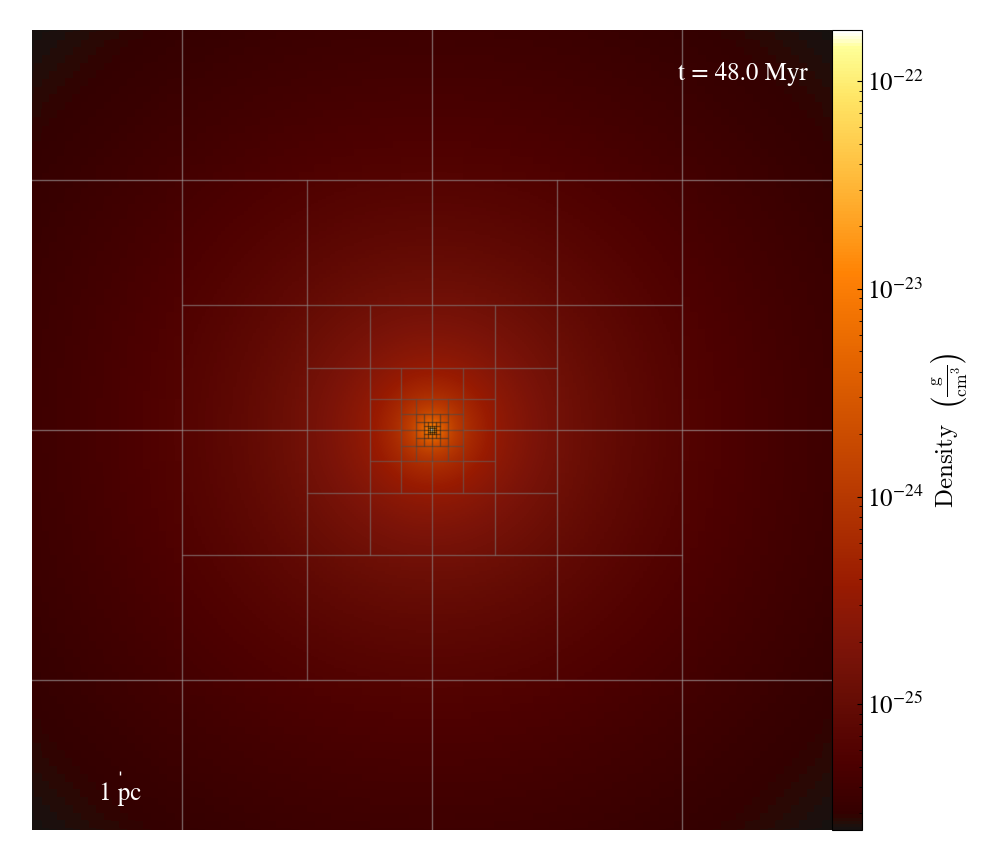

In [20]:
slc = yt.SlicePlot(ds, "x", ('gas','density'),width=(12.8, "kpc"))#, center=[-0.01,-0.01,-0.01])
slc.set_unit(("gas", "density"), "g/cm**3")
slc.set_cmap(('gas','density'), 'afmhot_10us') #'afmhot_10us'
# slc.annotate_velocity(factor=16, normalize=True, alpha=0.5, )
# slc.annotate_quiver(
#    ("gas", "velocity_x"),
#    ("gas", "velocity_y"),
#    factor=16,
#    color="green",
#    normalize=False,
#    #scale=1.6
# )
# slc.annotate_marker((0, 0), coord_system="plot", color="blue", s=100)
slc.annotate_grids(alpha=0.3)
slc.annotate_scale(corner='lower_left', coeff=1, unit='pc')
# slc.annotate_sphere([0,0,0],radius=(31.8,"kpc"))
slc.annotate_timestamp(time_unit="Myr",corner='upper_right')
# slc.annotate_streamlines(('gas','velocity_y'),('gas','velocity_z'), density=2)
# slc.set_log(('gas','density'),True)
# slc.set_axes_unit("kpc")
# slc.swap_axes()
# slc.flip_vertical()
slc.hide_axes()
slc.show()

In [62]:
ds.r['gas','density'].min()

unyt_quantity(8.37328454e+09, 'code_mass/code_length**3')

In [63]:
ds.r['gas','pressure'].min()

unyt_quantity(1365857.18949076, 'code_pressure')

yt : [INFO     ] 2024-05-29 11:08:15,801 xlim = -0.001563 0.001563
yt : [INFO     ] 2024-05-29 11:08:15,802 ylim = -0.001563 0.001563
yt : [INFO     ] 2024-05-29 11:08:15,805 xlim = -0.001563 0.001563
yt : [INFO     ] 2024-05-29 11:08:15,806 ylim = -0.001563 0.001563
yt : [INFO     ] 2024-05-29 11:08:15,810 Making a fixed resolution buffer of (('gas', 'number_density')) 800 by 800



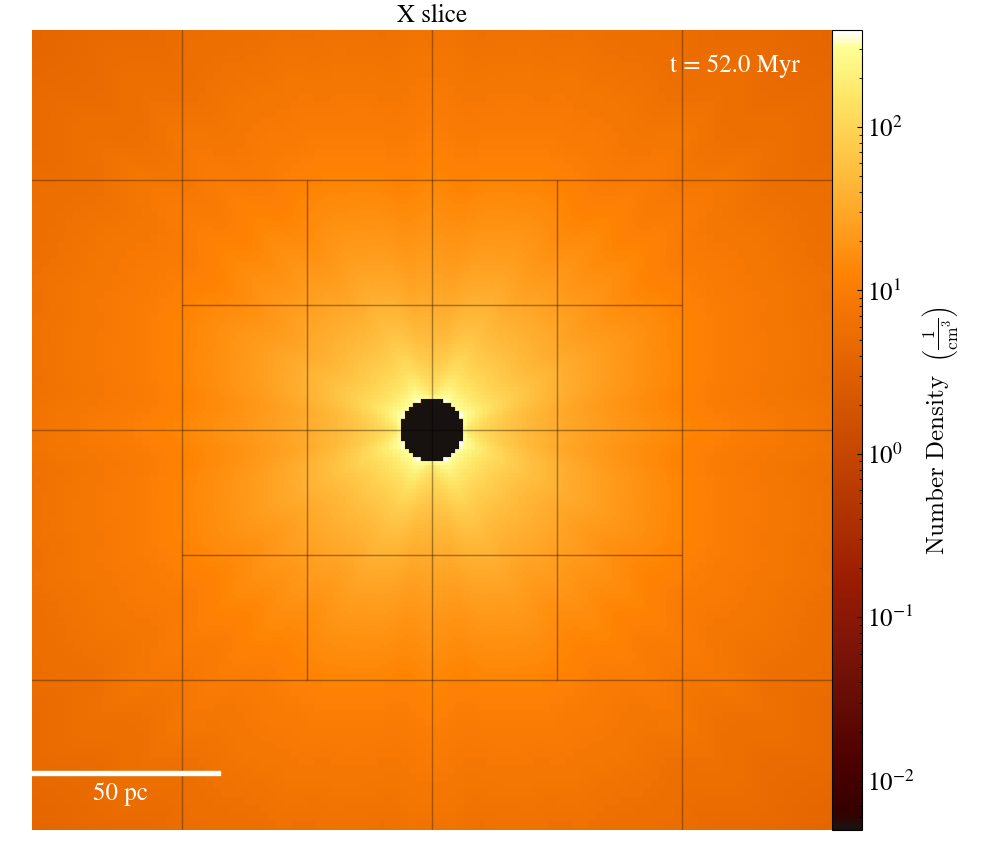

In [3]:
from yt.units import kpc, pc
slc = yt.SlicePlot(ds, "y", ('gas','number_density'),width=(0.2, "kpc"), center=[0., 0., 0.])
slc.set_unit(("gas", "number_density"), "cm**-3")
slc.set_cmap(('gas','number_density'), 'afmhot_10us')
# slc.annotate_velocity(factor=16, normalize=True)
slc.annotate_title("X slice")
slc.annotate_grids(alpha=0.2)
slc.annotate_scale(coeff=50, unit="pc",corner='lower_left')
# slc.annotate_streamlines(('gas','velocity_x'),('gas','velocity_y'),factor=4, density=2 )
# slc.annotate_sphere([0,0,0], radius=(0.64,"kpc"),circle_args={'color':'black'})
slc.annotate_timestamp(time_unit="Myr",corner='upper_right')
# slc.set_zlim(('gas','number_density'),zmin=3.e-1,zmax=1.e5)
slc.set_log(('gas','number_density'),True)
slc.set_axes_unit("kpc")
slc.swap_axes()
# slc.flip_vertical()
slc.hide_axes()
slc.show()

yt : [INFO     ] 2024-05-29 11:08:26,900 xlim = -0.000781 0.000781
yt : [INFO     ] 2024-05-29 11:08:26,900 ylim = -0.000781 0.000781
yt : [INFO     ] 2024-05-29 11:08:26,903 xlim = -0.000781 0.000781
yt : [INFO     ] 2024-05-29 11:08:26,904 ylim = -0.000781 0.000781
yt : [INFO     ] 2024-05-29 11:08:26,904 Making a fixed resolution buffer of (('gas', 'pressure')) 800 by 800



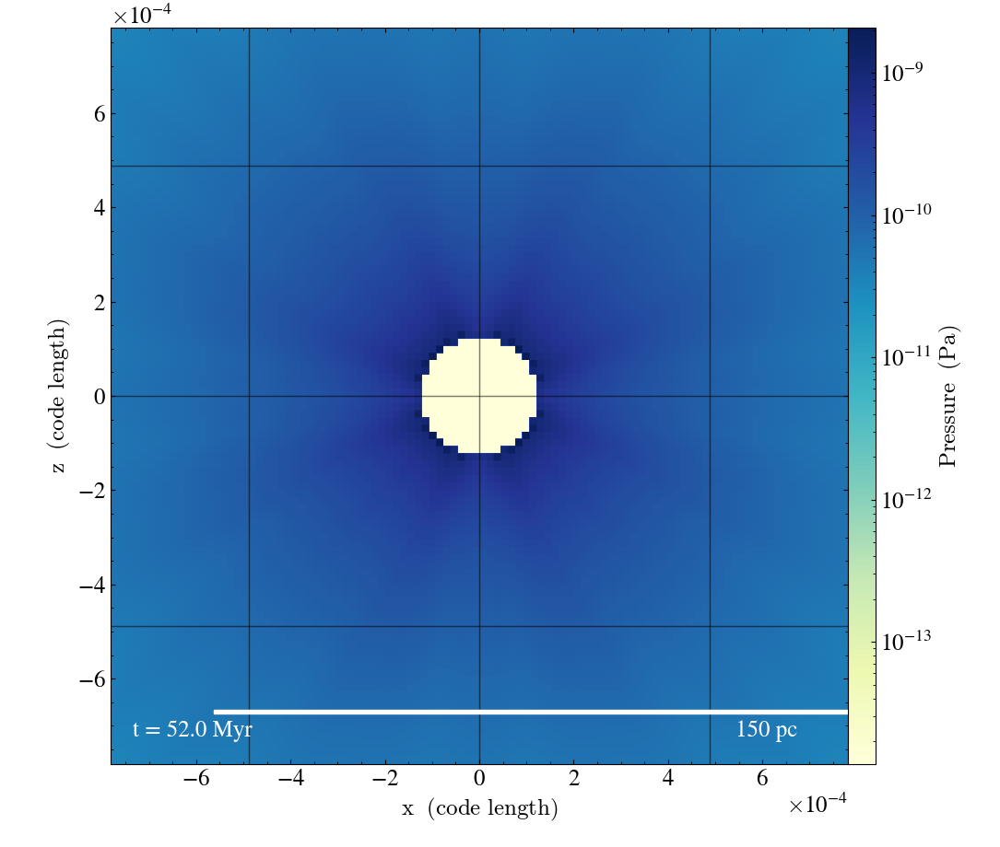

In [5]:
slc = yt.SlicePlot(ds, "y", ('gas','pressure'),width=(0.1, "kpc"))
slc.set_unit(("gas", "pressure"), "Pa")#"Msun/(Mpc*Myr**2)"
slc.set_cmap(('gas','pressure'), 'YlGnBu') #'jet_r'
# slc.annotate_velocity(factor=8, normalize=False)
slc.annotate_grids(alpha=0.3)
slc.annotate_scale(coeff=150,unit='pc')
slc.annotate_timestamp(time_unit="Myr")
slc.set_log(('gas','pressure'),True)
# slc.set_zlim(('gas','pressure'),zmin=4.e-11, zmax=7.e-10)
slc.swap_axes()
slc.show()

Plot refinement level

yt : [INFO     ] 2024-05-29 10:19:02,663 xlim = -0.015625 0.015625
yt : [INFO     ] 2024-05-29 10:19:02,663 ylim = -0.015625 0.015625
yt : [INFO     ] 2024-05-29 10:19:02,666 xlim = -0.015625 0.015625
yt : [INFO     ] 2024-05-29 10:19:02,666 ylim = -0.015625 0.015625
yt : [INFO     ] 2024-05-29 10:19:02,667 Making a fixed resolution buffer of (('gas', 'vr')) 800 by 800



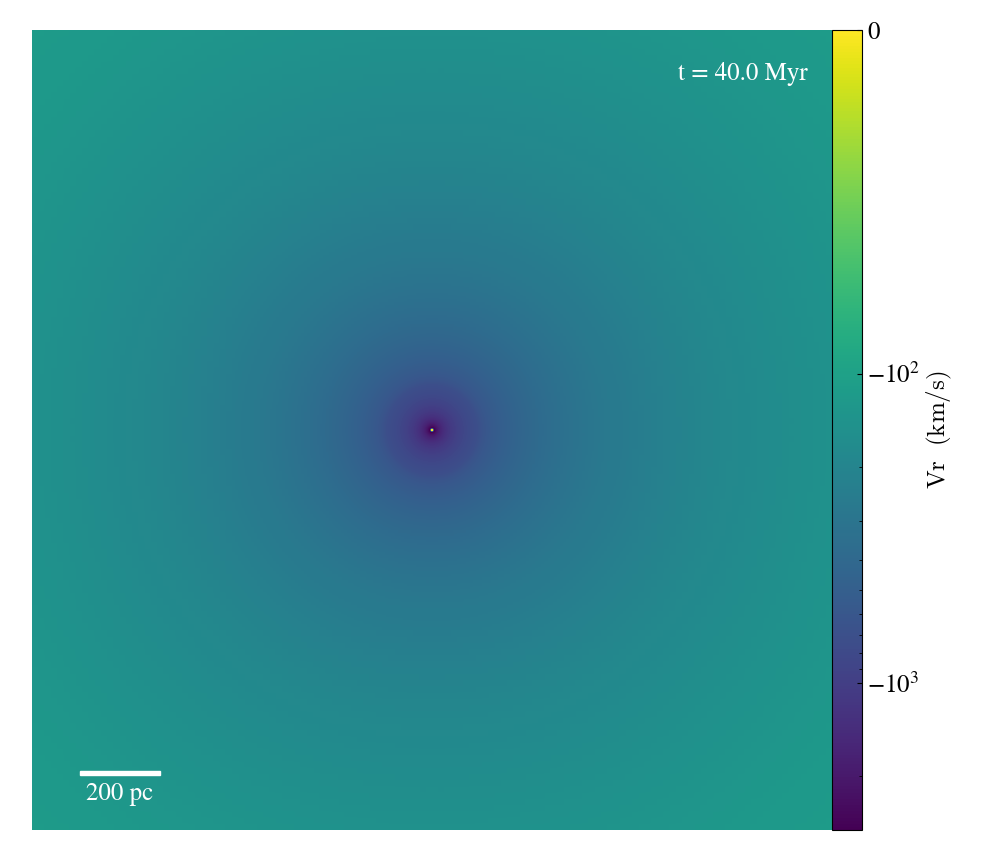

In [16]:
# Create a slice plot of the refinement level
field = ("gas", "vr")
slc = yt.SlicePlot(ds, "x", field, width=(2.0, "kpc"))
slc.set_unit(field, "km/s")
slc.set_cmap(field, "viridis")
slc.set_log(field, linthresh=1.e2)
# slc.set_zlim(field, 1.e-5, 1.e3)
# slc.annotate_grids(alpha=0.3)
slc.annotate_scale(coeff=200,unit="pc", corner="lower_left")
slc.annotate_timestamp(time_unit="Myr", corner="upper_right")
slc.hide_axes()
slc.show()


In [78]:
1.e1 / np.sqrt(8.e3)

0.11180339887498948

In [108]:
315/9

35.0

Sound speed

yt : [INFO     ] 2024-03-31 00:19:29,608 xlim = -0.468750 0.468750
yt : [INFO     ] 2024-03-31 00:19:29,609 ylim = -0.468750 0.468750
yt : [INFO     ] 2024-03-31 00:19:29,609 xlim = -0.468750 0.468750
yt : [INFO     ] 2024-03-31 00:19:29,609 ylim = -0.468750 0.468750
yt : [INFO     ] 2024-03-31 00:19:29,610 Making a fixed resolution buffer of (('gas', 'sound_speed')) 800 by 800



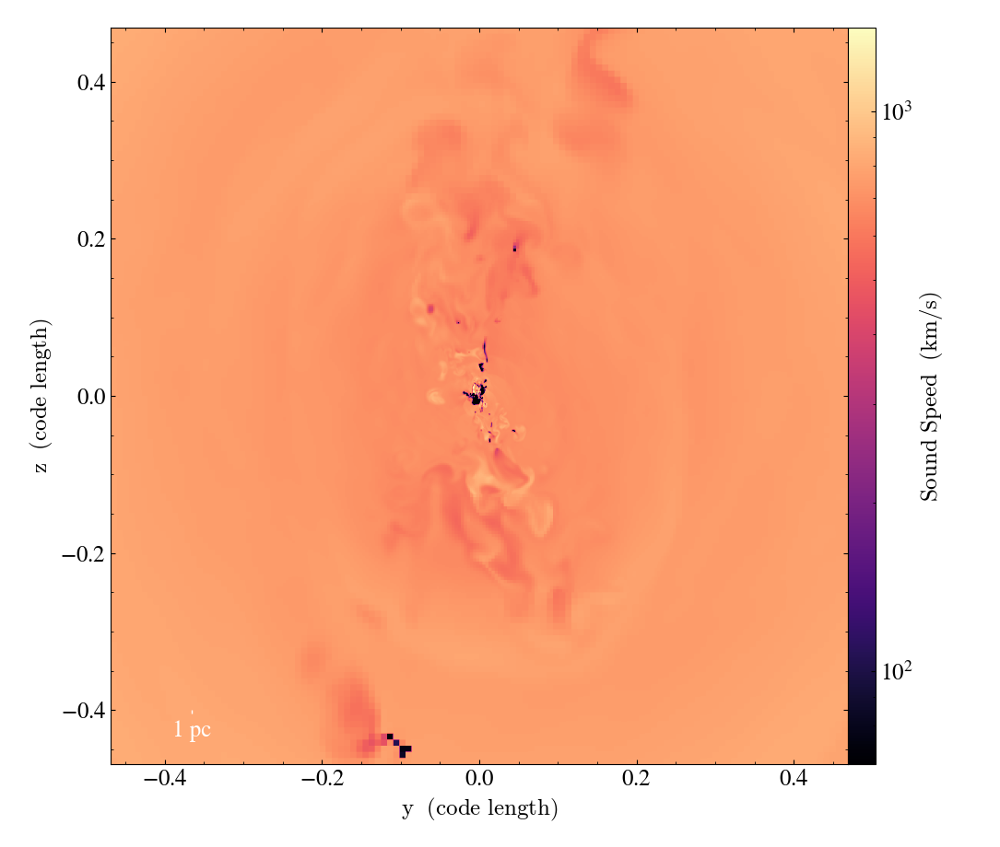

In [89]:
# Create a slice plot of the sound speed
slc = yt.SlicePlot(ds, "x", ("gas", "sound_speed"), width=(60, "kpc"))
slc.set_unit(("gas", "sound_speed"), "km/s")
slc.set_cmap(("gas", "sound_speed"), "magma")
slc.set_log(("gas", "sound_speed"), True)
slc.annotate_scale(unit="pc", corner="lower_left")
slc.show()

Temperature

yt : [INFO     ] 2024-05-29 10:44:09,605 xlim = -0.000781 0.000781
yt : [INFO     ] 2024-05-29 10:44:09,605 ylim = -0.000781 0.000781
yt : [INFO     ] 2024-05-29 10:44:09,608 xlim = -0.000781 0.000781
yt : [INFO     ] 2024-05-29 10:44:09,609 ylim = -0.000781 0.000781
yt : [INFO     ] 2024-05-29 10:44:09,610 Making a fixed resolution buffer of (('gas', 'temperature')) 800 by 800



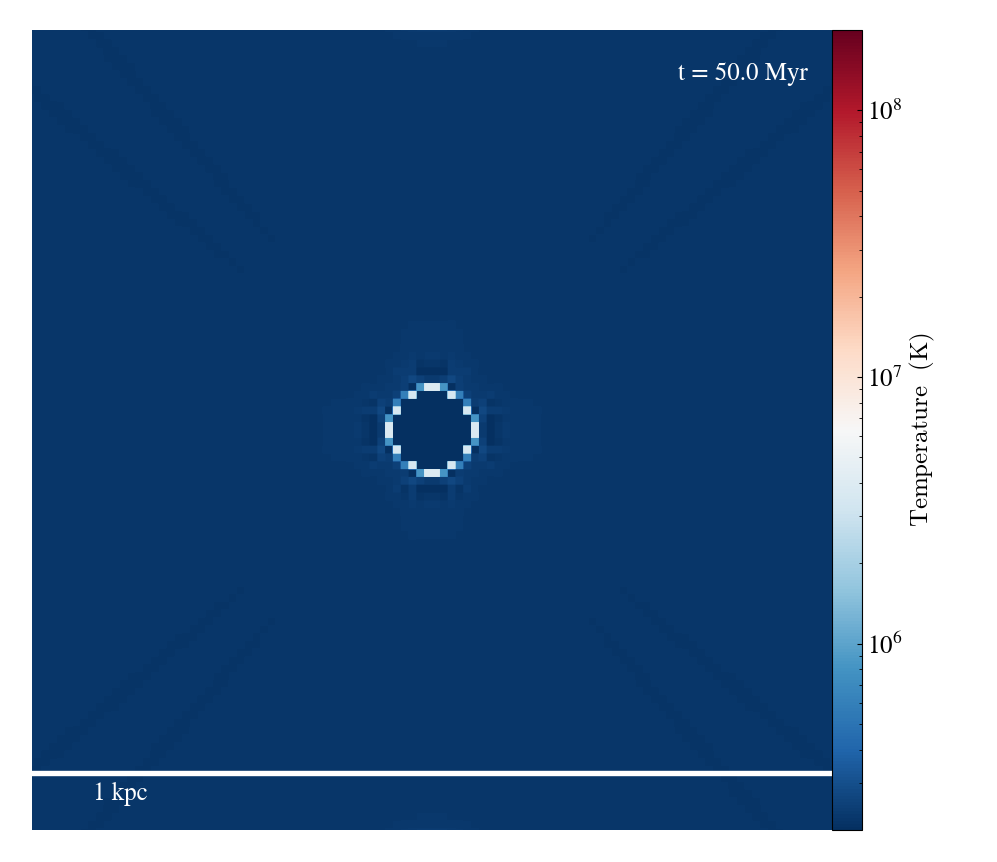

In [4]:
# infalling_gas = ds.all_data()
# infalling_gas = infalling_gas.cut_region(["(obj['vr'] < 0.)"])
slc = yt.SlicePlot(ds, "x", ("gas", "temperature"), width=((0.1e0, "kpc"),(0.1e0, "kpc")))
slc.set_unit(("gas", "temperature"), "K")
slc.set_cmap(("gas", "temperature"), "RdBu_r")
slc.set_axes_unit("kpc")
# slc.annotate_streamlines(('gas','velocity_y'),('gas','velocity_z'),factor=2, density=3)
slc.set_zlim(("gas", "temperature"), 2.e5, 2.e8)
slc.hide_axes()
slc.annotate_scale(coeff=1, unit="kpc", corner='lower_left')
slc.annotate_timestamp(time_unit="Myr",corner='upper_right')
# slc.annotate_text((.05, .94), "f = 0.9", coord_system="axis", text_args={"color": "white"})


Create radial density/pressure/radial velocity profile

In [70]:
my_sphere = ds.sphere("c", (1.0, "kpc"))
disk = my_sphere.cut_region(["(obj['temperature'].in_units('K') < 1.e6)"])
plot_type = ("gas", "tangential_velocity")
plot = yt.ProfilePlot(disk, ("index", "radius"), plot_type, weight_field=("gas","mass"))


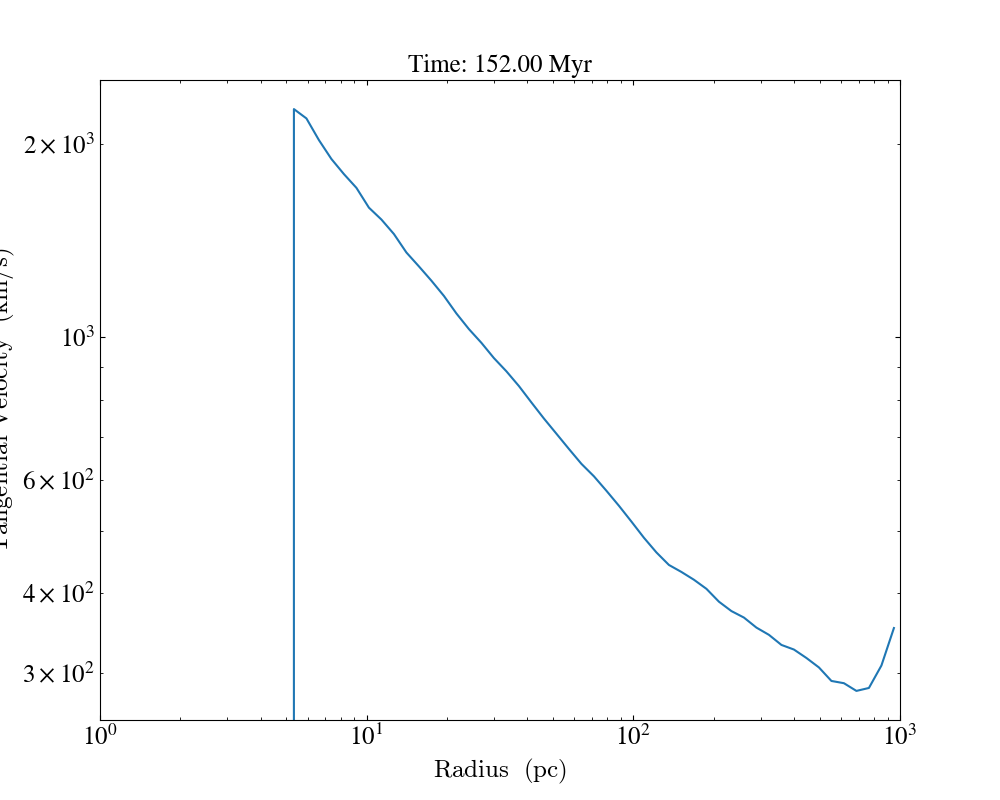

In [71]:
from yt.units import pc
plot.set_unit(("index", "radius"), "pc")
plot.set_log(("index", "radius"), True)
plot.annotate_title(f"Time: {ds.current_time.to('Myr'):.2f}")
plot.set_log(plot_type, True)
plot.set_xlim(1*pc,1.e3*pc)
plot.set_unit(plot_type, "km/s")
plot.show()

Calculate orbital period

In [112]:
speed = 5e3 # km/s = pc/Myr
radius = 1 # pc

circumference = 2*np.pi*radius
period = circumference / speed

print(f"Period: {period*1.e3:.3f} kyr")

Period: 1.257 kyr


Normalized angular momentum z

In [98]:
my_sphere = ds.sphere("c", (1.0, "kpc"))
disk = my_sphere.cut_region(["obj['temperature'].in_units('K') < 1.e6"])
plot_type = ("gas", "normalized_angular_momentum_z")
plot = yt.ProfilePlot(disk, ("index", "radius"), plot_type, weight_field=("gas","volume"))


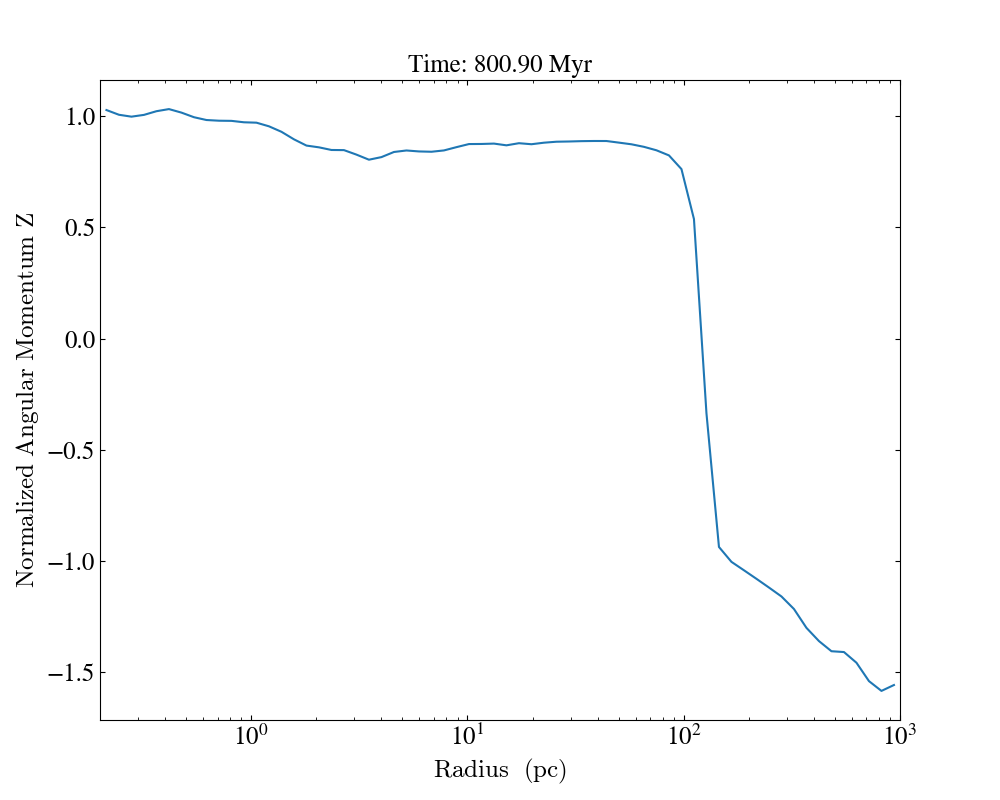

In [99]:
plot.set_unit(("index", "radius"), "pc")
plot.set_log(("index", "radius"), True)
plot.annotate_title(f"Time: {ds.current_time.to('Myr'):.2f}")
plot.set_log(plot_type, False)
plot.set_xlim(0.2*pc,1.e3*pc)
# plot.set_unit(plot_type, "km/s")
plot.show()

yt : [WARNING  ] 2023-11-23 14:36:09,484 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-23 14:36:09,485 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-23 14:36:09,485 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-23 14:36:09,486 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-23 14:36:09,487 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-23 14:36:09,533 Parameters: current_time              = 15.001000019732876
yt : [INFO     ] 2023-11-23 14:36:09,533 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-23 14:36:09,534 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-23 14:36:09,535 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-23 14:36:09,535 Parameters: cosmological_simulation   = 0
yt : [WARNING  ] 2023-11-23 14:36:12,588 Overriding code units: Use this opt

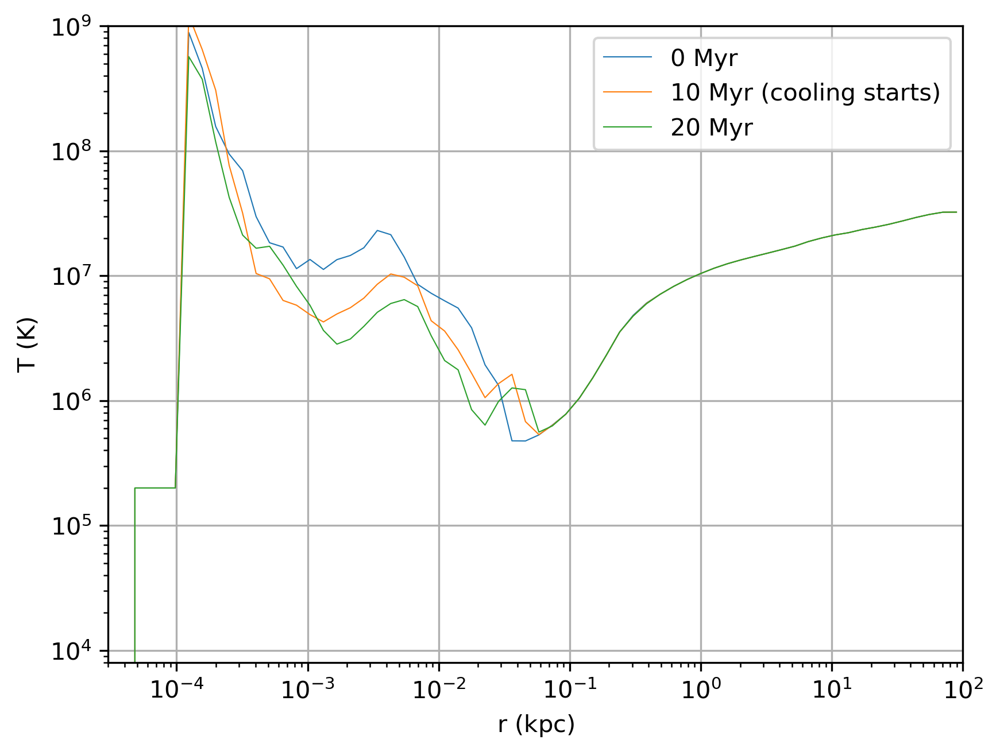

In [27]:
import matplotlib.pyplot as plt
from yt import physical_constants as phc

def plotNumberDensityProfile(path, base_ext, n, units_override, maxR):
    fig = plt.figure(dpi=300)
    ax = fig.add_subplot(111)
    for i in n:
        ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=i),units_override=units_override)
        sp0 = ds.sphere("c", maxR)
        rp0 = yt.create_profile(
            sp0,
            ("index", "radius"),
            ("gas", "number_density"),
            units={("index", "radius"): "kpc"},
            logs={("index", "radius"): True},
        )
        ax.loglog(
            rp0.x.value,
            rp0[("gas", "number_density")].in_units("cm**-3").value,
            linewidth=0.5,
        )
        
    ax.set_xlabel(r"$\mathrm{r\ (kpc)}$")
    ax.set_ylabel(r"$\mathrm{n\ (cm^{-3})}$")
    # ax.set_title(f"Time: {ds.current_time.to('Myr'):.0f}")
    ax.set_xlim(1.e-2,4e2)
    ax.set_ylim(3.e-4, 50.)
    ax.grid("on")
    # ax.legend(["100 Myr (cooling starts)", "104 Myr", "108 Myr", "112 Myr", "116 Myr", "120 Myr", "124 Myr"]) #(["1.51 Gyr", "1.52 Gyr", "1.53 Gyr"])
    fig.show()

    #fig.savefig(f"radial_profiles/numberDensity {ds.current_time.to('Myr'):.0f}.png")

def plotPressureProfile(path, base_ext, n, units_override, maxR):

    
    fig = plt.figure(dpi=300)
    ax = fig.add_subplot(111)
    for i in n:
        ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=i),units_override=units_override)
        sp0 = ds.sphere("c", maxR)
        rp0 = yt.create_profile(
            sp0,
            ("index", "radius"),
            ("gas", "pressure"),
            units={("index", "radius"): "kpc"},
            logs={("index", "radius"): True},
        )
        ax.loglog(
            rp0.x.value,
            rp0[("gas", "pressure")].in_units("Pa").value,
            linewidth=0.5,
        )
        
    ax.set_xlabel(r"$\mathrm{r\ (kpc)}$")
    ax.set_ylabel(r"$\mathrm{P\ (Pa)}$")
    # ax.set_title(f"Time: {ds.current_time.to('Myr'):.0f}")
    ax.set_xlim(1.e-2,4e2)
    ax.set_ylim(5.e-15, 5.e-10)
    ax.grid("on")
    # ax.legend(["100 Myr (cooling starts)", "104 Myr", "108 Myr", "112 Myr", "116 Myr", "120 Myr", "124 Myr"]) #(["1.51 Gyr", "1.52 Gyr", "1.53 Gyr"])
    fig.show()

    #fig.savefig(f"radial_profiles/innerBC/numberDensity {ds.current_time.to('Myr'):.0f}.png")

def plotTemperatureProfile(path, base_ext, n, units_override, maxR):

    
    fig = plt.figure(dpi=300)
    ax = fig.add_subplot(111)
    for i in n:
        ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=i),units_override=units_override)
        sp0 = ds.sphere("c", maxR)
        rp0 = yt.create_profile(
            sp0,
            ("index", "radius"),
            ("gas", "temperature"),
            units={("index", "radius"): "kpc"},
            logs={("index", "radius"): True},
        )
        ax.loglog(
            rp0.x.value,
            rp0[("gas", "temperature")].in_units("K").value,
            linewidth=0.5,
        )
        
    ax.set_xlabel(r"$\mathrm{r\ (kpc)}$")
    ax.set_ylabel(r"$\mathrm{T\ (K)}$")
    # ax.set_title(f"Time: {ds.current_time.to('Myr'):.0f}")
    ax.set_xlim(3.e-5,1e2)
    ax.set_ylim(8.e3, 1.e9)
    ax.grid("on")
    ax.legend(["0 Myr", "10 Myr (cooling starts)", "20 Myr", "40 Myr", "60 Myr", "80 Myr", "100 Myr"])#(["1.45 Gyr", "1.50 Gyr", "1.55 Gyr", "1.60 Gyr", "1.65 Gyr"])
    fig.show()

    #fig.savefig(f"radial_profiles/innerBC/temperature {ds.current_time.to('Myr'):.0f}.png")

n = range(31,34,1)
# plotNumberDensityProfile(path, base_ext, n, units_override, (30, "kpc"))
# plotPressureProfile(path,base_ext,n,units_override, (300,"kpc"))
plotTemperatureProfile(path, base_ext, n, units_override, (100, "kpc"))


Create radial velocity profile

yt : [WARNING  ] 2023-07-12 23:49:05,654 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-07-12 23:49:05,655 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-07-12 23:49:05,655 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-07-12 23:49:05,656 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-07-12 23:49:05,656 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-07-12 23:49:05,675 Parameters: current_time              = 3.8000093
yt : [INFO     ] 2023-07-12 23:49:05,676 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-07-12 23:49:05,677 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-07-12 23:49:05,678 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-12 23:49:05,678 Parameters: cosmological_simulation   = 0


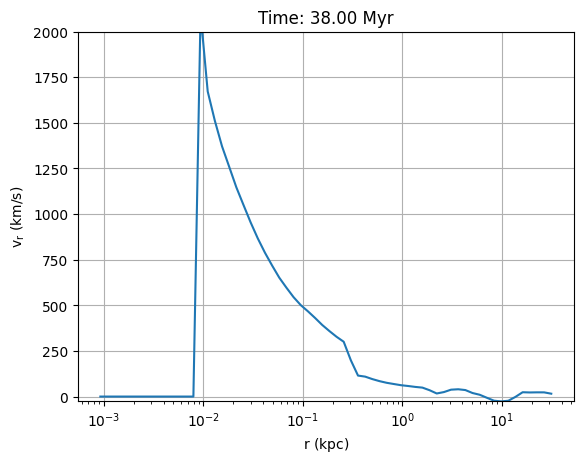

In [1195]:
import matplotlib.pyplot as plt

def plotRadialVelocityProfile(ds, maxR):
    sp0 = ds.sphere("c", maxR)
    rp0 = yt.create_profile(
        sp0,
        ("index", "radius"),
        ("gas", "radial_velocity"),
        units={("index", "radius"): "kpc"},
        logs={("index", "radius"): True},
    )

    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.semilogx(
        rp0.x.value,
        rp0[("gas", "radial_velocity")].in_units("km/s").value,
    )
    ax.set_xlabel(r"$\mathrm{r\ (kpc)}$")
    ax.set_ylabel(r"$\mathrm{v_r\ (km/s)}$")
    ax.set_title(f"Time: {ds.current_time.to('Myr'):.2f}")
    ax.set_ylim(-25, 2000)
    ax.grid("on")

    fig.savefig(f"radial_profiles/Cooling/radialVelocity {ds.current_time.to('Myr'):.1f}.png")

for i in range(19,20):
    ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=i),units_override=units_override)
    plotRadialVelocityProfile(ds, (34, "kpc"))

Calculate the cooling rate of the galaxy

In [48]:
# ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=i),units_override=units_override)
vrSphere = ds.sphere("c", (128.0, "kpc"))

plot = yt.ProfilePlot(vrSphere, ("index", "radius"), ("gas", "cooling_time"))


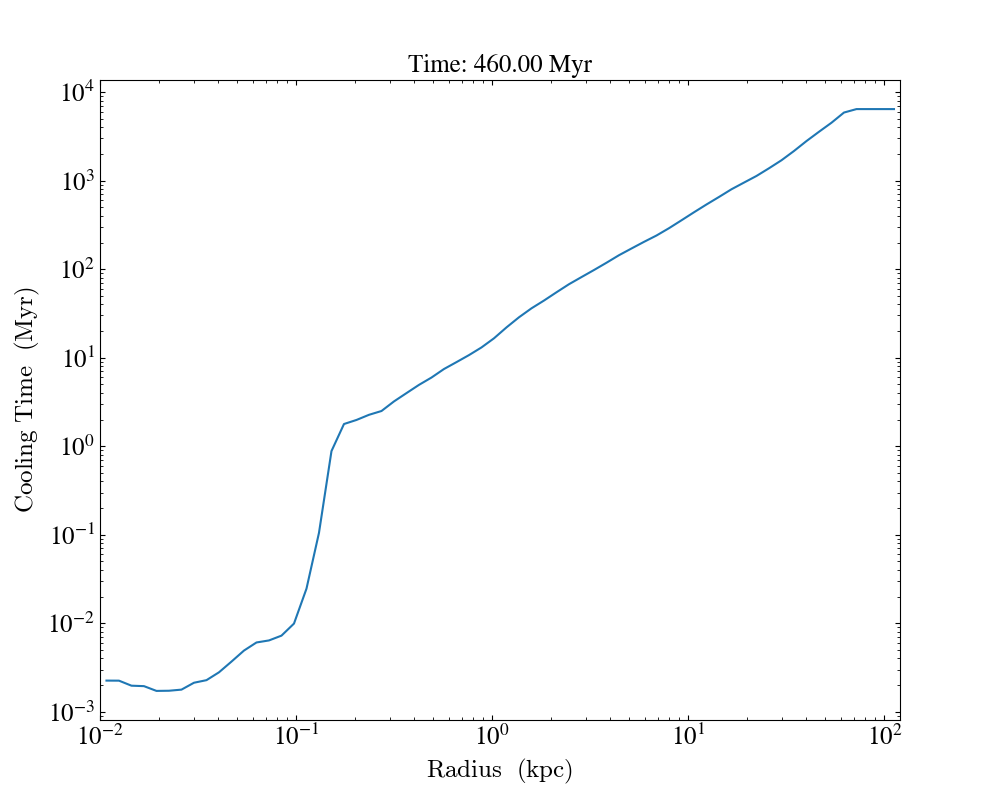

In [49]:
plot.set_unit(("index", "radius"), "kpc")
plot.set_log(("index", "radius"), True)
plot.annotate_title(f"Time: {ds.current_time.to('Myr'):.2f}")
plot.set_log(("gas", "cooling_time"), True)
plot.set_xlim(1.e-2*kpc,120*kpc)
# plot.set_ylim(("gas", "Temperature"), -3, 3)
plot.set_unit(("gas", "cooling_time"), "Myr")
plot.show()

In [52]:
# Find the the radius where t_cool < 3 Gyr (McDonald+2018)
sp01 = ds.sphere("c",(40,"kpc"))
coolingMass = sp01.quantities.total_quantity(("gas", "mass"))
print("Total gas mass = ", coolingMass.to("Msun"))

coolingRate = coolingMass / (3 * ds.units.Gyr)
print("Cooling rate = ", coolingRate.to("Msun/yr"))

Total gas mass =  29730530124.11673 Msun
Cooling rate =  9.910176708038913 Msun/yr


Create slice plot profiles

yt : [WARNING  ] 2024-02-14 14:21:31,082 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:31,083 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:31,084 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:31,085 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:31,085 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:31,132 Parameters: current_time              = 80.00000002628413
yt : [INFO     ] 2024-02-14 14:21:31,133 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:31,133 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:31,134 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:31,134 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:31,757 xlim = -0.007812 0.007812
yt : [INFO


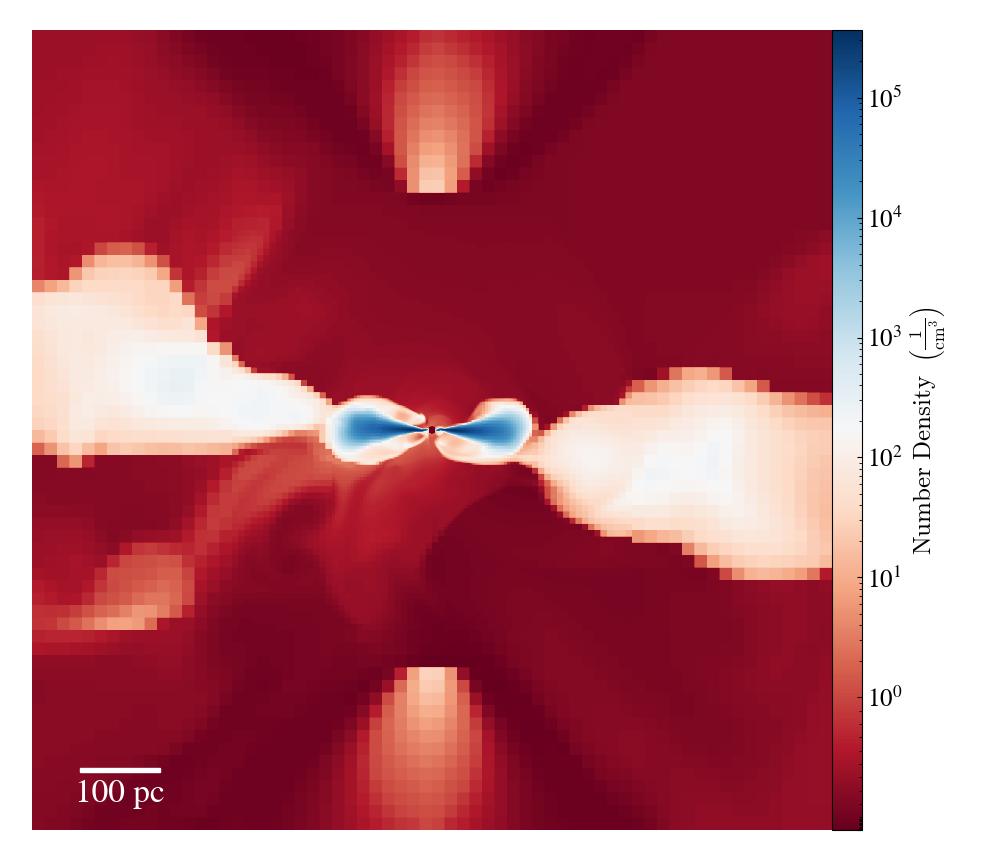

yt : [WARNING  ] 2024-02-14 14:21:32,937 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:32,938 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:32,939 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:32,940 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:32,940 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:32,989 Parameters: current_time              = 81.0000048116856
yt : [INFO     ] 2024-02-14 14:21:32,990 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:32,990 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:32,991 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:32,992 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:33,572 xlim = -0.007812 0.007812
yt : [INFO 


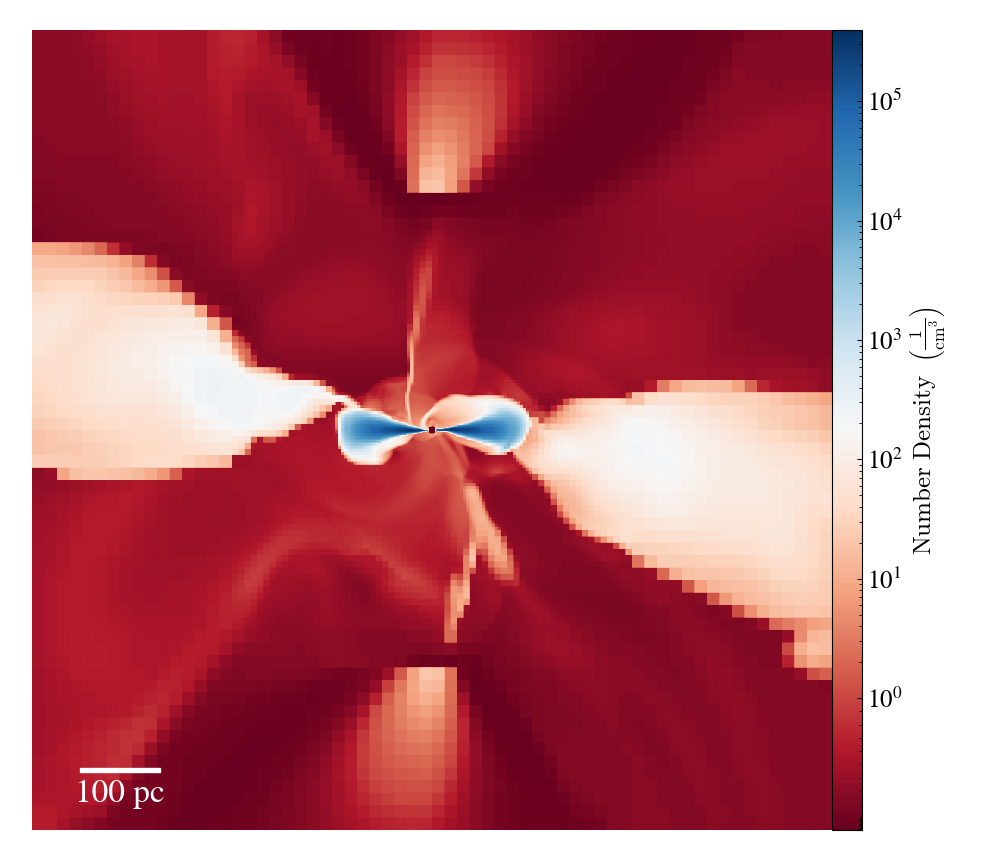

yt : [WARNING  ] 2024-02-14 14:21:34,511 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:34,512 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:34,512 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:34,513 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:34,514 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:34,560 Parameters: current_time              = 82.00000371281693
yt : [INFO     ] 2024-02-14 14:21:34,561 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:34,561 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:34,562 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:34,562 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:35,496 xlim = -0.007812 0.007812
yt : [INFO


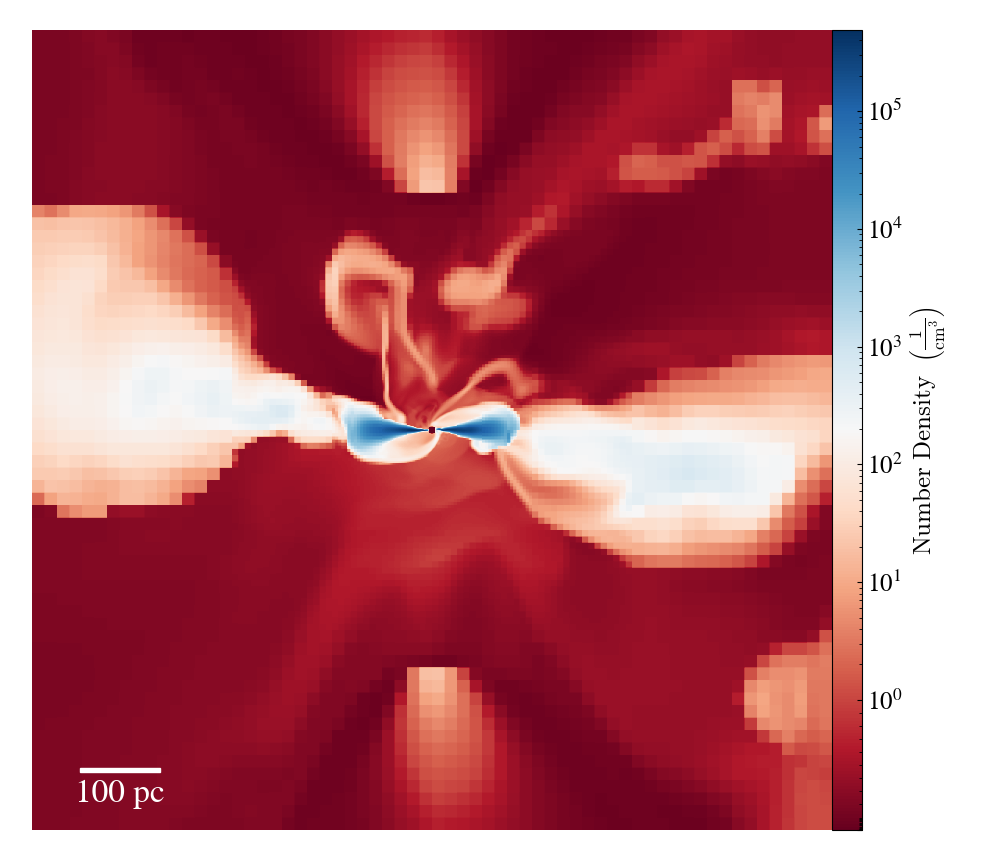

yt : [WARNING  ] 2024-02-14 14:21:36,418 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:36,419 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:36,420 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:36,421 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:36,421 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:36,467 Parameters: current_time              = 83.00000127514997
yt : [INFO     ] 2024-02-14 14:21:36,467 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:36,468 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:36,468 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:36,469 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:37,033 xlim = -0.007812 0.007812
yt : [INFO


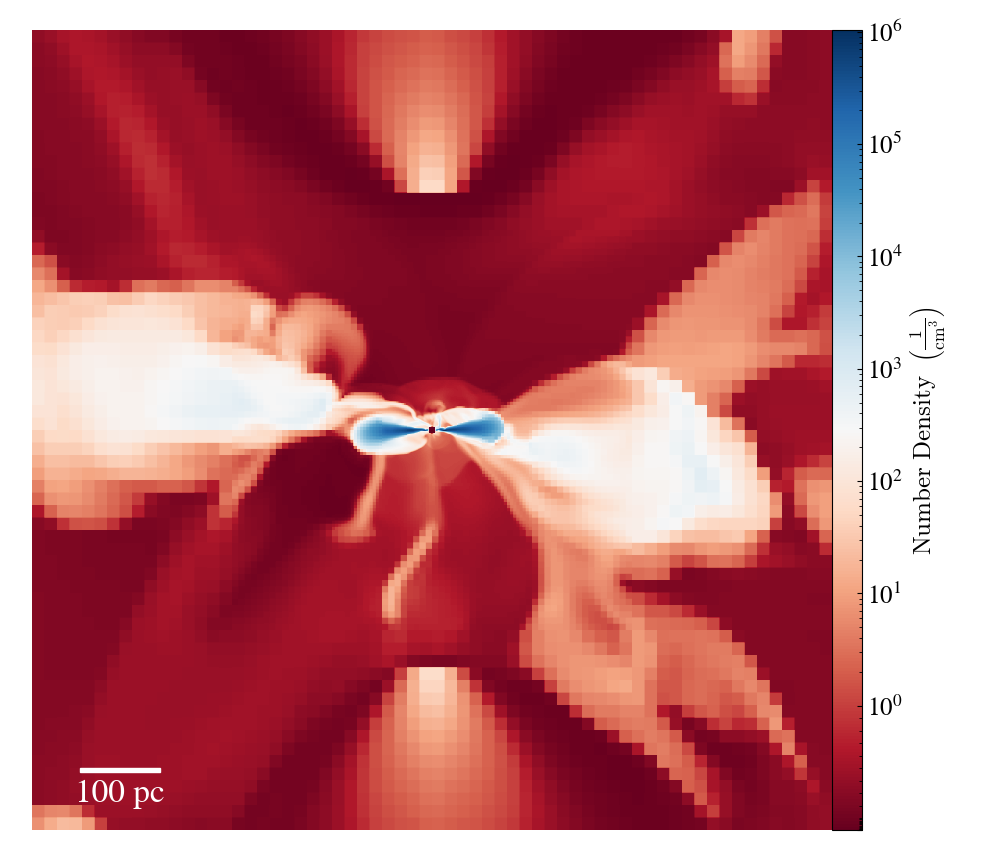

yt : [WARNING  ] 2024-02-14 14:21:38,241 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:38,242 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:38,243 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:38,244 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:38,244 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:38,290 Parameters: current_time              = 84.00000532127167
yt : [INFO     ] 2024-02-14 14:21:38,291 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:38,291 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:38,292 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:38,292 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:38,842 xlim = -0.007812 0.007812
yt : [INFO


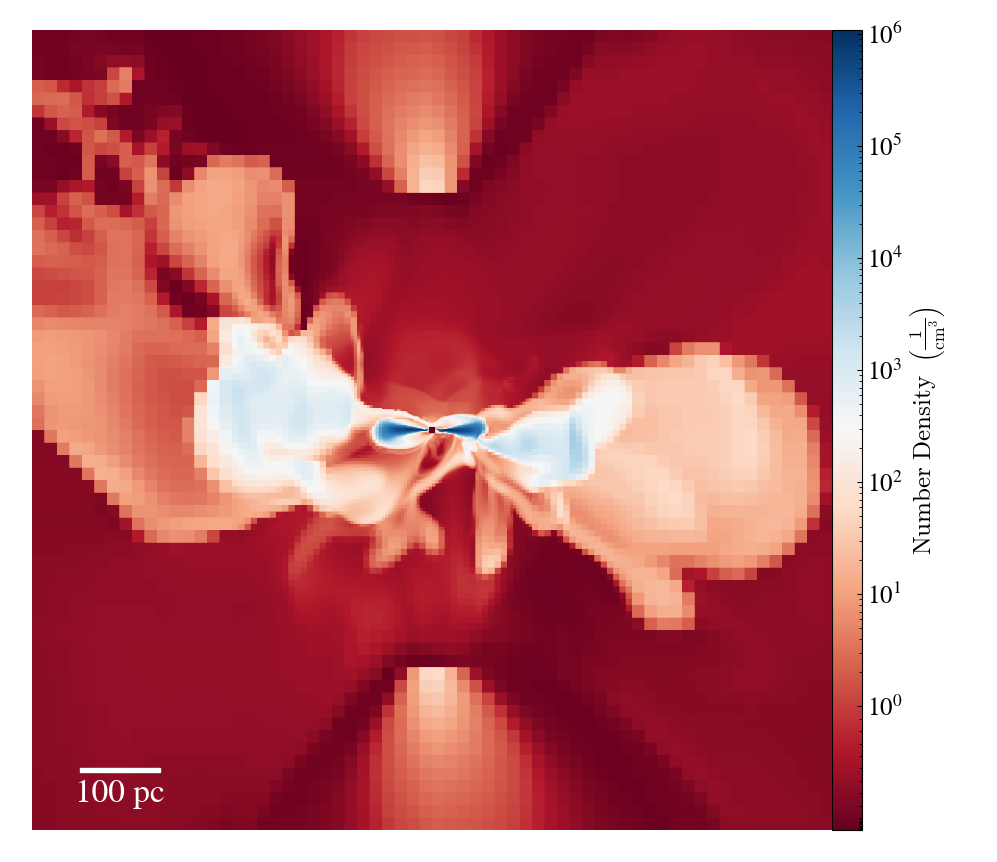

yt : [WARNING  ] 2024-02-14 14:21:39,734 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:39,735 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:39,736 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:39,736 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:39,737 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:39,783 Parameters: current_time              = 85.00000079455405
yt : [INFO     ] 2024-02-14 14:21:39,783 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:39,784 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:39,784 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:39,785 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:40,638 xlim = -0.007812 0.007812
yt : [INFO


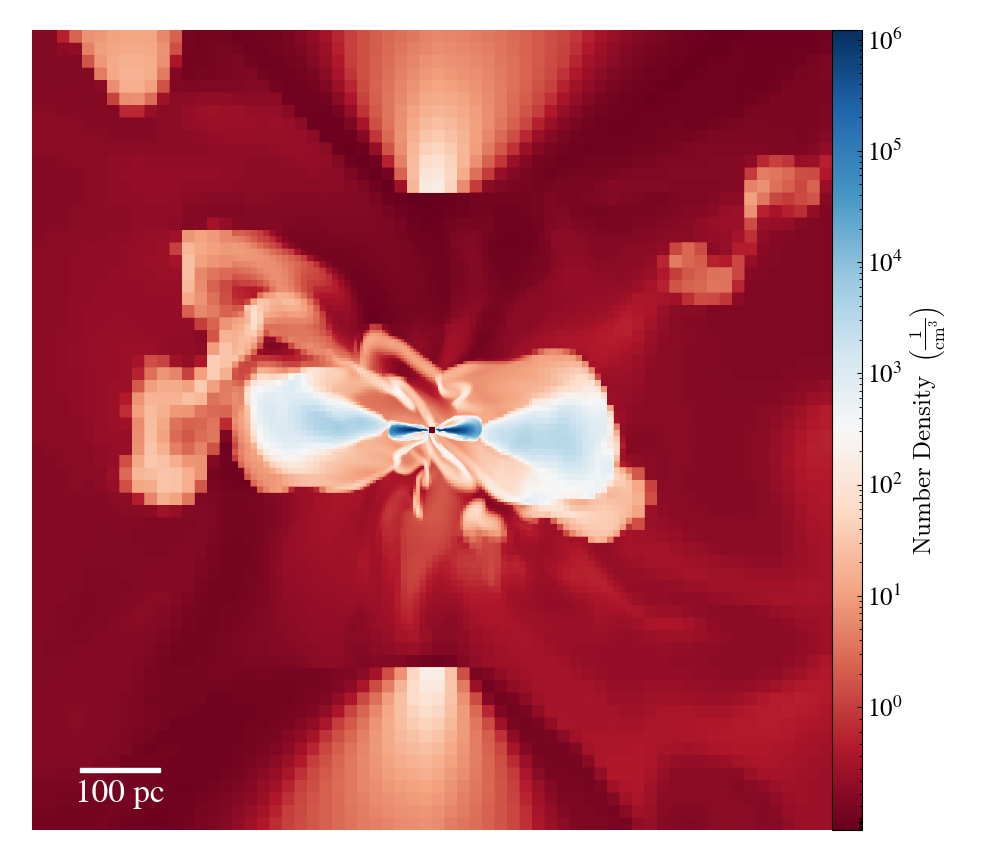

yt : [WARNING  ] 2024-02-14 14:21:41,525 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:41,525 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:41,526 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:41,527 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:41,527 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:41,573 Parameters: current_time              = 86.00000487631651
yt : [INFO     ] 2024-02-14 14:21:41,574 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:41,574 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:41,575 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:41,576 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:42,087 xlim = -0.007812 0.007812
yt : [INFO


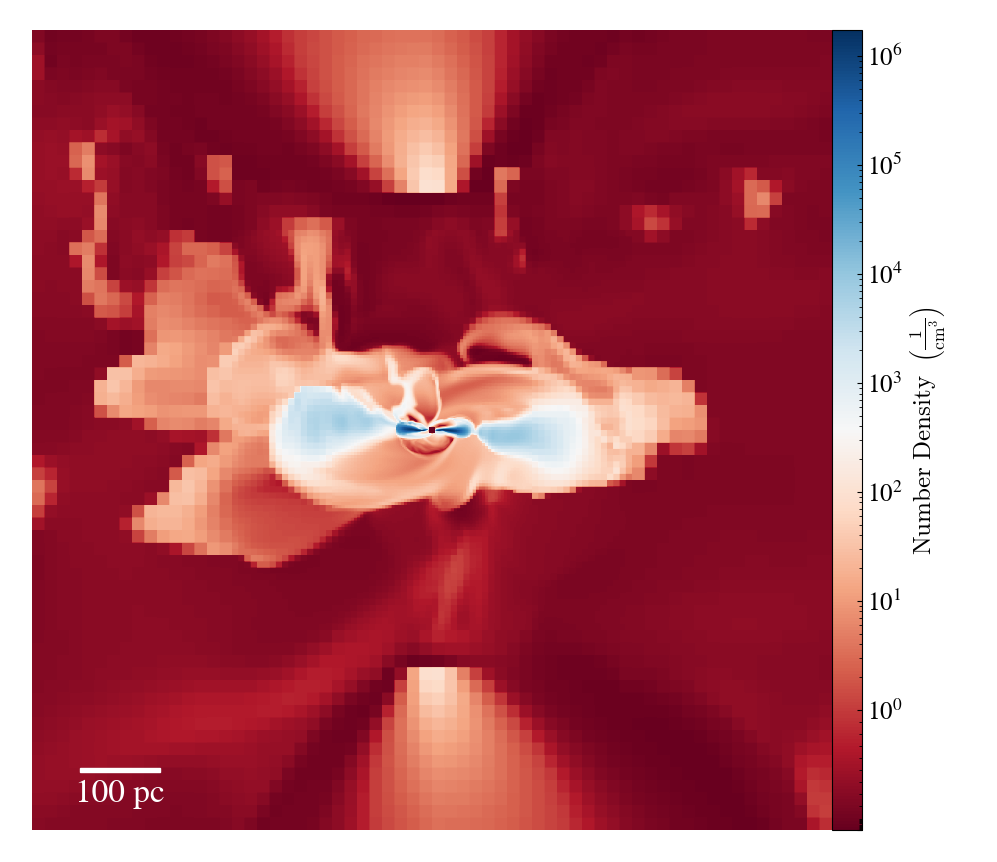

yt : [WARNING  ] 2024-02-14 14:21:42,887 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:42,888 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:42,888 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:42,889 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:42,890 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:42,936 Parameters: current_time              = 87.00000626565236
yt : [INFO     ] 2024-02-14 14:21:42,937 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:42,938 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:42,938 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:42,939 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:43,824 xlim = -0.007812 0.007812
yt : [INFO


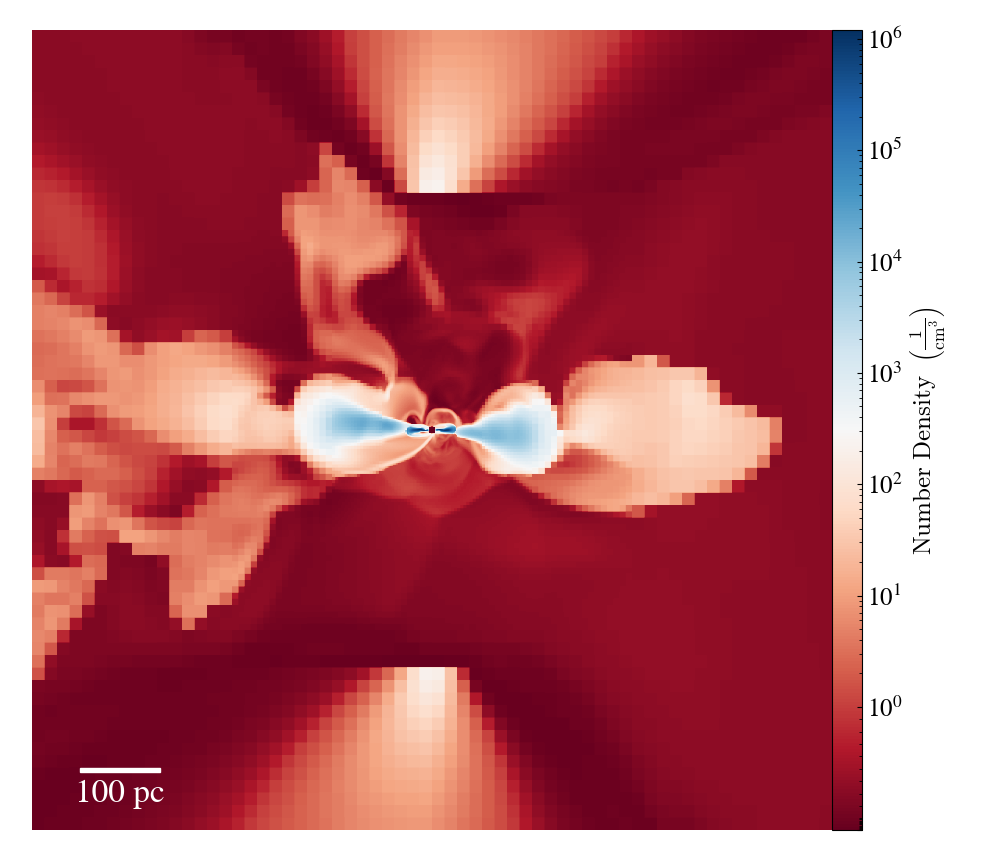

yt : [WARNING  ] 2024-02-14 14:21:44,718 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:44,719 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:44,719 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:44,720 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:44,721 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:44,766 Parameters: current_time              = 88.00000049232574
yt : [INFO     ] 2024-02-14 14:21:44,766 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:44,767 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:44,768 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:44,768 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:45,637 xlim = -0.007812 0.007812
yt : [INFO


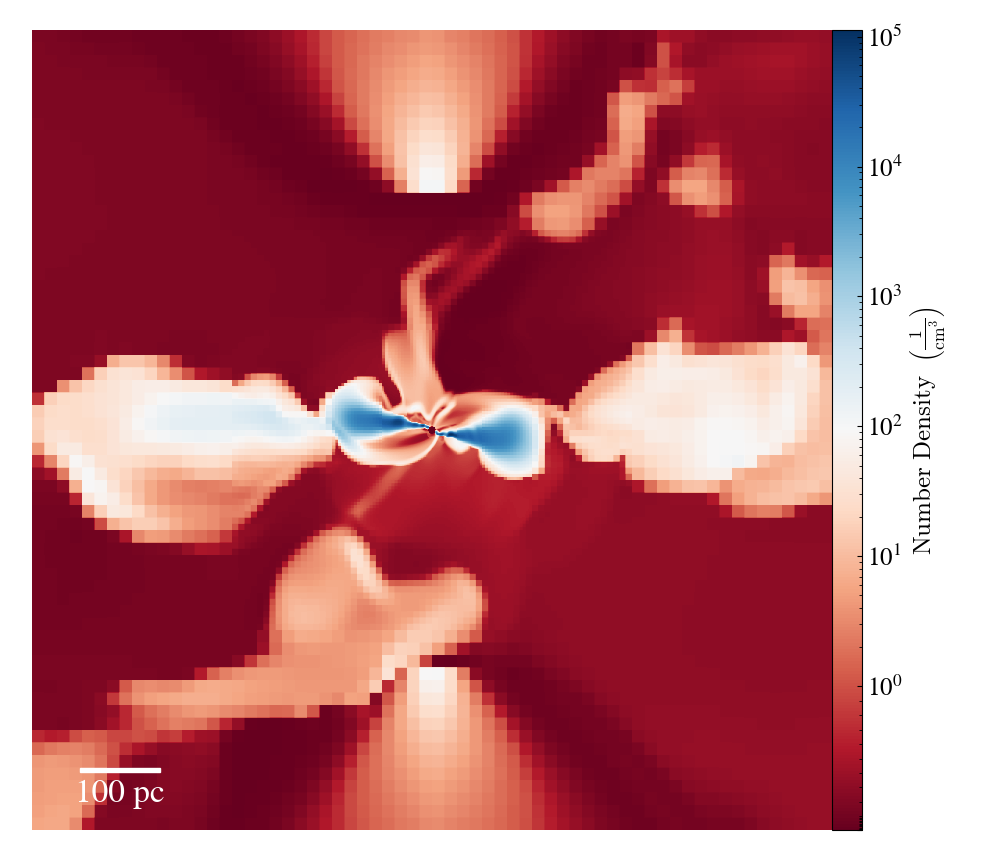

yt : [WARNING  ] 2024-02-14 14:21:46,650 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:46,651 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:46,652 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:46,652 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:46,653 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:46,698 Parameters: current_time              = 89.00000081280511
yt : [INFO     ] 2024-02-14 14:21:46,698 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:46,699 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:46,700 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:46,700 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:47,280 xlim = -0.007812 0.007812
yt : [INFO


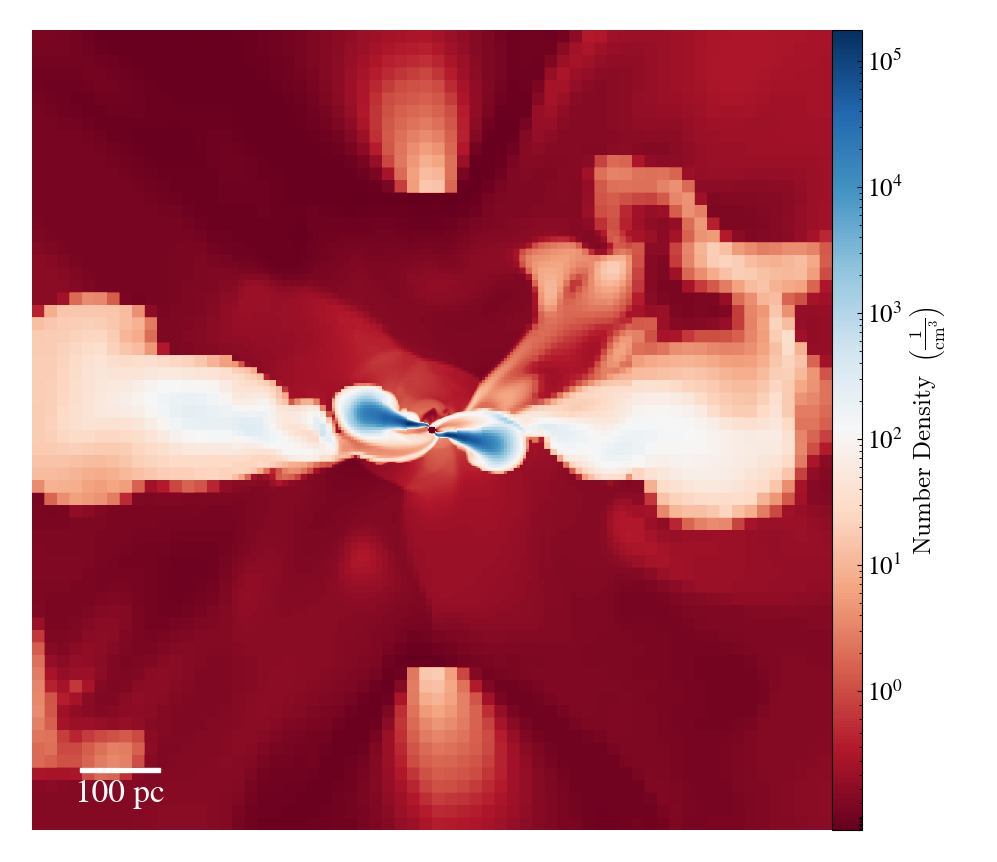

yt : [WARNING  ] 2024-02-14 14:21:48,170 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:48,170 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:48,171 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:48,172 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:48,173 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:48,219 Parameters: current_time              = 90.00000162214094
yt : [INFO     ] 2024-02-14 14:21:48,219 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:48,220 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:48,220 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:48,221 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:49,128 xlim = -0.007812 0.007812
yt : [INFO


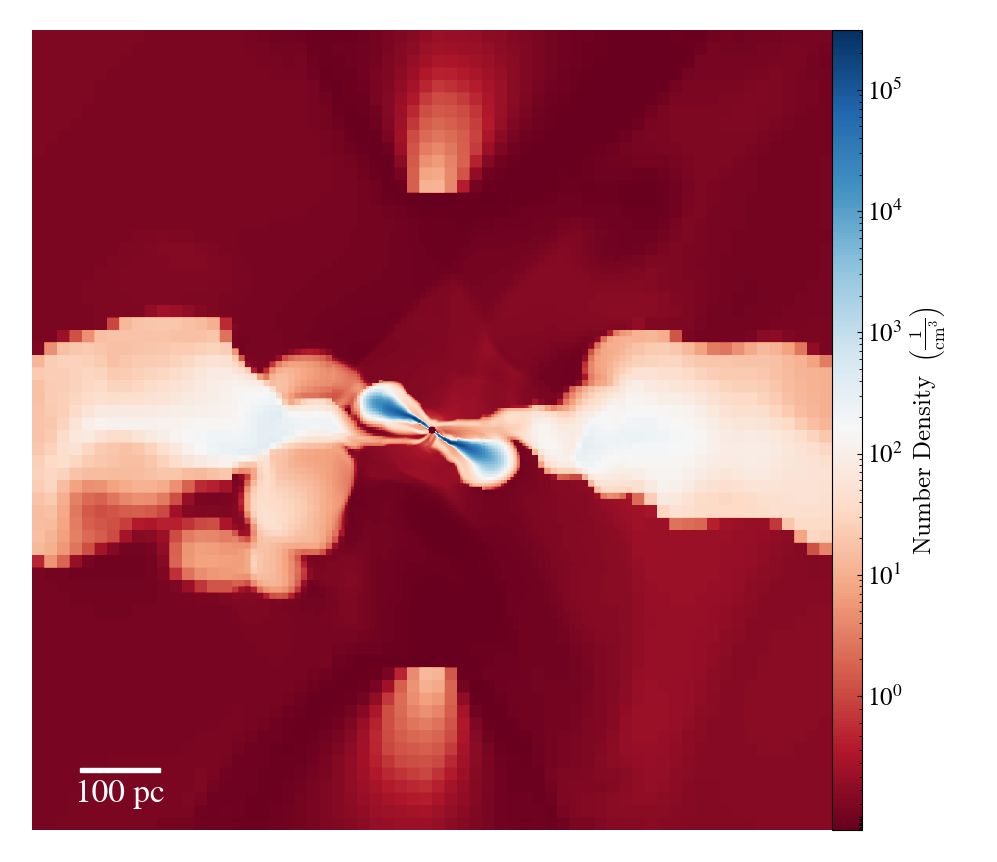

yt : [WARNING  ] 2024-02-14 14:21:50,028 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:50,029 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:50,030 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:50,030 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:50,031 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:50,078 Parameters: current_time              = 91.00000228411129
yt : [INFO     ] 2024-02-14 14:21:50,078 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:50,079 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:50,079 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:50,080 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:50,642 xlim = -0.007812 0.007812
yt : [INFO


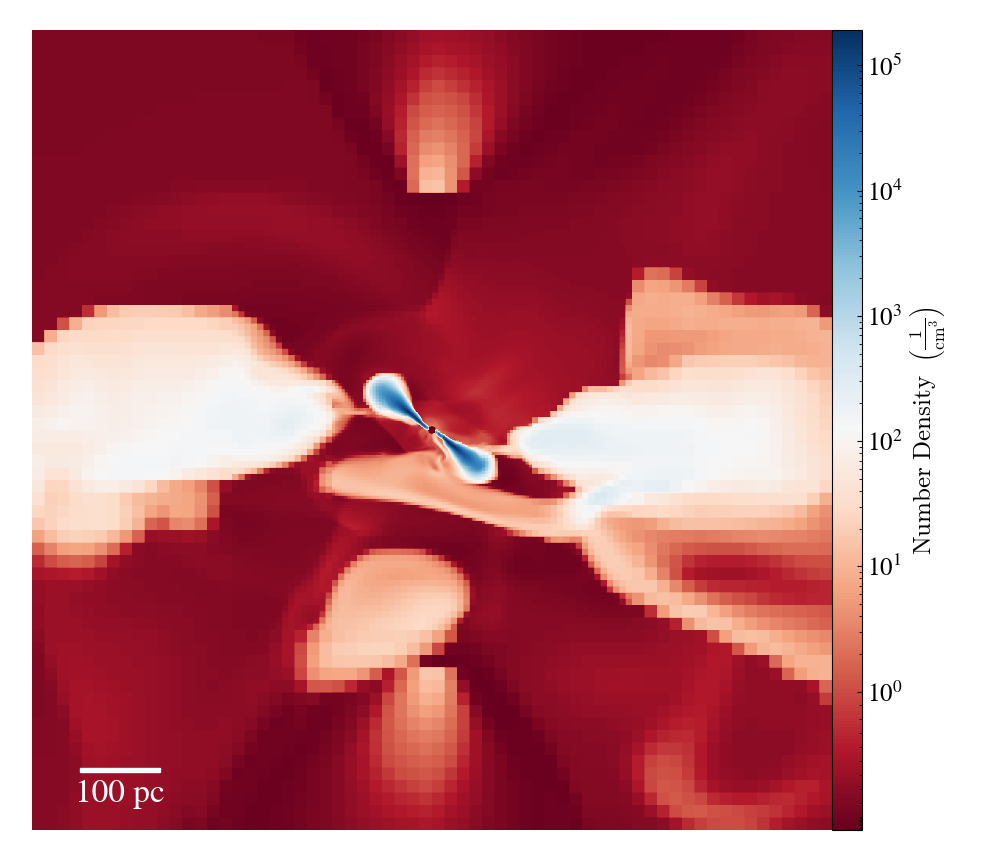

yt : [WARNING  ] 2024-02-14 14:21:51,842 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-14 14:21:51,842 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-14 14:21:51,843 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-14 14:21:51,844 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-14 14:21:51,844 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-14 14:21:51,891 Parameters: current_time              = 92.0000017390584
yt : [INFO     ] 2024-02-14 14:21:51,892 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-14 14:21:51,892 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-14 14:21:51,893 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-14 14:21:51,893 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-14 14:21:52,442 xlim = -0.007812 0.007812
yt : [INFO 


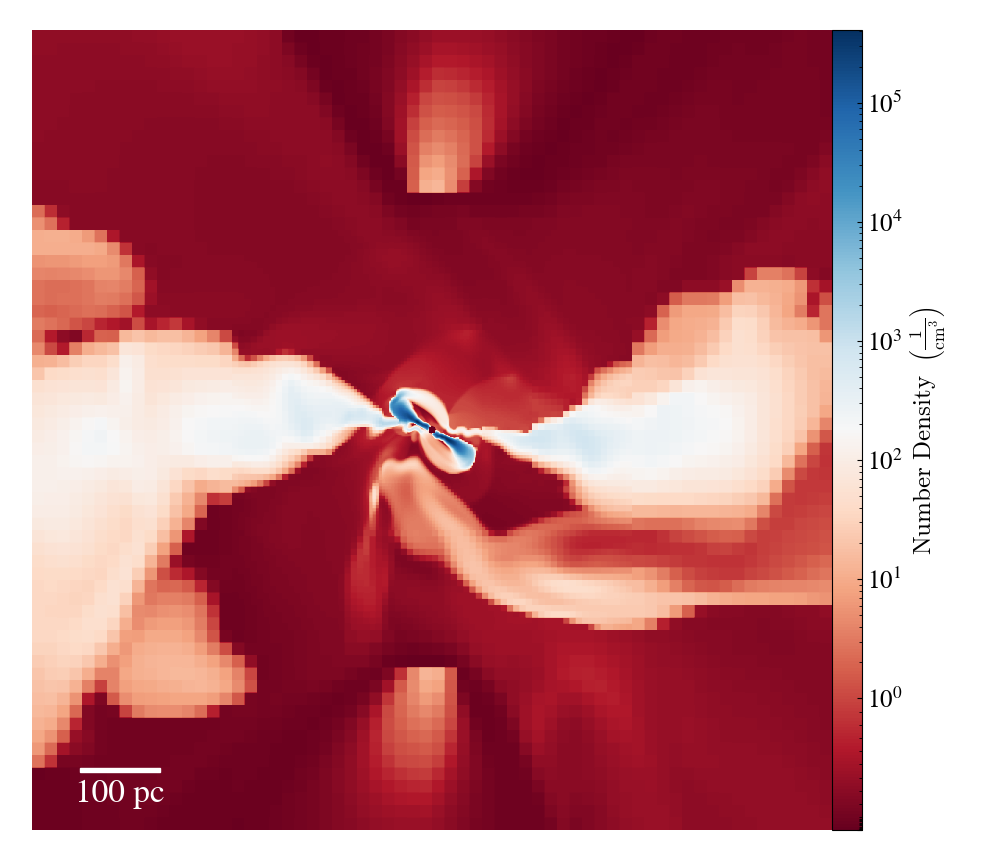

In [10]:
from yt import physical_constants as phc
def makeSlicePlot (data, fields, slice, width):
    sl = yt.SlicePlot(data, slice, fields,width=width)
    sl.set_unit(fields, "cm**-3")
    sl.set_cmap(fields, 'RdBu')
    # sl.annotate_velocity(factor=16, normalize=True)
    # sl.annotate_title(f"Time: {ds.current_time.to('Myr'):.1f}")
    # sl.annotate_timestamp(time_unit="Myr",corner='upper_right',text_args={"color":"black",'size':24})
    sl.annotate_scale(coeff=width[0]*100, unit="pc",corner='lower_left',text_args={'size':24})
    # sl.annotate_grids(alpha=0.2)
    # sl.annotate_contour(("gas","temperature"))
    sl.set_log(fields, linthresh=1.)
    # sl.set_zlim(field=fields, zmin=-1.e1, zmax=0)
    sl.hide_axes()
    sl.show()

for i in range(160, 185, 2):
    ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=i),units_override=units_override)
    makeSlicePlot(data=ds, fields=('gas', 'number_density'), slice="x", width=(1.e0, "kpc"))

yt : [WARNING  ] 2023-11-30 17:38:49,398 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:38:49,399 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:38:49,400 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:38:49,400 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:38:49,401 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:38:49,447 Parameters: current_time              = 80.00200001544172
yt : [INFO     ] 2023-11-30 17:38:49,447 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:38:49,448 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:38:49,448 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:38:49,449 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:38:51,192 xlim = -0.004687 0.004687
yt : [INFO


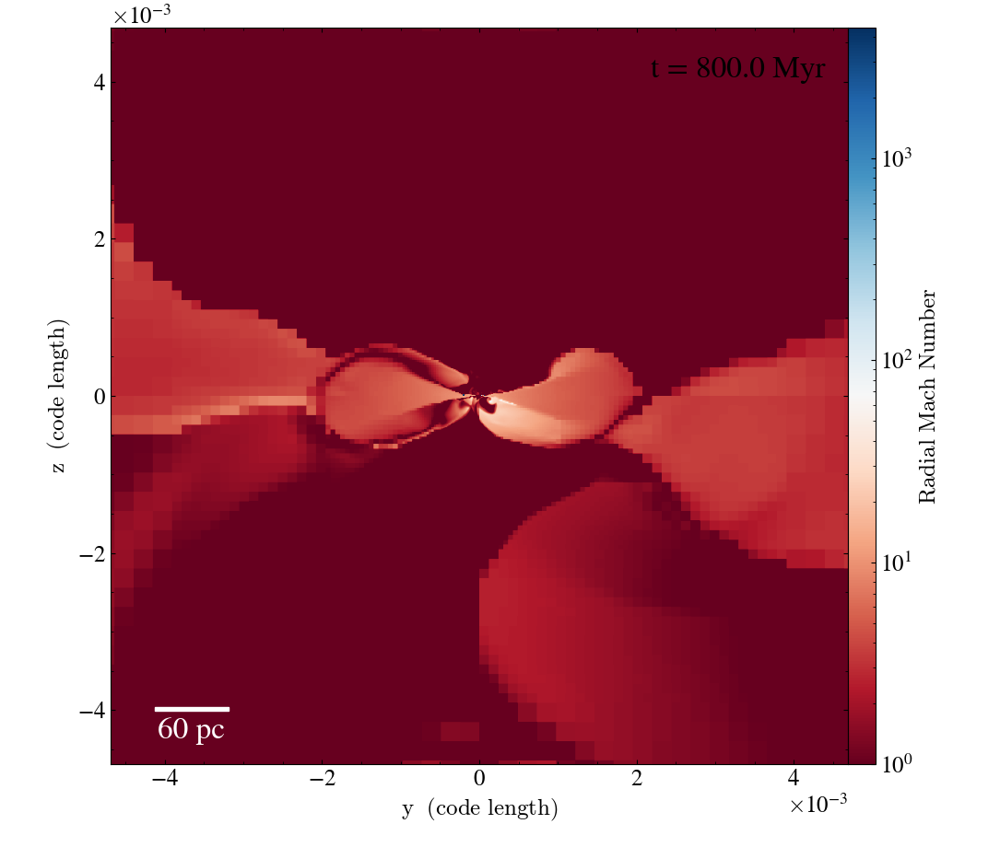

yt : [WARNING  ] 2023-11-30 17:38:51,970 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:38:51,971 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:38:51,971 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:38:51,972 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:38:51,973 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:38:52,017 Parameters: current_time              = 80.01200002528391
yt : [INFO     ] 2023-11-30 17:38:52,017 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:38:52,018 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:38:52,018 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:38:52,019 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:38:53,933 xlim = -0.004687 0.004687
yt : [INFO


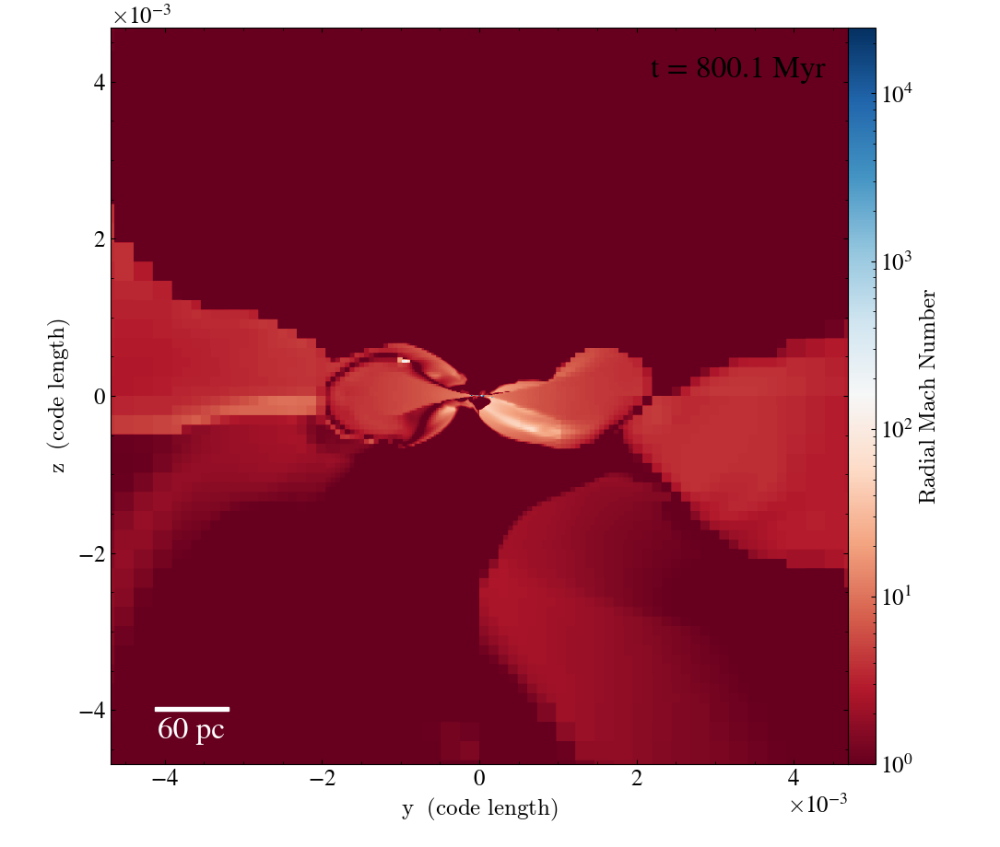

yt : [WARNING  ] 2023-11-30 17:38:54,684 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:38:54,684 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:38:54,685 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:38:54,686 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:38:54,687 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:38:54,732 Parameters: current_time              = 80.02200002929375
yt : [INFO     ] 2023-11-30 17:38:54,733 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:38:54,733 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:38:54,734 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:38:54,734 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:38:57,388 xlim = -0.004687 0.004687
yt : [INFO


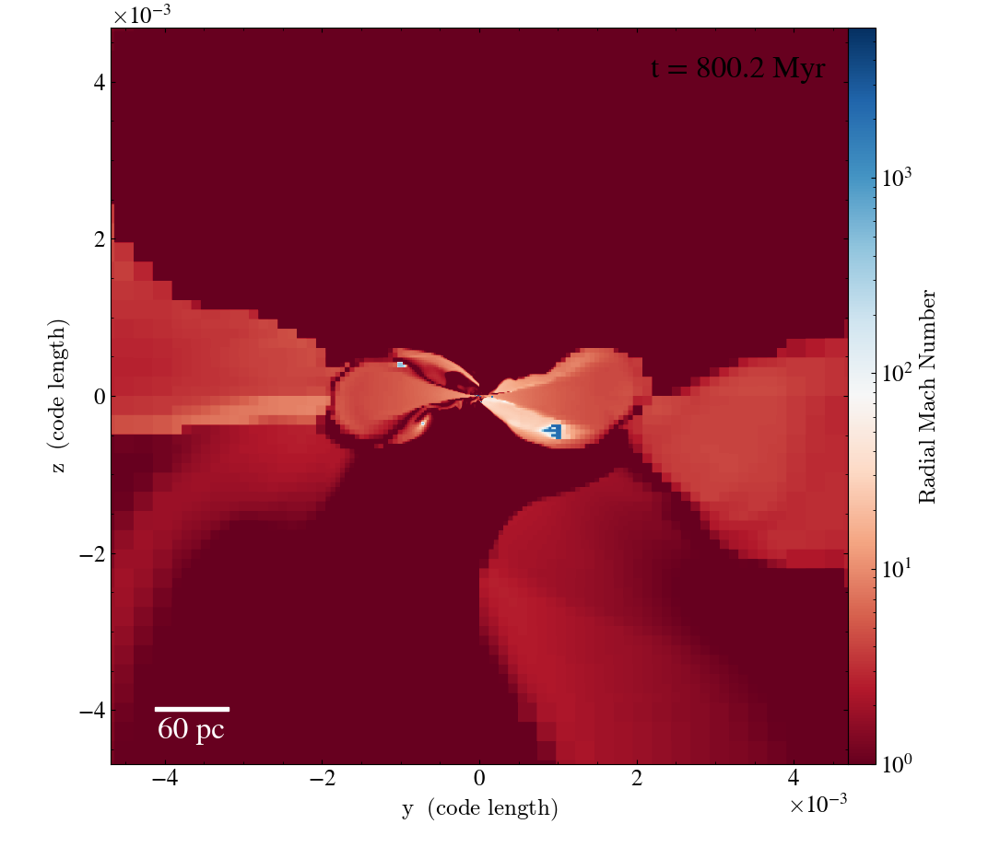

yt : [WARNING  ] 2023-11-30 17:38:58,175 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:38:58,175 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:38:58,176 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:38:58,177 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:38:58,178 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:38:58,223 Parameters: current_time              = 80.03200002358568
yt : [INFO     ] 2023-11-30 17:38:58,223 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:38:58,224 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:38:58,224 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:38:58,225 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:39:00,110 xlim = -0.004687 0.004687
yt : [INFO


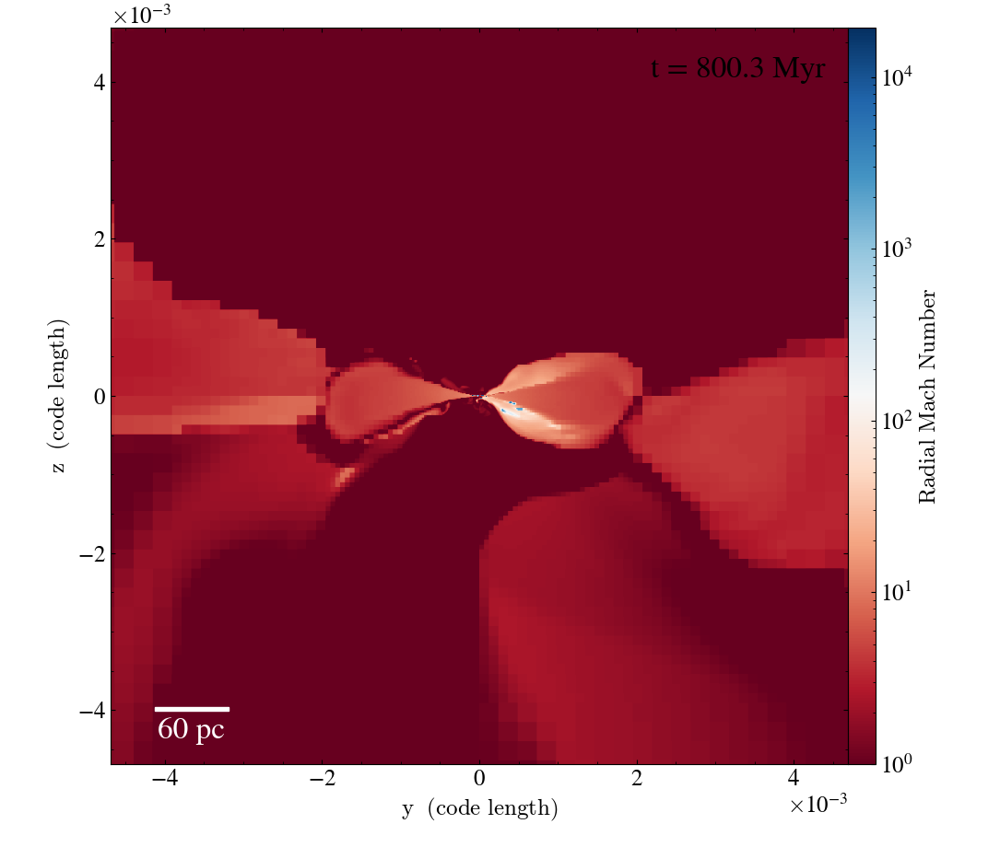

yt : [WARNING  ] 2023-11-30 17:39:00,934 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:39:00,935 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:39:00,935 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:39:00,936 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:39:00,937 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:39:00,983 Parameters: current_time              = 80.04200001344881
yt : [INFO     ] 2023-11-30 17:39:00,984 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:39:00,984 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:39:00,985 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:39:00,986 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:39:03,923 xlim = -0.004687 0.004687
yt : [INFO


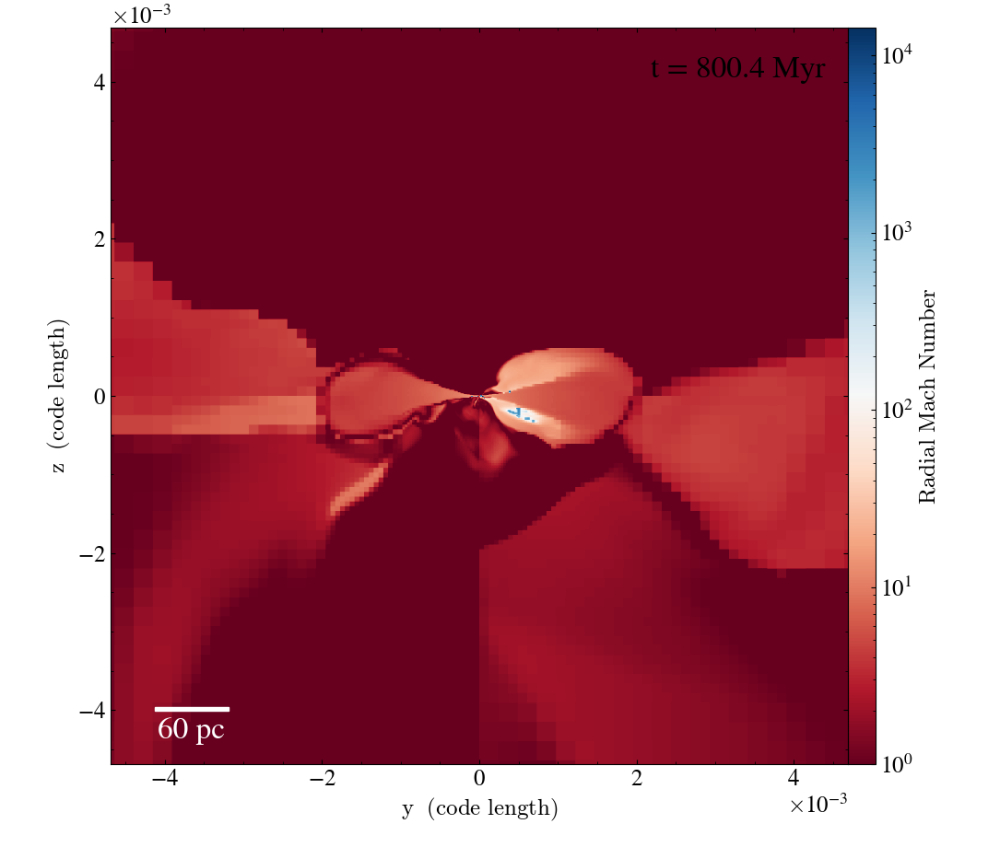

yt : [WARNING  ] 2023-11-30 17:39:04,662 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:39:04,663 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:39:04,663 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:39:04,664 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:39:04,665 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:39:04,712 Parameters: current_time              = 80.052000025194
yt : [INFO     ] 2023-11-30 17:39:04,712 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:39:04,713 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:39:04,713 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:39:04,714 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:39:06,893 xlim = -0.004687 0.004687
yt : [INFO  


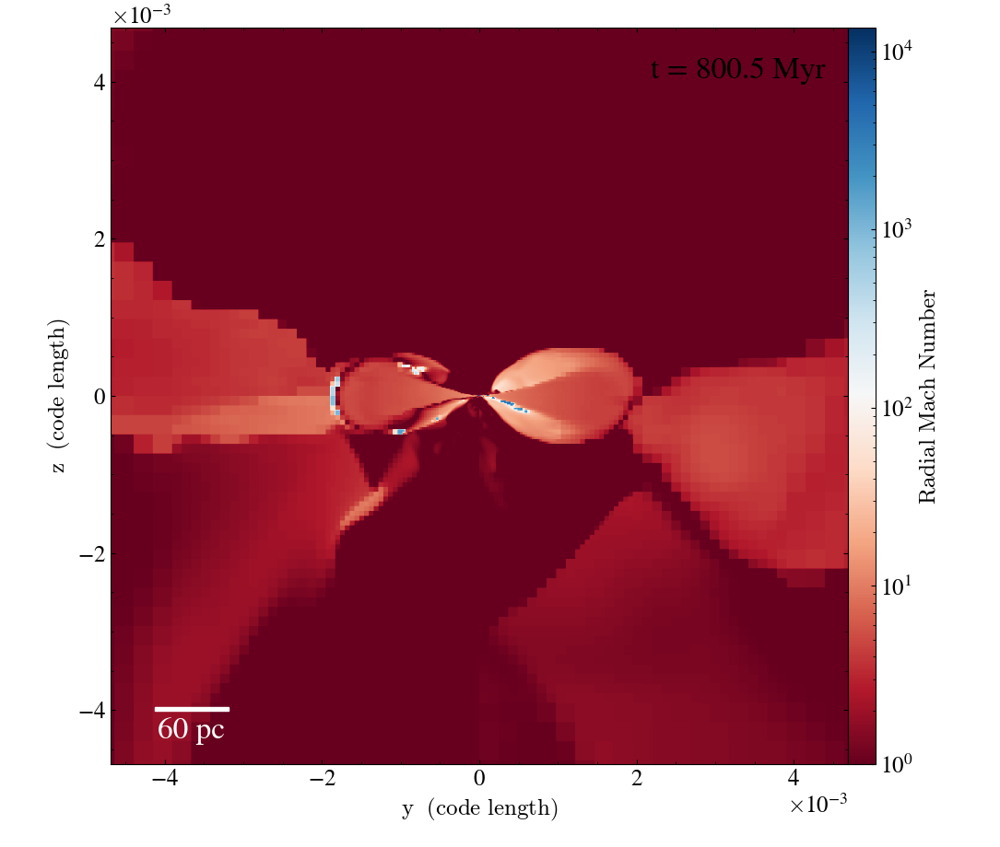

yt : [WARNING  ] 2023-11-30 17:39:07,612 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:39:07,612 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:39:07,613 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:39:07,614 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:39:07,615 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:39:07,659 Parameters: current_time              = 80.06200001032421
yt : [INFO     ] 2023-11-30 17:39:07,659 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:39:07,660 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:39:07,660 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:39:07,661 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:39:10,818 xlim = -0.004687 0.004687
yt : [INFO


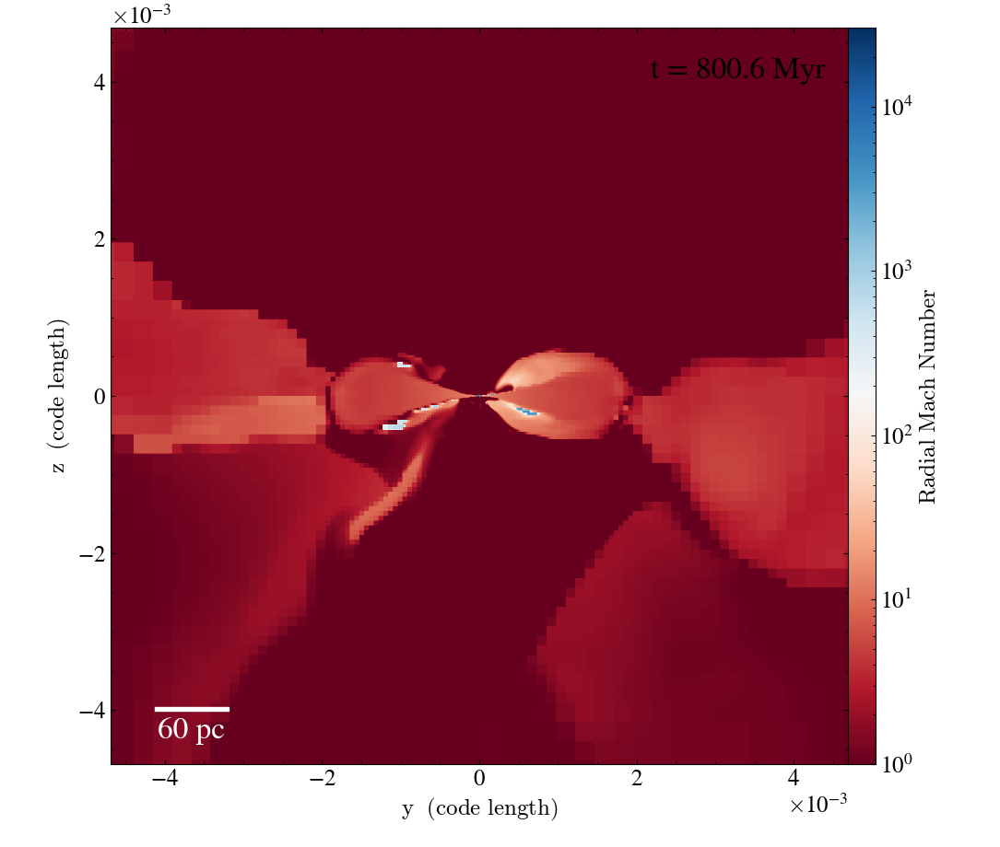

yt : [WARNING  ] 2023-11-30 17:39:11,573 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:39:11,574 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:39:11,574 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:39:11,575 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:39:11,576 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:39:11,620 Parameters: current_time              = 80.07200001433225
yt : [INFO     ] 2023-11-30 17:39:11,621 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:39:11,621 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:39:11,622 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:39:11,622 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:39:13,947 xlim = -0.004687 0.004687
yt : [INFO


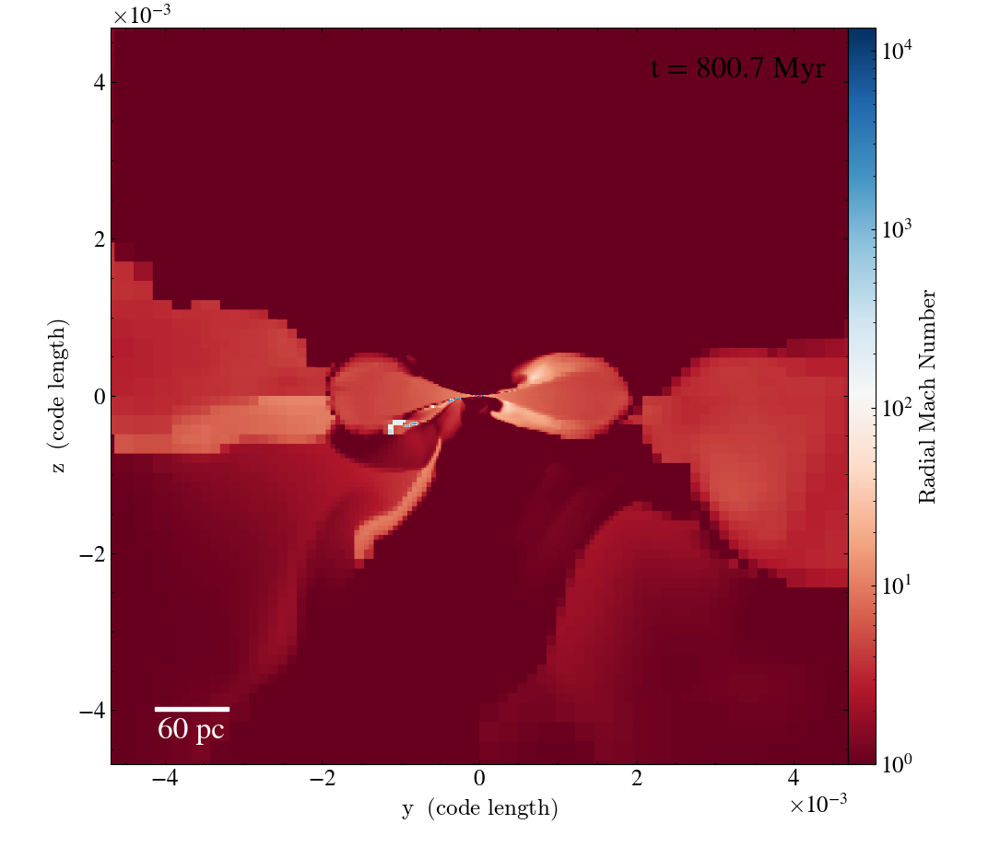

yt : [WARNING  ] 2023-11-30 17:39:14,718 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:39:14,719 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:39:14,720 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:39:14,721 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:39:14,721 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:39:14,766 Parameters: current_time              = 80.08200002968206
yt : [INFO     ] 2023-11-30 17:39:14,767 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:39:14,767 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:39:14,768 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:39:14,769 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:39:16,890 xlim = -0.004687 0.004687
yt : [INFO


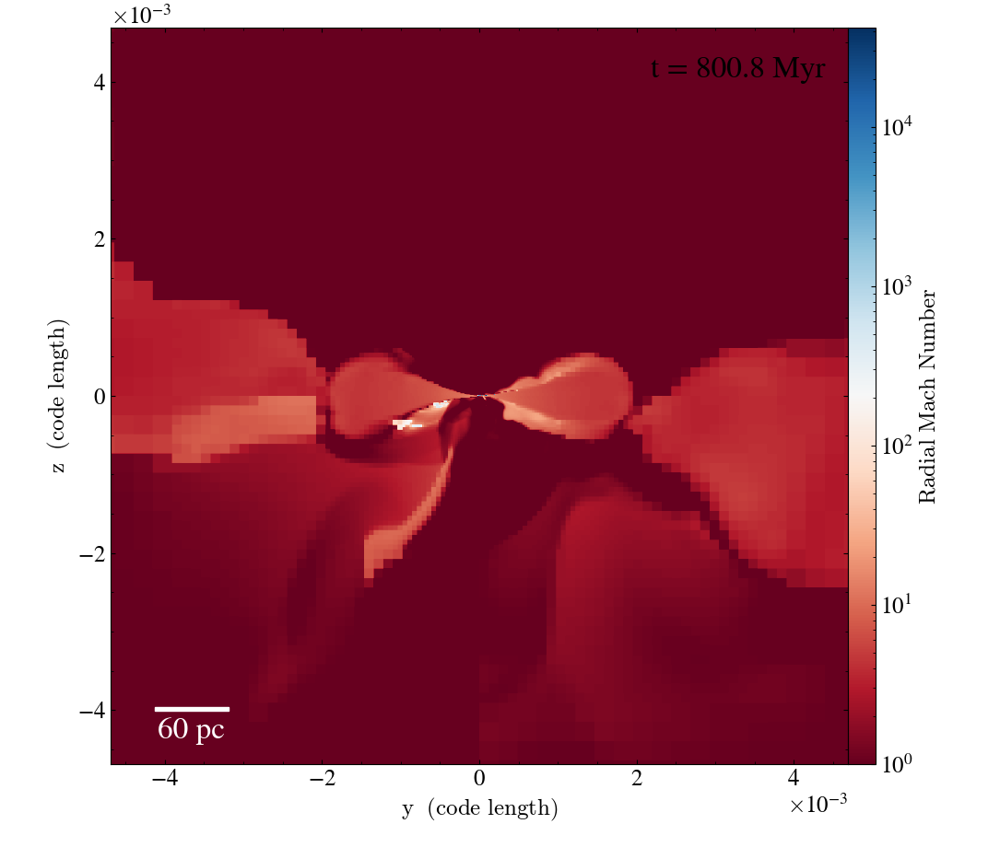

yt : [WARNING  ] 2023-11-30 17:39:17,640 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:39:17,641 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:39:17,642 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:39:17,642 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:39:17,643 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:39:17,689 Parameters: current_time              = 80.09200001396748
yt : [INFO     ] 2023-11-30 17:39:17,690 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:39:17,690 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:39:17,691 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:39:17,691 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:39:20,769 xlim = -0.004687 0.004687
yt : [INFO


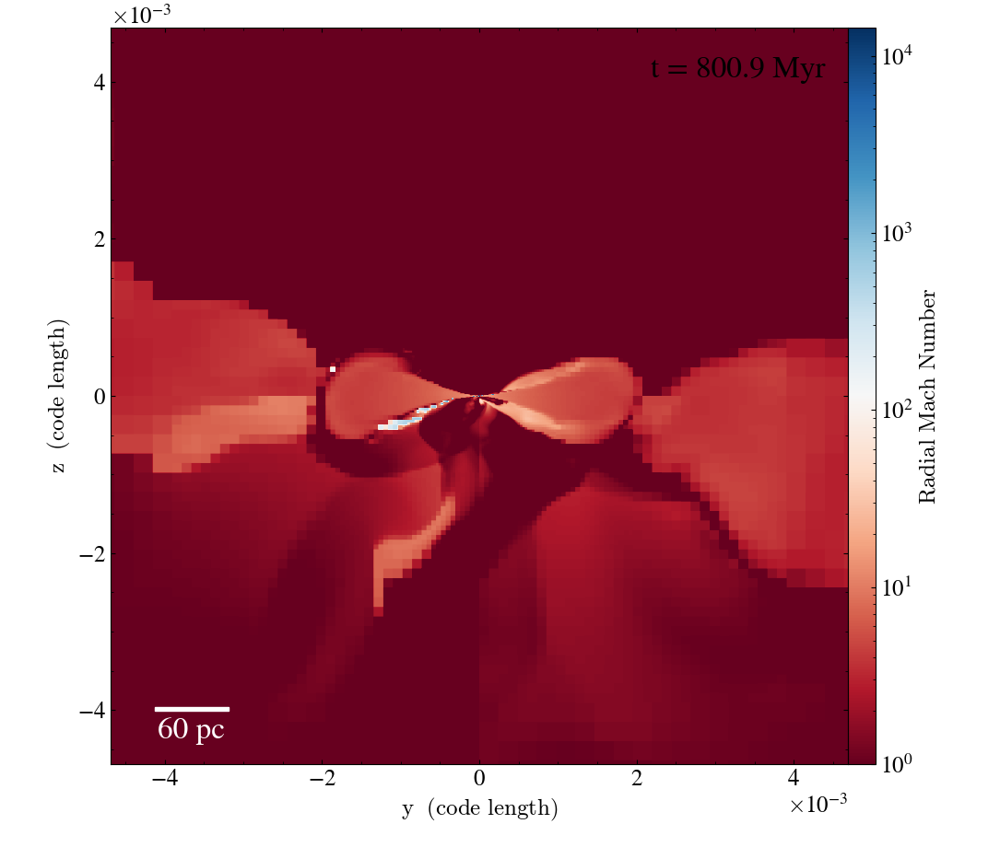

yt : [WARNING  ] 2023-11-30 17:39:21,509 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:39:21,510 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:39:21,511 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:39:21,512 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:39:21,513 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:39:21,558 Parameters: current_time              = 80.10200000140553
yt : [INFO     ] 2023-11-30 17:39:21,558 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:39:21,559 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:39:21,559 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:39:21,560 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:39:24,362 xlim = -0.004687 0.004687
yt : [INFO


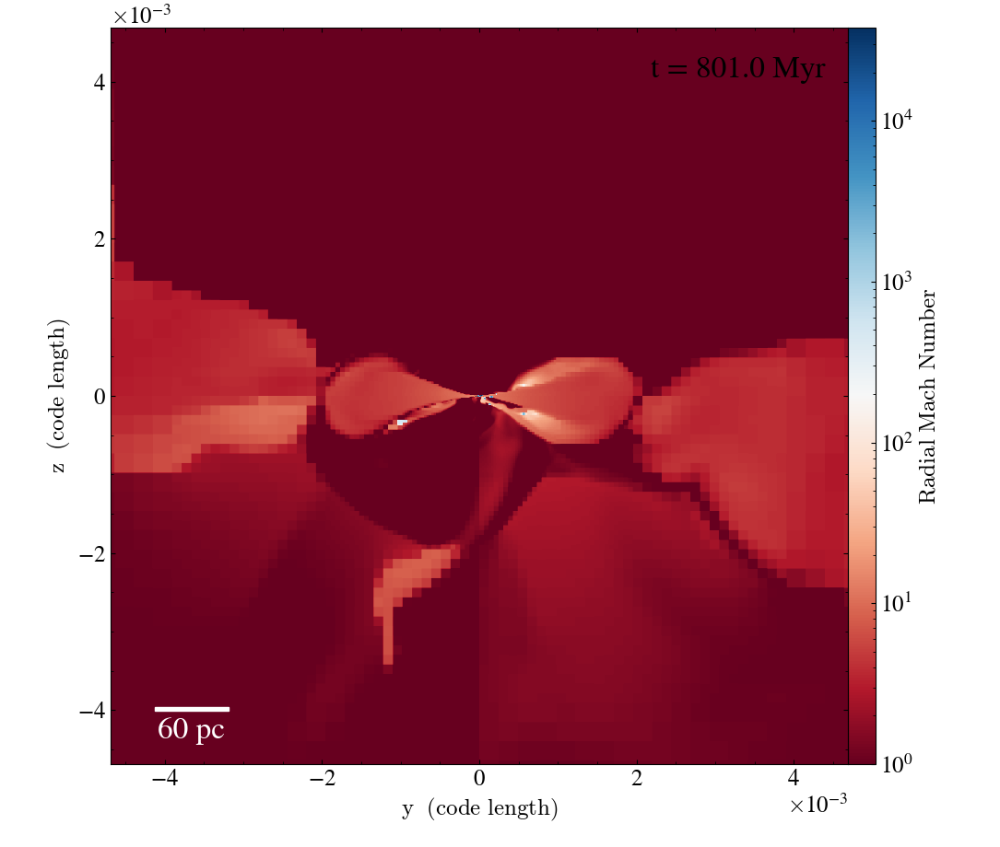

In [77]:
from yt import physical_constants as phc
def makeSlicePlot (data, fields, slice, width):
    sl = yt.SlicePlot(data, slice, fields,width=width)
    # sl.set_unit(fields, "km/s")
    sl.set_cmap(fields, 'RdBu')
    # sl.annotate_velocity(factor=16, normalize=True)
    # sl.annotate_title(f"Time: {ds.current_time.to('Myr'):.1f}")
    sl.annotate_timestamp(time_unit="Myr",corner='upper_right',text_args={"color":"black",'size':24})
    sl.annotate_scale(coeff=width[0]*100, unit="pc",corner='lower_left',text_args={'size':24})
    # sl.annotate_grids(alpha=0.2)
    # sl.annotate_contour(("gas","temperature"))
    # sl.set_log(fields, linthresh=1.)
    sl.set_zlim(field=fields, zmin=1.e0)
    sl.show()

for i in range(162,263, 10):
    ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=i),units_override=units_override)
    makeSlicePlot(data=ds, fields=('gas', 'radial_mach_number'), slice="x", width=(0.6, "kpc"))

Temperature profile

yt : [WARNING  ] 2023-11-30 17:45:17,045 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:17,045 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:17,046 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:17,047 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:17,047 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:17,093 Parameters: current_time              = 80.00200001544172
yt : [INFO     ] 2023-11-30 17:45:17,094 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:17,094 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:17,095 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:17,095 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:17,618 xlim = -0.004687 0.004687
yt : [INFO


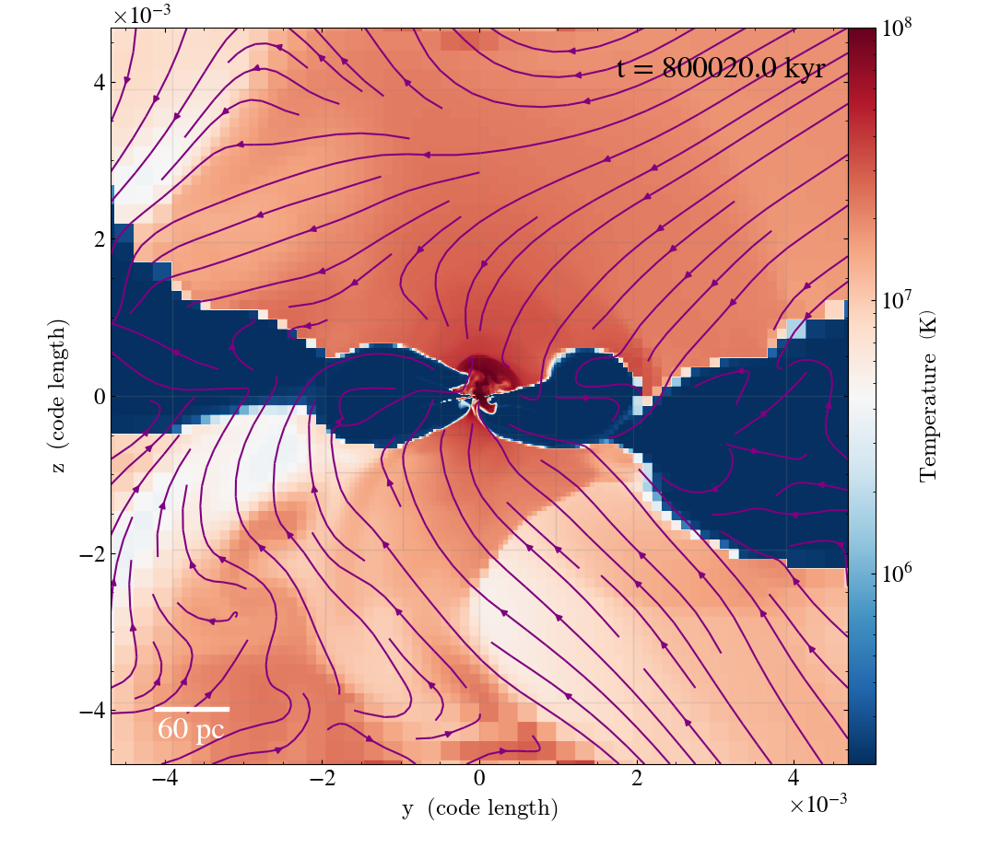

yt : [WARNING  ] 2023-11-30 17:45:18,815 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:18,815 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:18,816 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:18,817 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:18,817 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:18,862 Parameters: current_time              = 80.01200002528391
yt : [INFO     ] 2023-11-30 17:45:18,863 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:18,863 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:18,864 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:18,864 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:19,388 xlim = -0.004687 0.004687
yt : [INFO


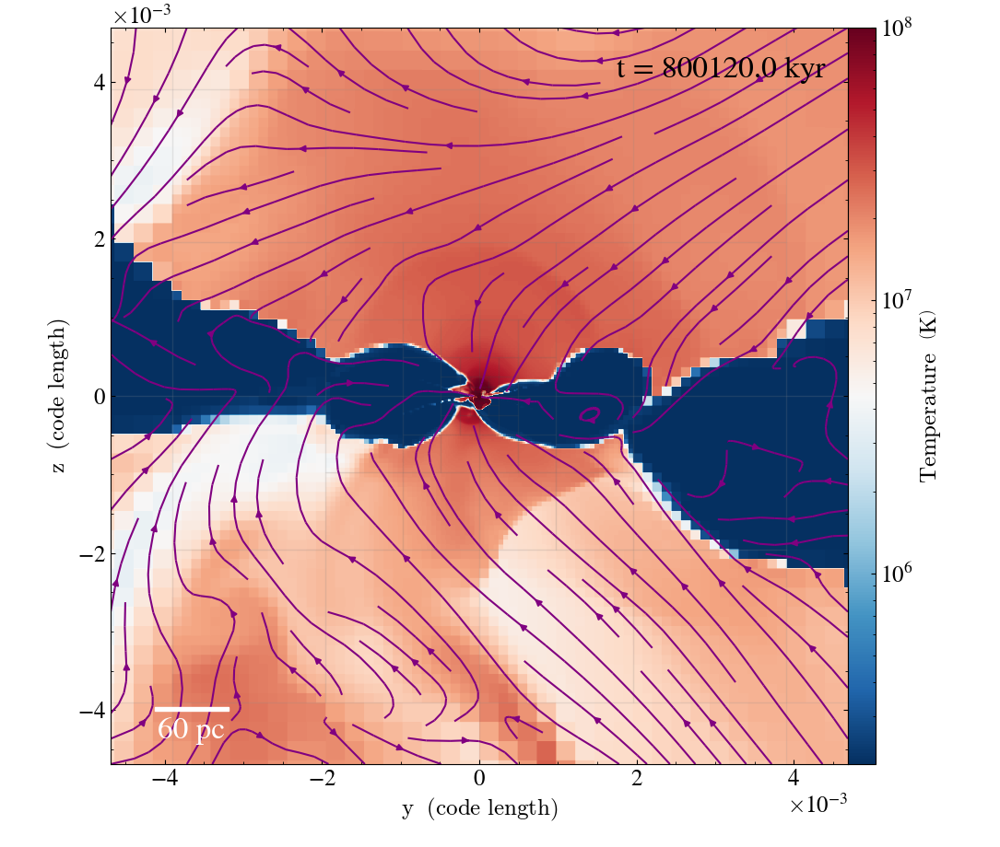

yt : [WARNING  ] 2023-11-30 17:45:20,582 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:20,583 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:20,583 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:20,584 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:20,585 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:20,629 Parameters: current_time              = 80.02200002929375
yt : [INFO     ] 2023-11-30 17:45:20,630 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:20,630 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:20,631 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:20,631 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:22,011 xlim = -0.004687 0.004687
yt : [INFO


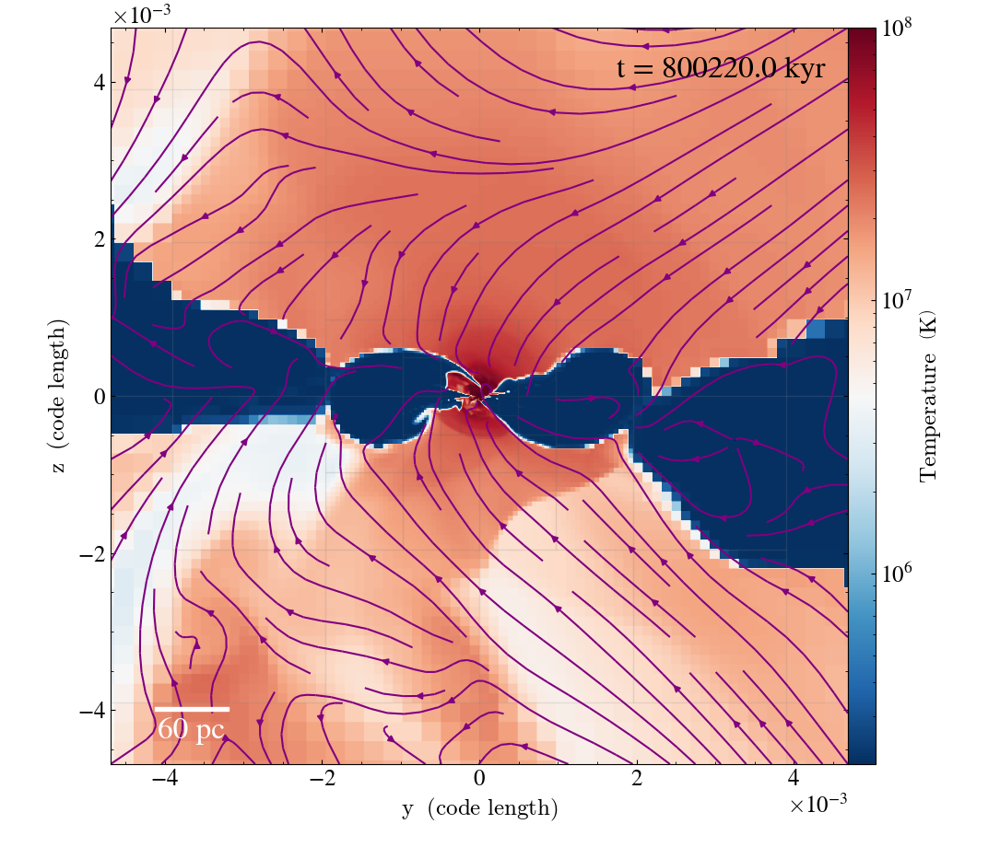

yt : [WARNING  ] 2023-11-30 17:45:23,132 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:23,132 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:23,133 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:23,134 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:23,135 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:23,181 Parameters: current_time              = 80.03200002358568
yt : [INFO     ] 2023-11-30 17:45:23,182 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:23,183 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:23,183 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:23,184 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:23,731 xlim = -0.004687 0.004687
yt : [INFO


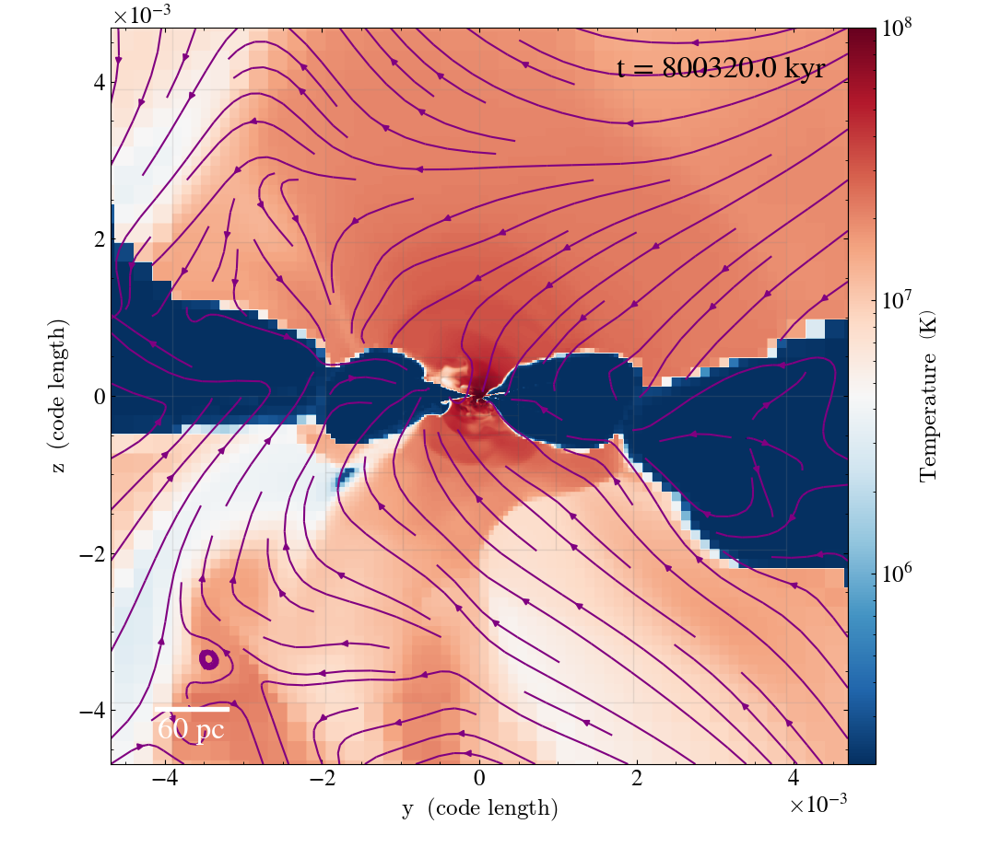

yt : [WARNING  ] 2023-11-30 17:45:24,963 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:24,964 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:24,965 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:24,965 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:24,966 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:25,010 Parameters: current_time              = 80.04200001344881
yt : [INFO     ] 2023-11-30 17:45:25,010 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:25,011 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:25,011 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:25,012 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:25,568 xlim = -0.004687 0.004687
yt : [INFO


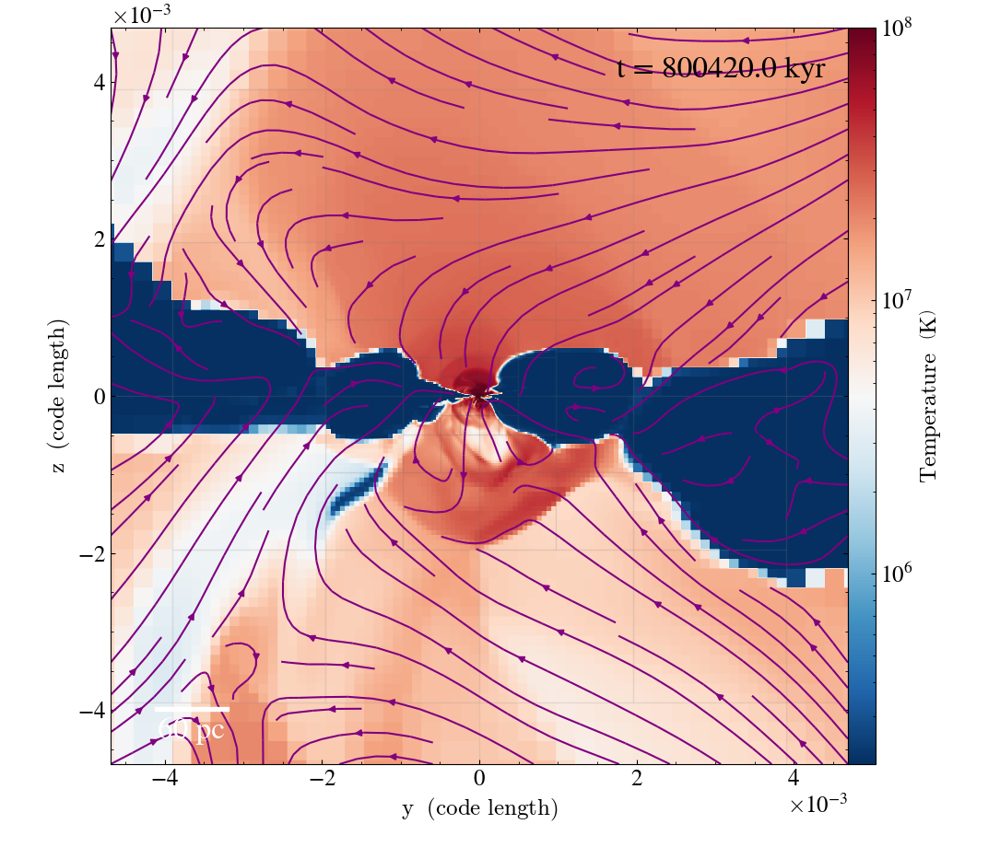

yt : [WARNING  ] 2023-11-30 17:45:26,788 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:26,789 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:26,789 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:26,790 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:26,791 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:26,837 Parameters: current_time              = 80.052000025194
yt : [INFO     ] 2023-11-30 17:45:26,852 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:26,853 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:26,854 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:26,854 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:27,402 xlim = -0.004687 0.004687
yt : [INFO  


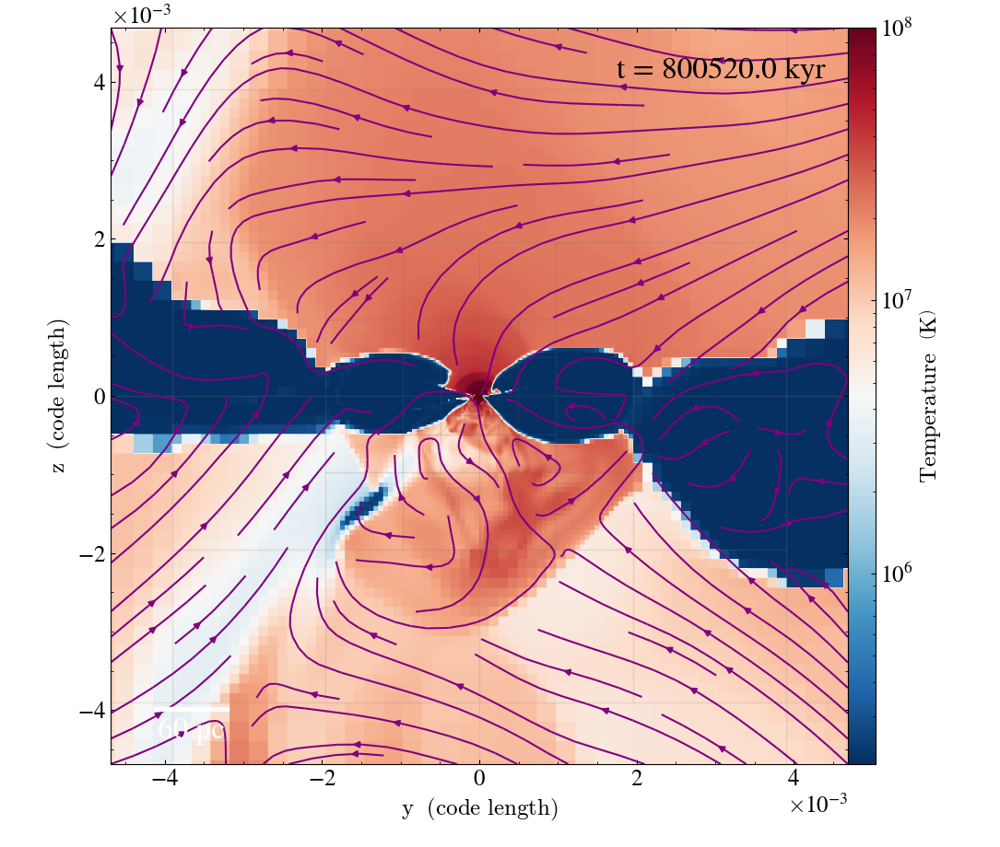

yt : [WARNING  ] 2023-11-30 17:45:28,579 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:28,579 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:28,580 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:28,581 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:28,581 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:28,627 Parameters: current_time              = 80.06200001032421
yt : [INFO     ] 2023-11-30 17:45:28,627 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:28,628 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:28,629 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:28,629 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:30,048 xlim = -0.004687 0.004687
yt : [INFO


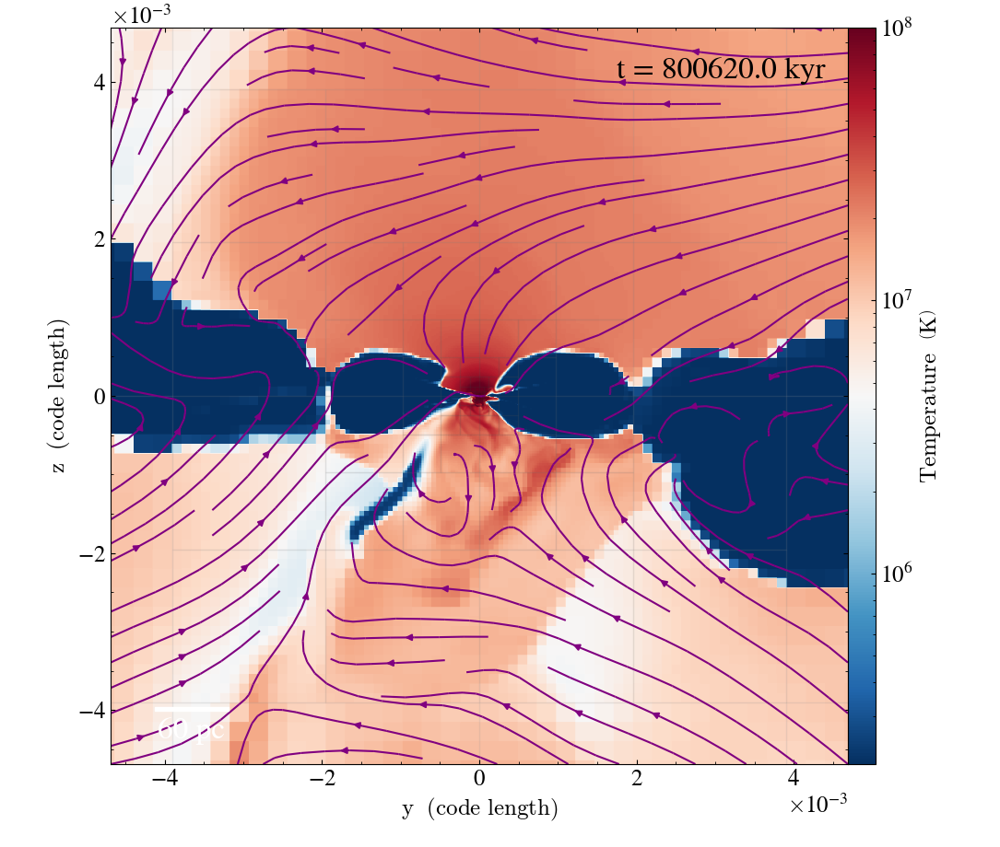

yt : [WARNING  ] 2023-11-30 17:45:31,255 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:31,256 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:31,257 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:31,257 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:31,258 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:31,302 Parameters: current_time              = 80.07200001433225
yt : [INFO     ] 2023-11-30 17:45:31,302 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:31,303 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:31,303 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:31,304 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:31,849 xlim = -0.004687 0.004687
yt : [INFO


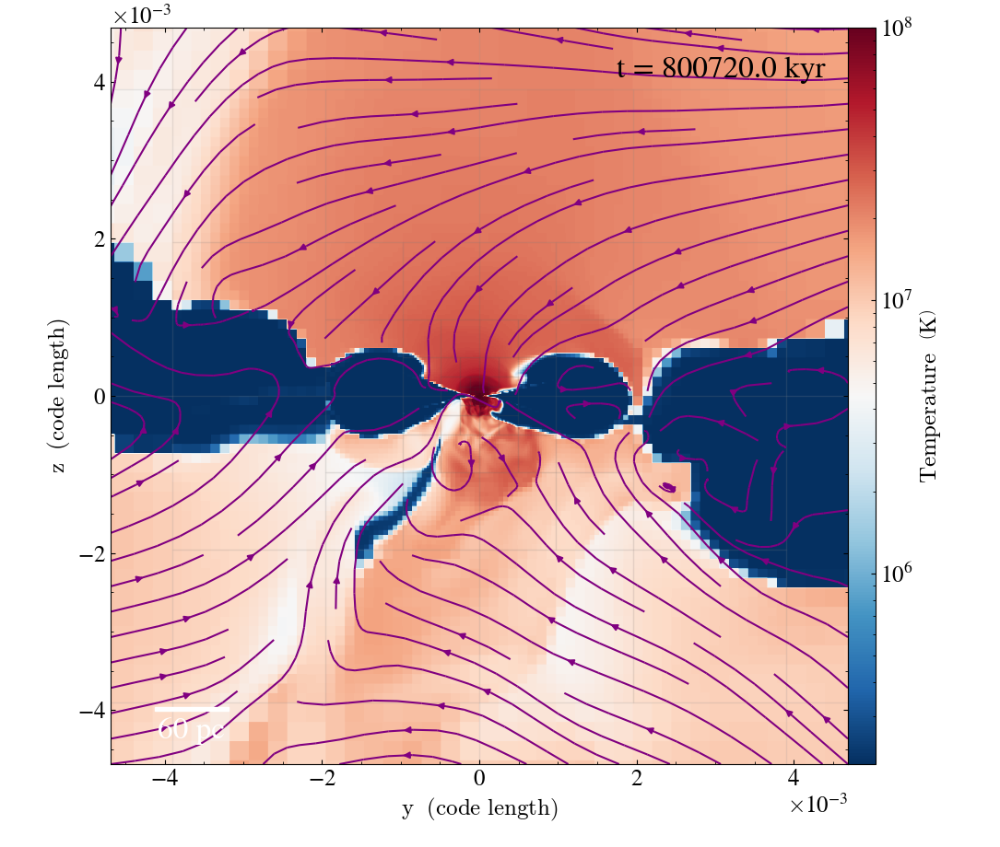

yt : [WARNING  ] 2023-11-30 17:45:33,027 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:33,028 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:33,029 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:33,030 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:33,030 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:33,074 Parameters: current_time              = 80.08200002968206
yt : [INFO     ] 2023-11-30 17:45:33,074 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:33,075 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:33,075 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:33,076 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:33,625 xlim = -0.004687 0.004687
yt : [INFO


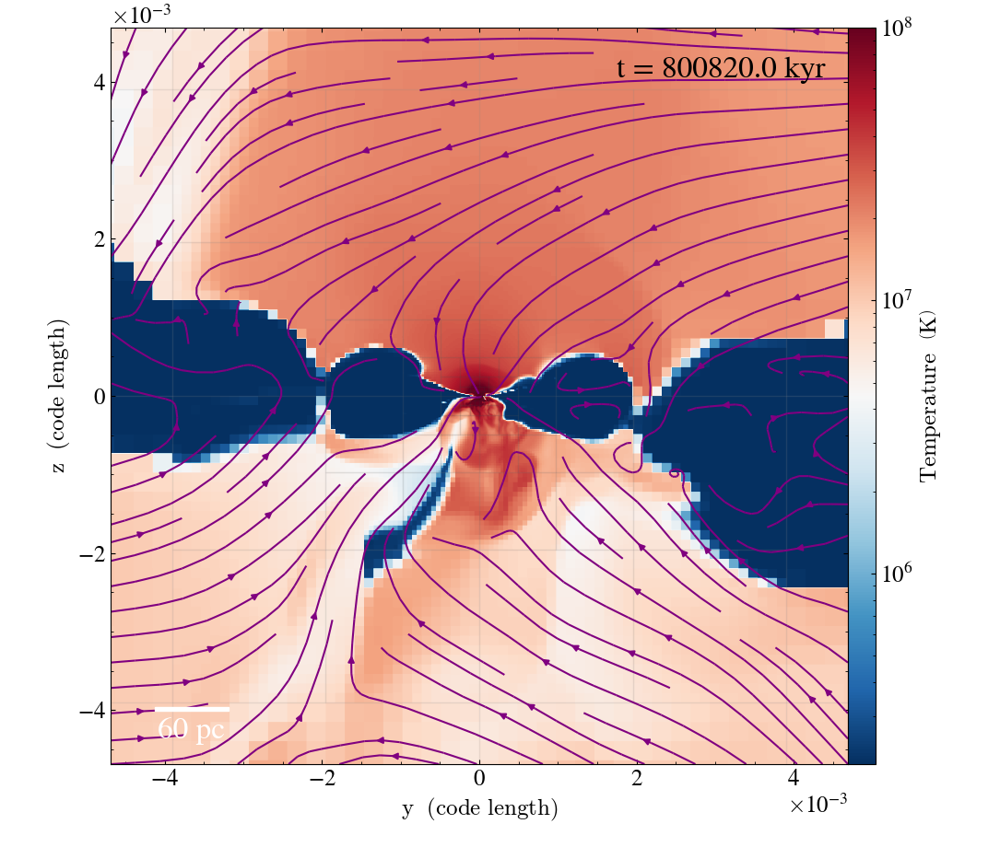

yt : [WARNING  ] 2023-11-30 17:45:34,742 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:34,742 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:34,743 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:34,744 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:34,745 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:34,788 Parameters: current_time              = 80.09200001396748
yt : [INFO     ] 2023-11-30 17:45:34,789 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:34,789 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:34,790 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:34,790 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:35,340 xlim = -0.004687 0.004687
yt : [INFO


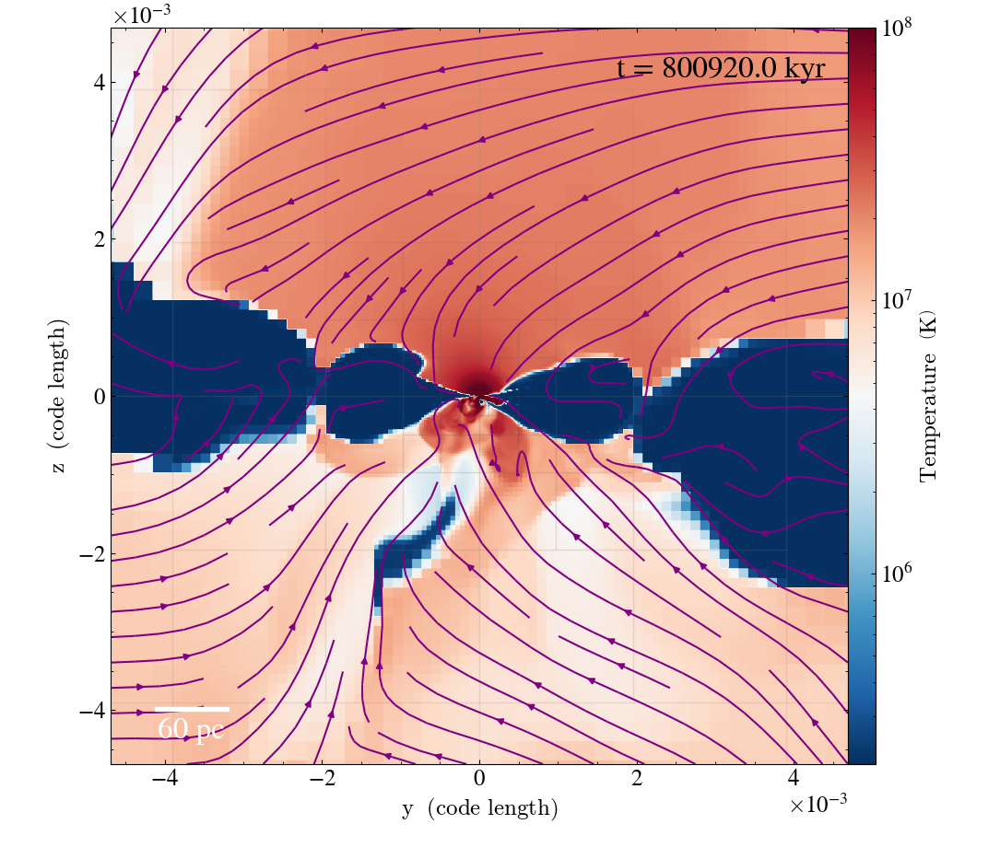

yt : [WARNING  ] 2023-11-30 17:45:36,426 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-30 17:45:36,427 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-30 17:45:36,427 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-30 17:45:36,428 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-30 17:45:36,428 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-30 17:45:36,474 Parameters: current_time              = 80.10200000140553
yt : [INFO     ] 2023-11-30 17:45:36,474 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-30 17:45:36,475 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-30 17:45:36,475 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-30 17:45:36,476 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-30 17:45:37,886 xlim = -0.004687 0.004687
yt : [INFO


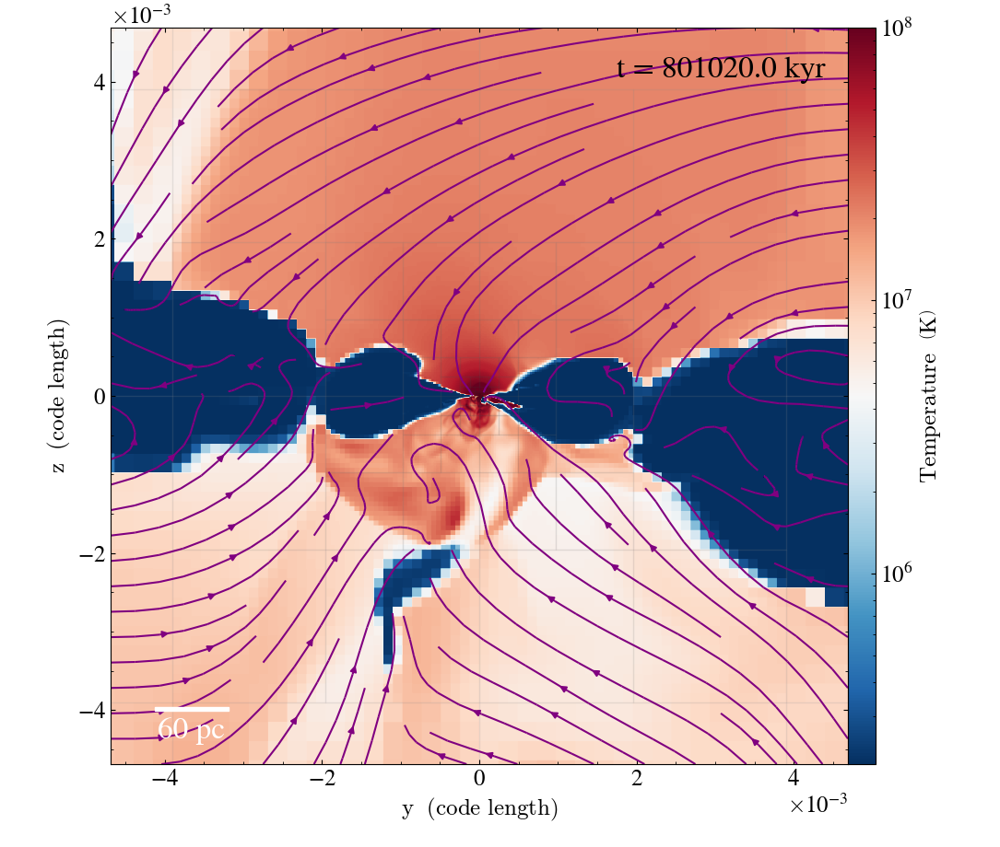

In [81]:
from yt import physical_constants as phc

def makeTemperaturePlot (data, fields, slice, width):
    sl = yt.SlicePlot(data, slice, fields,width=width, center=[0., 0., 0.])
    sl.set_unit(fields, "K")
    sl.set_cmap(fields, 'RdBu_r') #
    # sl.annotate_velocity(factor=16, normalize=False)
    # sl.annotate_title(f"Time: {ds.current_time.to('Myr'):.1f}")
    sl.annotate_grids(alpha=0.1)
    # sl.annotate_contour(("gas","velocity_z"))
    sl.annotate_streamlines(("gas", "velocity_y"), ("gas", "velocity_z"),color="purple")
    sl.annotate_scale(coeff=width[0]*100, unit="pc",corner='lower_left',text_args={'size':24})
    sl.annotate_timestamp(time_unit="kyr",corner='upper_right',text_args={"color":"black",'size':24})
    if slice == "y":
        sl.swap_axes()
    # sl.hide_axes()
    # sl.set_log(fields, log=True)
    sl.set_zlim(field=fields, zmin=2.e5, zmax=1.e8)
    sl.show()

for i in range(162,263, 10):
    ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=i),units_override=units_override)
    makeTemperaturePlot(data=ds, fields=('gas', 'temperature'), slice="x", width=(0.6, "kpc"))


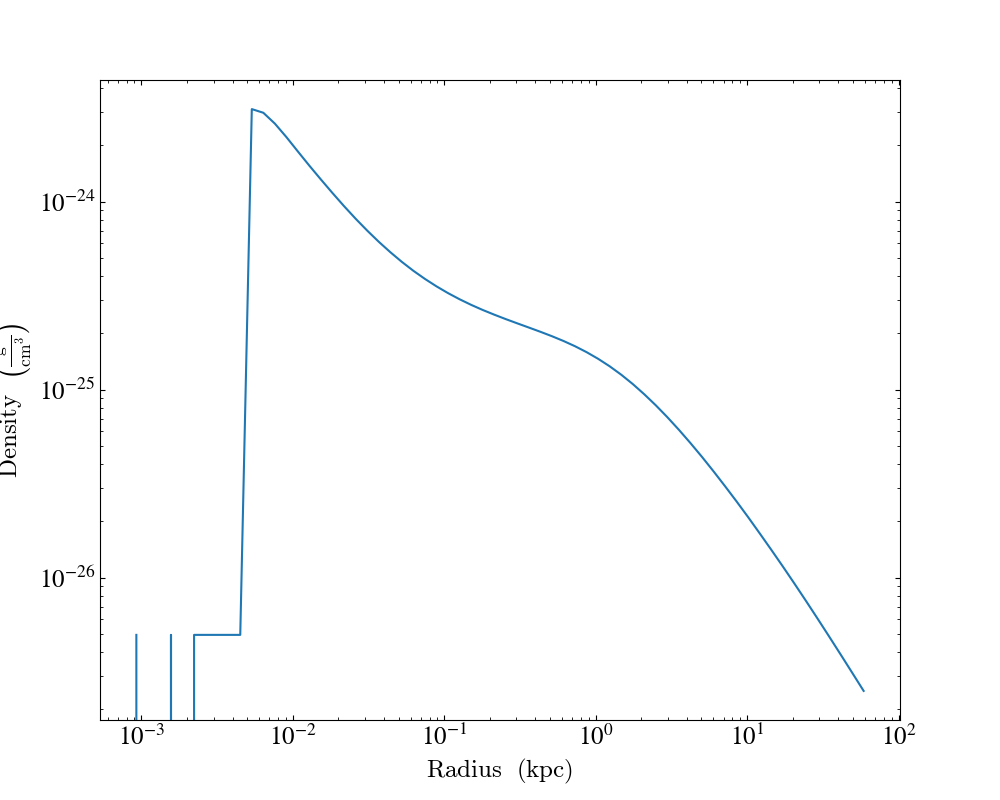

In [60]:
sp01 = ds.sphere("c",(64,"kpc"))

pp = yt.ProfilePlot(sp01, "radius", "density", weight_field="cell_mass",x_log=True)
pp.set_unit("radius", "kpc")
pp.set_unit("density", "g/cm**3")
pp.show()

Cooling time / sound crossing time plot

yt : [INFO     ] 2024-03-31 00:20:27,549 xlim = -0.156250 0.156250
yt : [INFO     ] 2024-03-31 00:20:27,549 ylim = -0.156250 0.156250
yt : [INFO     ] 2024-03-31 00:20:27,550 xlim = -0.156250 0.156250
yt : [INFO     ] 2024-03-31 00:20:27,550 ylim = -0.156250 0.156250
yt : [INFO     ] 2024-03-31 00:20:27,550 Making a fixed resolution buffer of (('gas', 'cooling_ratio')) 800 by 800



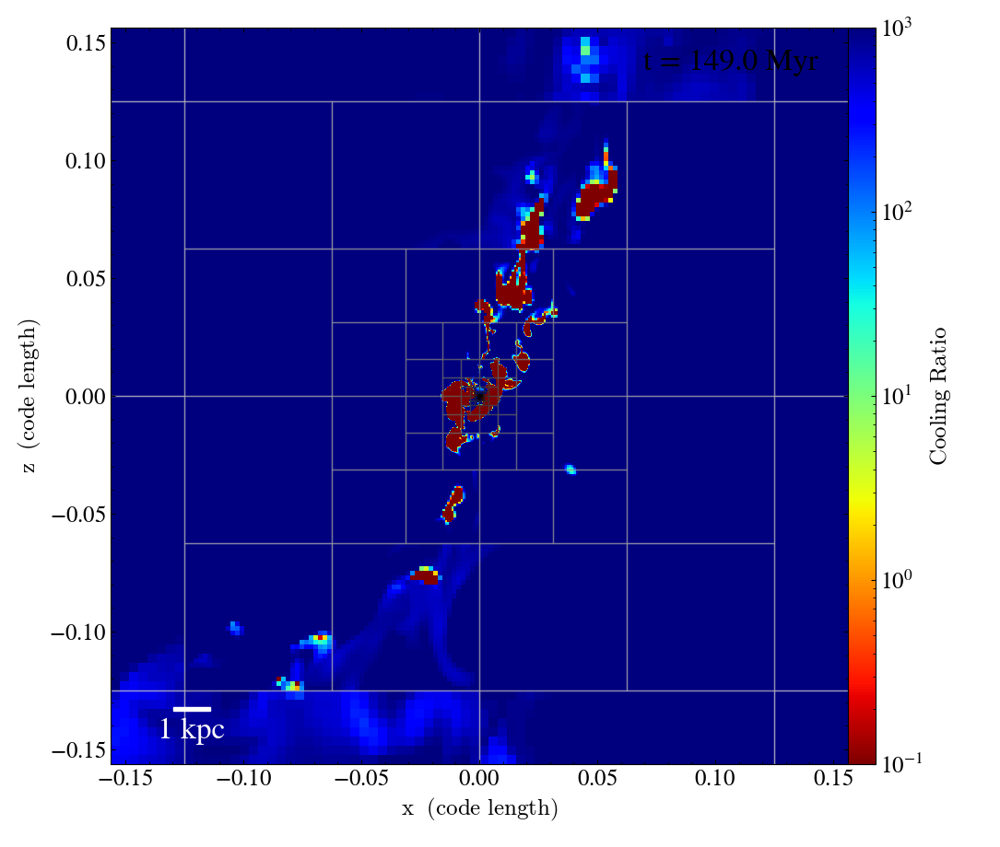

In [94]:
def makeSlicePlot (data, fields, slice, width):
    sl = yt.SlicePlot(data, slice, fields,width=width)
    # sl.set_unit(fields, "Myr")
    sl.set_cmap(fields, 'jet_r')
    # sl.annotate_velocity(factor=16, normalize=True)
    # sl.annotate_title(f"Time: {ds.current_time.to('Myr'):.1f}")
    sl.annotate_timestamp(time_unit="Myr",corner='upper_right',text_args={"color":"black",'size':24})
    sl.annotate_scale(corner='lower_left',text_args={'size':24})
    if slice == "y":
        sl.swap_axes()
    sl.annotate_grids(alpha=0.5)
    # sl.annotate_contour(("gas","temperature"))
    # sl.set_log(fields, linthresh=1.)
    sl.set_zlim(field=fields, zmin=1e-1, zmax=1.e3)
    sl.show()

makeSlicePlot(data=ds, fields=('gas', 'cooling_ratio'), slice="y", width=(20, "kpc"))

Add off-axis slice plot to see the jet base more clearly

yt : [WARNING  ] 2023-08-08 21:23:58,360 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-08-08 21:23:58,361 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-08-08 21:23:58,361 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-08-08 21:23:58,361 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-08-08 21:23:58,362 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-08-08 21:23:58,382 Parameters: current_time              = 5.600002
yt : [INFO     ] 2023-08-08 21:23:58,383 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-08-08 21:23:58,384 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-08-08 21:23:58,385 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-08-08 21:23:58,385 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-08-08 21:23:59,413 xlim = -0.003125 0.003125
yt : [INFO     ] 20


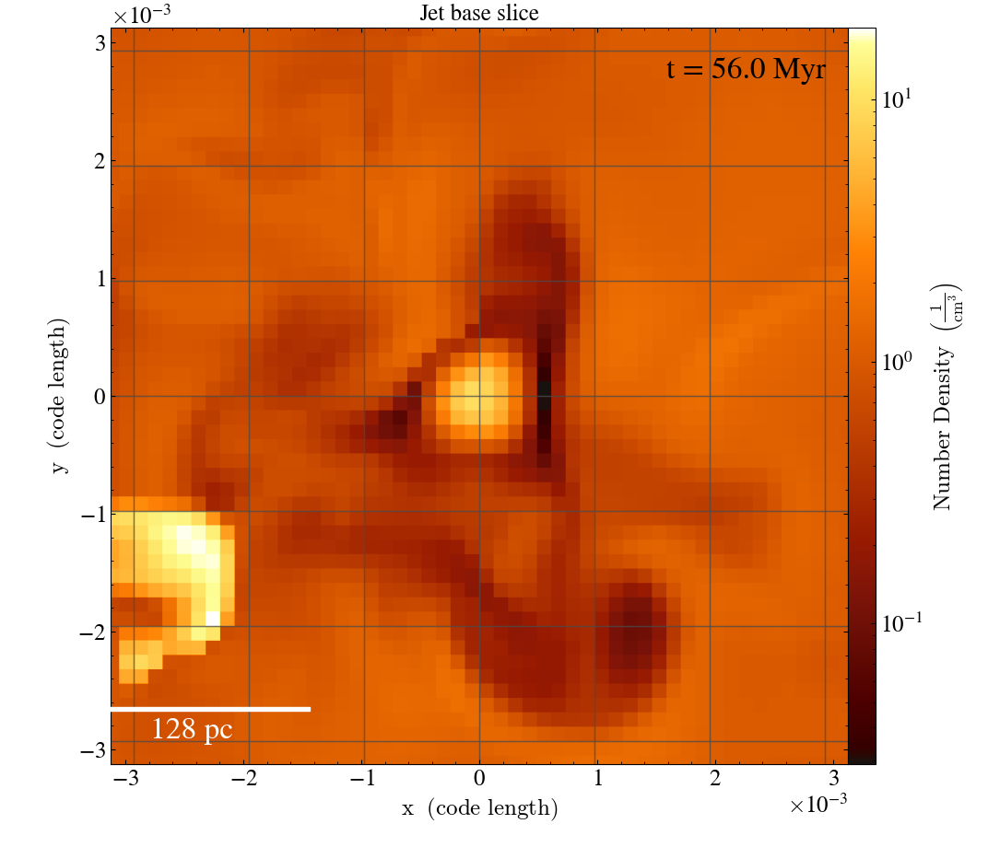

In [193]:
def makeJetDensityPlot (data, fields, slice, width):
    sl = yt.SlicePlot(data, slice, fields,width=width, center=[0., 0., 3.e-4/code_length])
    sl.set_unit(fields, "cm**-3")
    sl.set_cmap(fields, 'afmhot_10us') #RdBu_r
    # sl.annotate_velocity(factor=16, normalize=False)
    # sl.annotate_title(f"Time: {ds.current_time.to('Myr'):.1f}")
    sl.annotate_grids(alpha=0.5)
    # sl.annotate_contour(("gas","velocity_z"))
    # sl.annotate_streamlines(("gas", "velocity_y"), ("gas", "velocity_z"),color="purple")
    sl.annotate_scale(coeff=128,unit='pc',corner='lower_left',text_args={'size':24})
    sl.annotate_timestamp(time_unit="Myr",corner='upper_right',text_args={"color":"black",'size':24})
    sl.annotate_title("Jet base slice")
    # sl.hide_axes()
    # sl.set_log(fields, log=True)
    # sl.set_zlim(field=fields, zmin=5.e5, zmax=1.e9)
    sl.show()

for i in range(28,29):
    ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=i),units_override=units_override)
    makeJetDensityPlot(data=ds, fields=('gas', 'number_density'), slice="z", width=(0.4, "kpc"))

1D line profile of jet density


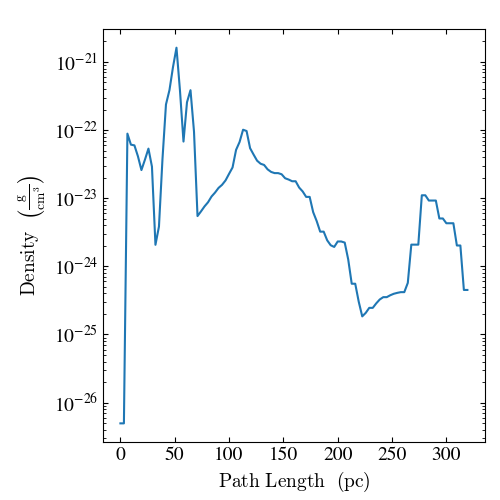

In [174]:
jetHeight = 3.0e-4 
samplingSize = 100
ln = yt.LinePlot(
    ds, [("gas", "density")], (0.0, 0.0, 0), (0, 1.e-4/code_length, jetHeight/code_length), samplingSize
)
ln.set_unit(("gas", "density"), "g * cm**-3")
ln.set_x_unit("pc")
ln.show()

In [175]:
# r = ds.coordinates.pixelize_line(("gas","number_density"), (0.0, 0.0, 0.0), (0, 1.15e-4/code_length, jetHeight/code_length), samplingSize)[0].to("Mpc")
r = ds.coordinates.pixelize_line(("gas","density"), (0.0, 0.0, 0.0), (0, 5.e-3, 0.), samplingSize)[0].to("pc")

rho = ds.coordinates.pixelize_line(("gas","density"), (0.0, 0.0, 0.0), (0, 5.e-3, 0.), samplingSize)[1].to("g/cm**3")
print(r)
print(rho)

[  0.           3.26497296   6.52994592   9.79491889  13.05989185
  16.32486481  19.58983777  22.85481073  26.1197837   29.38475666
  32.64972962  35.91470258  39.17967554  42.44464851  45.70962147
  48.97459443  52.23956739  55.50454035  58.76951331  62.03448628
  65.29945924  68.5644322   71.82940516  75.09437812  78.35935109
  81.62432405  84.88929701  88.15426997  91.41924293  94.6842159
  97.94918886 101.21416182 104.47913478 107.74410774 111.00908071
 114.27405367 117.53902663 120.80399959 124.06897255 127.33394552
 130.59891848 133.86389144 137.1288644  140.39383736 143.65881033
 146.92378329 150.18875625 153.45372921 156.71870217 159.98367514
 163.2486481  166.51362106 169.77859402 173.04356698 176.30853994
 179.57351291 182.83848587 186.10345883 189.36843179 192.63340475
 195.89837772 199.16335068 202.42832364 205.6932966  208.95826956
 212.22324253 215.48821549 218.75318845 222.01816141 225.28313437
 228.54810734 231.8130803  235.07805326 238.34302622 241.60799918
 244.872972

Text(0, 0.5, 'density (g/cm**3)')

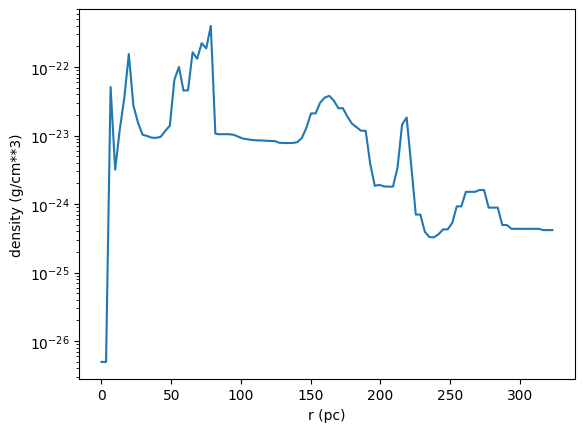

In [176]:
plt.semilogy(r,rho)
plt.xlabel("r (pc)")
plt.ylabel("density (g/cm**3)")

In [178]:
density_at_150 = np.interp(150, r, rho)
print(density_at_150)

2.0560153726278554e-23


In [1125]:
cellHeight = 16. * ds.units.pc# 16 pc cell height in Mpc
jetWidth = 120. * ds.units.pc # 120 pc in Mpc
calculatedJetBaseMass = 2 * np.pi * cellHeight * (jetWidth/samplingSize) * np.sum(r * (rho-np.min(rho)))

In [1126]:
print(calculatedJetBaseMass)

12154.703594552104 Msun


In [1040]:
dt = 8.05e-6 * code_time * ds.units.Myr # dt found in hst file
M_dot = 5.89e-1 * ds.units.Msun / ds.units.yr # printout from output file
actualAccretedMass = M_dot * dt

In [1041]:
M_dot.to("Msun/Myr")

unyt_quantity(589000., 'Msun/Myr')

Bondi radius calculation

In [70]:
T = 2.e7 * ds.units.K # virial temperature of M87
SMBHMass = 6.5e9 * ds.units.Msun # M87 SMBH mass
hydrogenMassCGS = 1.6735575e-24 * ds.units.g # hydrogen mass in CGS
cs = ds.gamma * np.sqrt(phc.kb / hydrogenMassCGS / ds.mu) * np.sqrt(T)
print(f"Sound speed at {T} : {cs.to('km/s')}")

bondi_radius = 2. * phc.G * SMBHMass / cs**2
print(f"Bondi radius at {T} : {bondi_radius.to('pc')}")

Sound speed at 20000000.0 K : 879.5480815785855 km/s
Bondi radius at 20000000.0 K : 72.26976539037885 pc


In [62]:
# From Russell et al. 2015
bondi_radius_ru = 0.031 * float((phc.kb * T).to("keV"))**(-1) * float((SMBHMass.to("msun")/1.e9))
print(f"Bondi radius at {T} : {bondi_radius_ru} kpc")

Bondi radius at 10000000.0 K : 0.2338310635137625 kpc


Bondi accretion rate calculation

In [63]:
# From Russell et al. 2015
number_density = ds.coordinates.pixelize_line(("gas","number_density"), (0.0, 0.0, 0.0), (0, bondi_radius.to("Mpc")/code_length, 0.), 100)[1][-1]
bondi_rate = 0.012 * float((phc.kb * T).to("keV"))**(-3/2) * float((number_density).to("cm**-3")) * float((SMBHMass.to("msun")/1.e9))**2
print(f"Bondi rate at {T} : {bondi_rate} Msun/yr")

Bondi rate at 10000000.0 K : 0.18296649663798492 Msun/yr


In [64]:
# in general
number_density = ds.coordinates.pixelize_line(("gas","number_density"), (0.0, 0.0, 0.0), (0, bondi_radius.to("Mpc")/code_length, 0.), 100)[1][-1]
bondi_rate = np.pi * (number_density * ds.mu * hydrogenMassCGS) * (phc.G * SMBHMass)**2 / cs**3
print(f"Number density at {bondi_radius.to('kpc')} : {number_density.to('cm**-3')}")
print(f"Bondi rate at {bondi_radius.to('kpc')} : {bondi_rate.to('Msun/yr')}")

Number density at 0.1445395307807577 kpc : 0.2886841111563091 cm**(-3)
Bondi rate at 0.1445395307807577 kpc : 0.04413874837914336 Msun/yr


In [71]:
# From Krumholz, McKee, & Klein 2006
q_s = 1./4.
bondi_rate = 4 * np.pi * (number_density * ds.mu * hydrogenMassCGS) * (phc.G * SMBHMass)**2 / cs**3 * q_s
print(f"Bondi rate at {bondi_radius.to('kpc')} : {bondi_rate.to('Msun/yr')}")

Bondi rate at 0.07226976539037885 kpc : 0.015605404145989503 Msun/yr


In [68]:
# From textbook
constant = 1.2e10 * ds.units.g / ds.units.s
bondi_rate = constant * SMBHMass.to("g")**2 * number_density.to("cm**-3") * ds.mu * phc.mass_hydrogen_cgs / 1.e-24 * (T.to("K")/1.e4)**(-3/2)

print(f"Bondi rate at {bondi_radius.to('kpc')} : {bondi_rate.to('Msun/yr')}") 

UnitConversionError: Cannot convert between 'g**4/(K**(3/2)*cm**3*s)' (dim '(mass)**4/((length)**3*(temperature)**(3/2)*(time))') and 'Msun/yr' (dim '(mass)/(time)').

Graviational radius calculation

In [52]:
r_g = 2 * phc.G * SMBHMass / phc.c**2
print(f"Schwarzschild radius : {r_g.to('pc')}")

meso_inner_radius = 0.156 * ds.units.pc

print(f"meso inner radius : {meso_inner_radius/r_g} r_g")

Schwarzschild radius : 0.0006220630571405185 pc
meso inner radius : 250.77843509482184 dimensionless r_g


Jet power based on accretion rate calculation

In [16]:
jet_efficiency = 0.0001 # 7.15e-05 # 5.56e-05
accretion_rate = 2.e-1 * ds.units.Msun / ds.units.yr
jet_power = jet_efficiency * accretion_rate * phc.c**2

print(f"jet power : {jet_power.to('erg/s')}")

jet power : 1.1325950336257656e+42 erg/s


Add field momentum_x = rho * v_x

In [12]:
def _momentum_x(field, data):
    return (
        data["gas", "density"]
        * data["gas", "velocity_x"]
    )
ds.add_field(
    name=("gas", "momentum_x"),
    function=_momentum_x,
    sampling_type="local",
    units="code_mass/(code_length**2*code_time)",
)

yt : [WARNING  ] 2022-11-18 11:10:12,674 Field ('gas', 'momentum_x') already exists. To override use `force_override=True`.


Various projection plots

yt : [WARNING  ] 2023-11-29 16:11:45,162 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-11-29 16:11:45,163 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2023-11-29 16:11:45,163 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-11-29 16:11:45,164 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-11-29 16:11:45,165 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-11-29 16:11:45,217 Parameters: current_time              = 80.00000041986173
yt : [INFO     ] 2023-11-29 16:11:45,217 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-11-29 16:11:45,218 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-11-29 16:11:45,219 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-11-29 16:11:45,220 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2023-11-29 16:11:46,345 Projection completed
yt : [INFO     


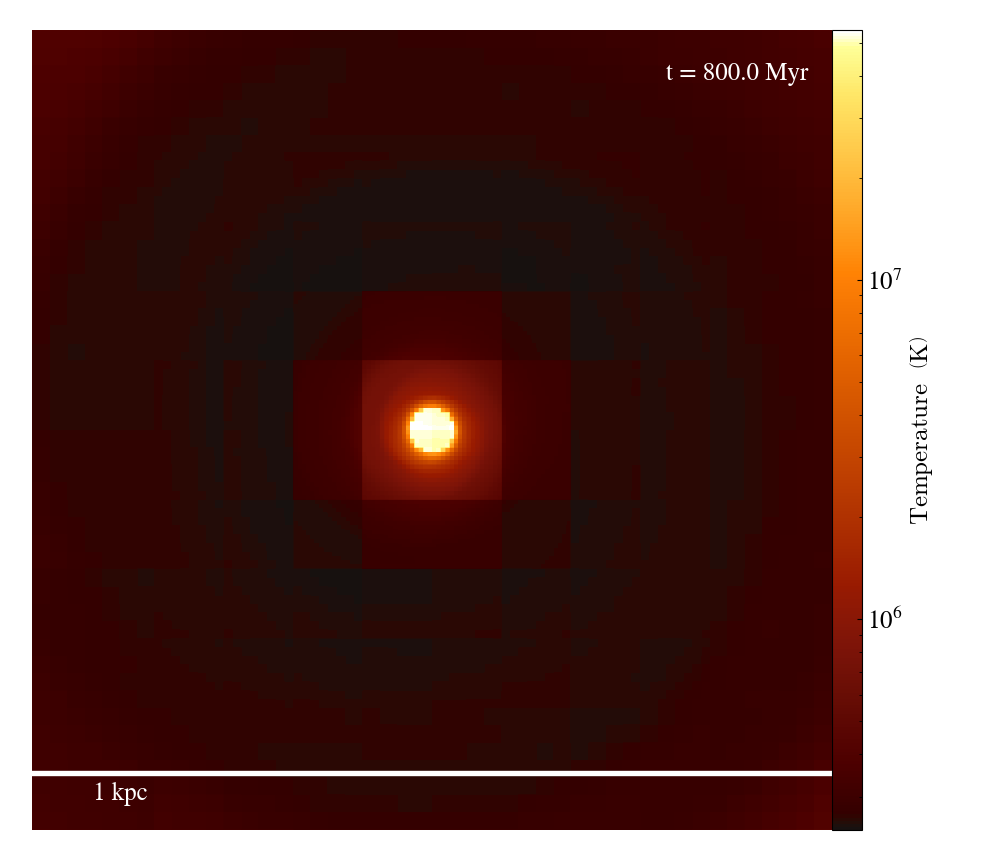

In [52]:
from yt.units import kpc

def makeTemperaturePrjPlot(data, fields, projection, width):
    prj = yt.ProjectionPlot(
        data,
        projection,
        fields,
        weight_field=("gas", "density"),
        width=width,
        buff_size=(1000, 1000),
    )
    # prj.annotate_quiver(("gas", "velocity_x"), ("gas", "velocity_y"), normalize=False, factor=16)
    prj.annotate_scale(coeff=1,unit='kpc',corner='lower_left')
    prj.annotate_timestamp(time_unit="Myr",corner='upper_right')
    # prj.annotate_grids(alpha=0.2)
    # prj.annotate_streamlines(("gas", "velocity_y"), ("gas", "velocity_z"),color="purple")
    prj.hide_axes()
    prj.set_unit(("gas", "temperature"), "K")
    prj.set_cmap(('gas','temperature'), 'afmhot_10us')
    prj.set_log(('gas','temperature'),True)
    # prj.set_zlim(field=('gas', 'temperature'), zmin=2.e7, zmax=7.e7)
    prj.show()

for i in range(160,161):
    ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=i),units_override=units_override)
    makeTemperaturePrjPlot(data=ds, fields=('gas', 'temperature'), projection="z", width=(1.8e-1 * kpc, 1.8e-1 * kpc))

yt : [INFO     ] 2024-02-23 23:37:53,428 xlim = -0.000078 0.000078
yt : [INFO     ] 2024-02-23 23:37:53,430 ylim = -0.000078 0.000078
yt : [INFO     ] 2024-02-23 23:37:53,431 xlim = -0.000078 0.000078
yt : [INFO     ] 2024-02-23 23:37:53,431 ylim = -0.000078 0.000078
yt : [INFO     ] 2024-02-23 23:37:53,433 Making a fixed resolution buffer of (('gas', 'velocity_magnitude')) 1000 by 1000



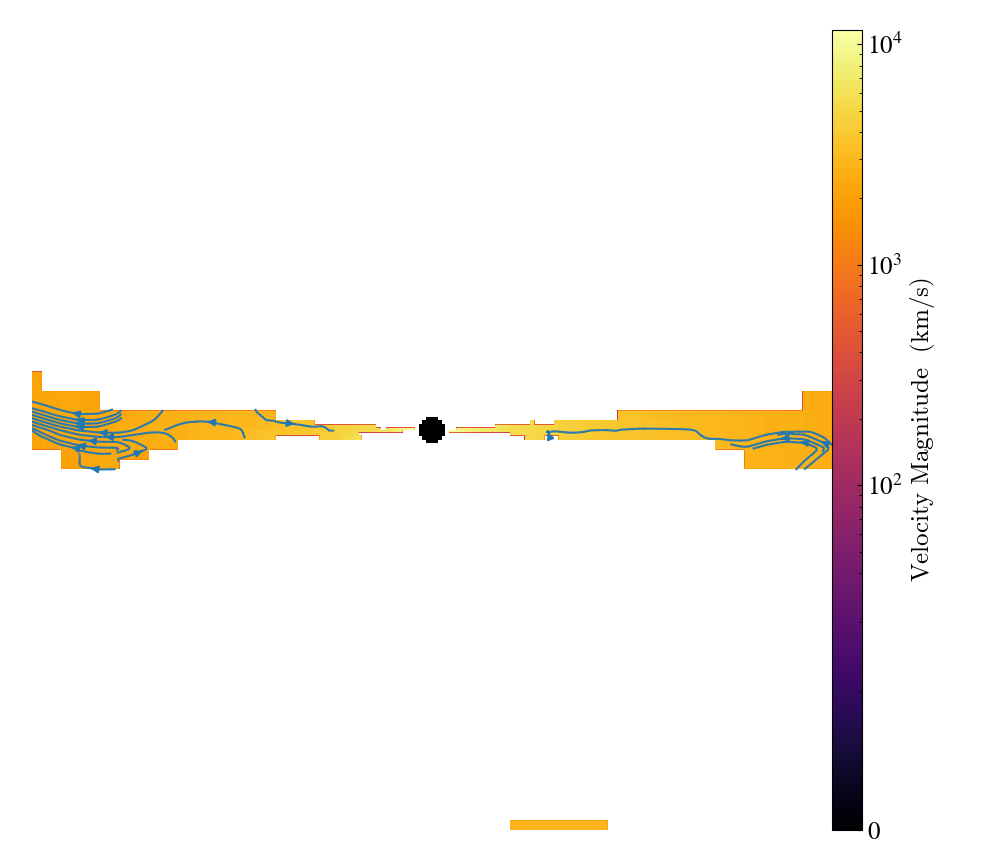

In [33]:
small_regin = ds.sphere("c", (1, "kpc"))
hot_gas = small_regin.cut_region(["obj['temperature'] < 1.e6"])

field = ("gas", "velocity_magnitude")
prj = yt.SlicePlot(
    ds,
    "x",
    field,
    width= 0.01 * yt.units.kpc,
    buff_size=(1000, 1000),
    data_source=hot_gas,
    # weight_field=("gas", "density"),
)
# prj.annotate_quiver(("gas", "velocity_x"), ("gas", "velocity_y"), normalize=False, factor=16)
prj.annotate_scale(coeff=5,unit='pc',corner='lower_left')
prj.annotate_timestamp(time_unit="Myr",corner='upper_right')
# prj.annotate_quiver(("gas", "velocity_x"),("gas", "velocity_y"))
prj.annotate_streamlines(("athena_pp", "vel2"), ("athena_pp", "vel3"), factor=4, density=8)
prj.set_unit(field, "km/s")
prj.set_cmap(field, 'inferno')
# prj.set_log(field,True)
prj.hide_axes()
prj.show()

yt : [WARNING  ] 2024-02-23 23:18:36,937 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:18:36,938 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:18:36,938 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:18:36,939 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:18:36,940 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:18:36,988 Parameters: current_time              = 80.10000002589832
yt : [INFO     ] 2024-02-23 23:18:36,988 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:18:36,989 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:18:36,990 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:18:36,990 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:18:40,638 xlim = -0.000156 0.000156
yt : [INFO


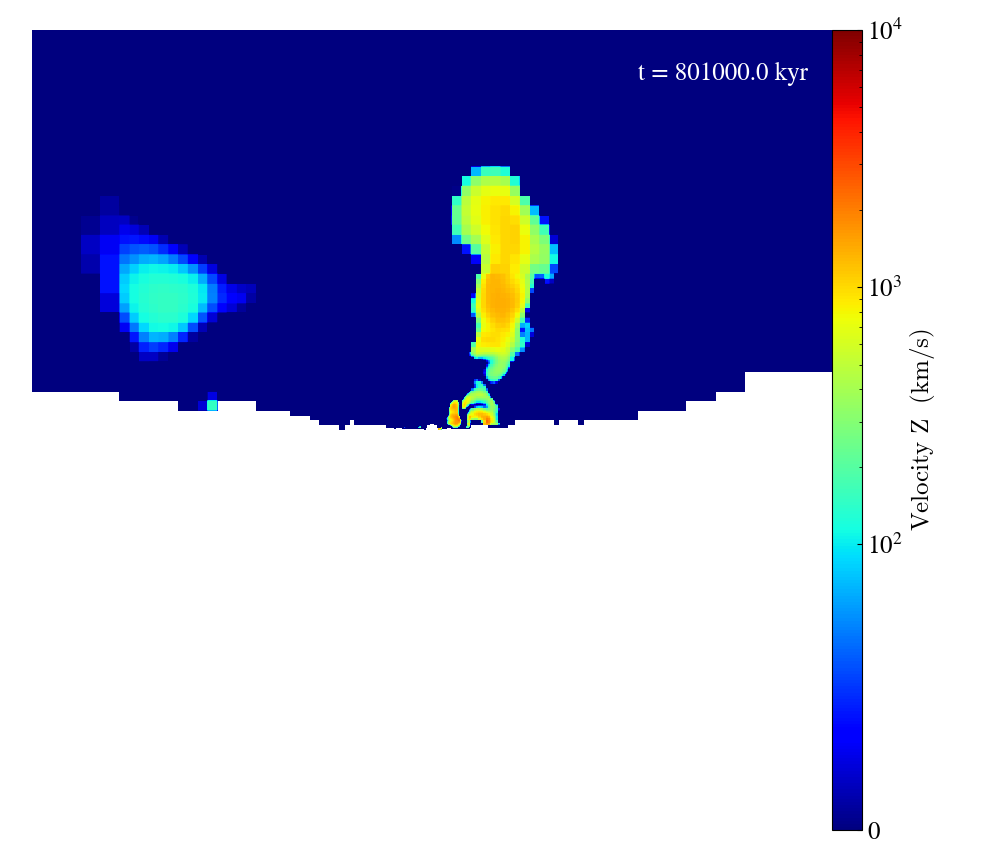

yt : [WARNING  ] 2024-02-23 23:18:43,010 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:18:43,011 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:18:43,011 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:18:43,012 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:18:43,013 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:18:43,064 Parameters: current_time              = 80.11000000681517
yt : [INFO     ] 2024-02-23 23:18:43,064 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:18:43,065 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:18:43,066 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:18:43,066 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:18:46,432 xlim = -0.000156 0.000156
yt : [INFO


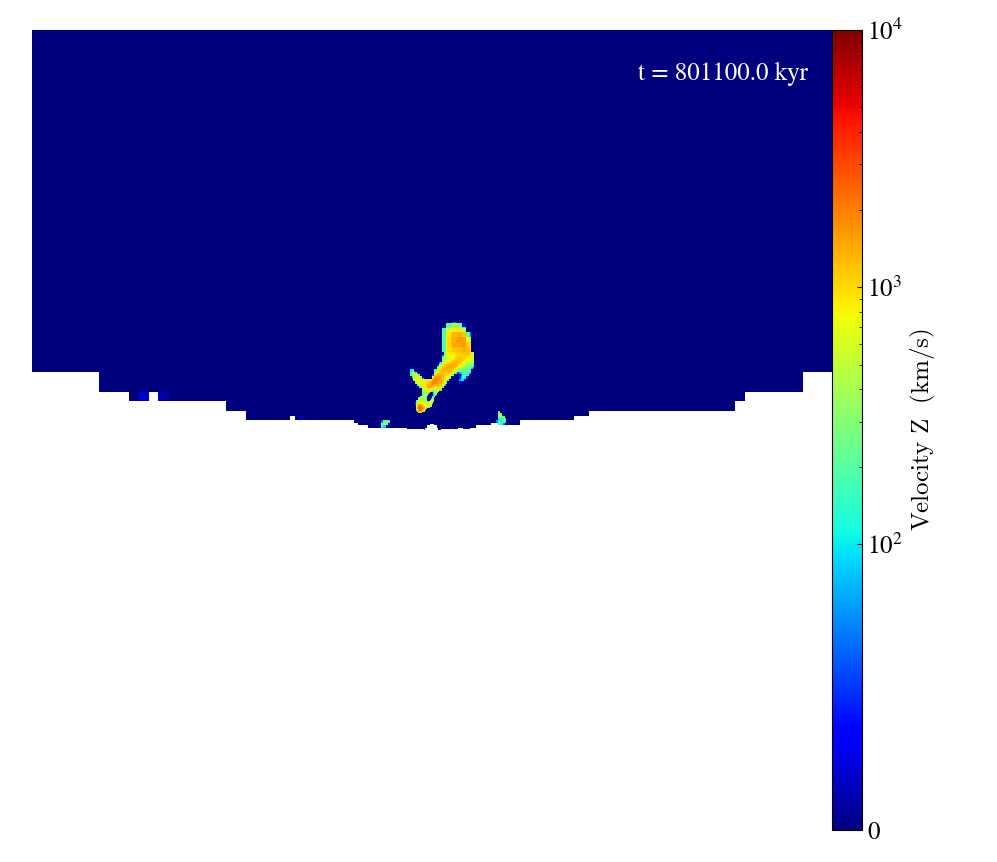

yt : [WARNING  ] 2024-02-23 23:18:47,561 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:18:47,562 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:18:47,562 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:18:47,563 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:18:47,564 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:18:47,612 Parameters: current_time              = 80.120000027607
yt : [INFO     ] 2024-02-23 23:18:47,613 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:18:47,614 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:18:47,615 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:18:47,615 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:18:51,431 xlim = -0.000156 0.000156
yt : [INFO  


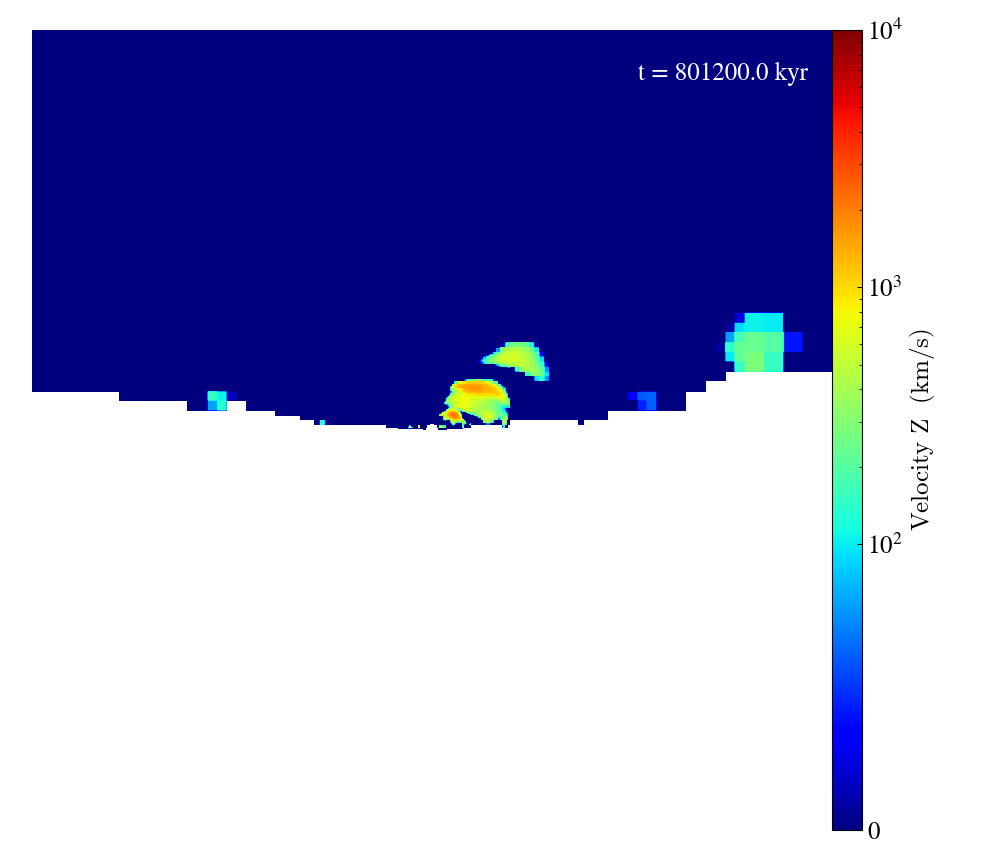

yt : [WARNING  ] 2024-02-23 23:18:53,489 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:18:53,490 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:18:53,491 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:18:53,492 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:18:53,493 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:18:53,543 Parameters: current_time              = 80.13000000651462
yt : [INFO     ] 2024-02-23 23:18:53,543 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:18:53,544 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:18:53,545 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:18:53,545 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:18:57,382 xlim = -0.000156 0.000156
yt : [INFO


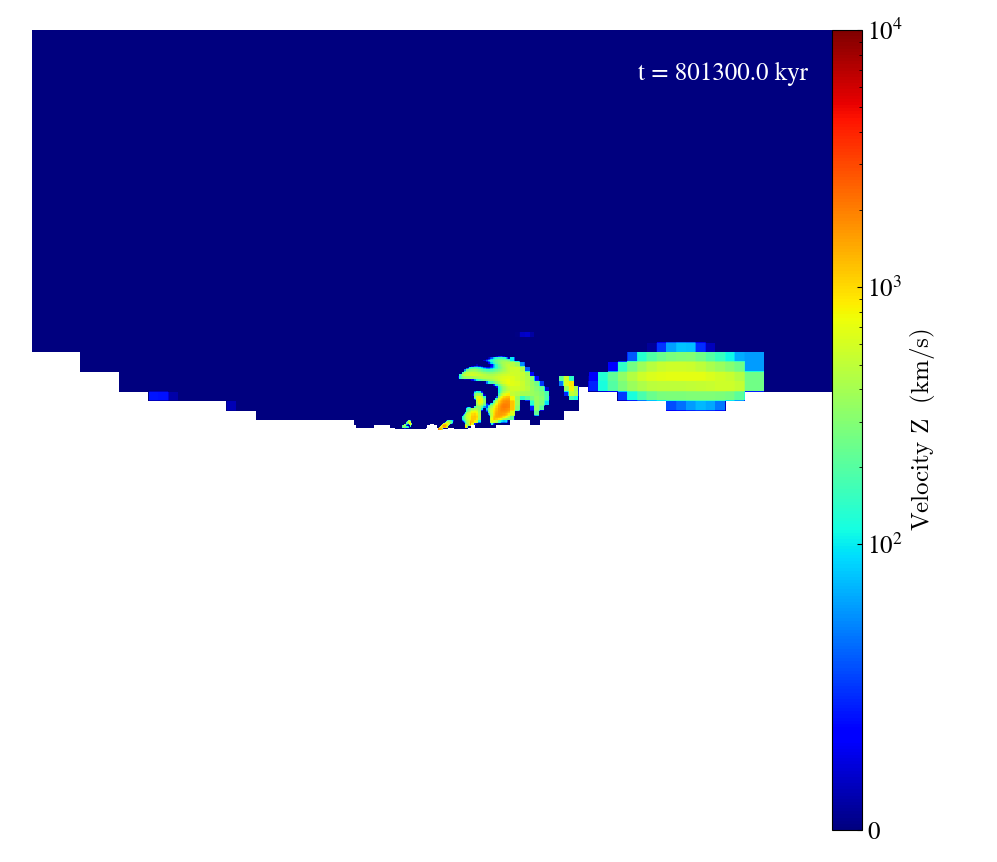

yt : [WARNING  ] 2024-02-23 23:18:58,691 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:18:58,692 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:18:58,693 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:18:58,694 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:18:58,695 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:18:58,745 Parameters: current_time              = 80.14000001253842
yt : [INFO     ] 2024-02-23 23:18:58,746 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:18:58,746 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:18:58,747 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:18:58,748 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:19:03,277 xlim = -0.000156 0.000156
yt : [INFO


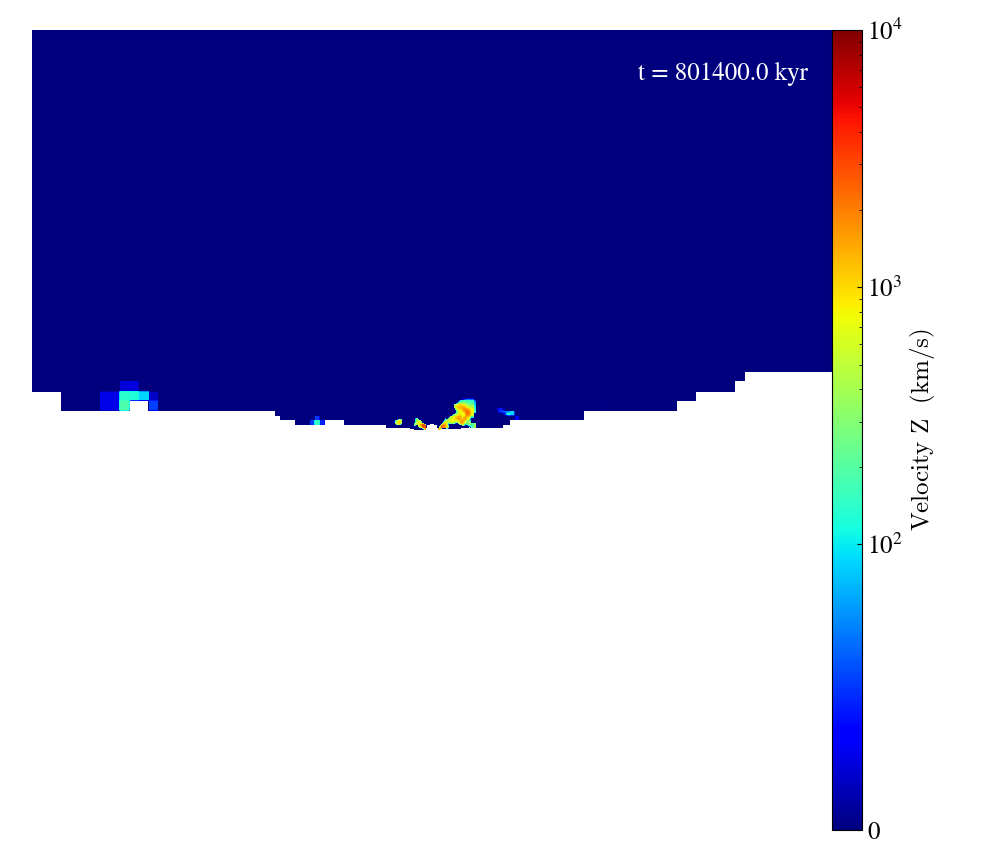

yt : [WARNING  ] 2024-02-23 23:19:04,578 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:19:04,579 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:19:04,579 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:19:04,580 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:19:04,581 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:19:04,629 Parameters: current_time              = 80.1500000321314
yt : [INFO     ] 2024-02-23 23:19:04,629 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:19:04,630 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:19:04,631 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:19:04,631 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:19:07,951 xlim = -0.000156 0.000156
yt : [INFO 


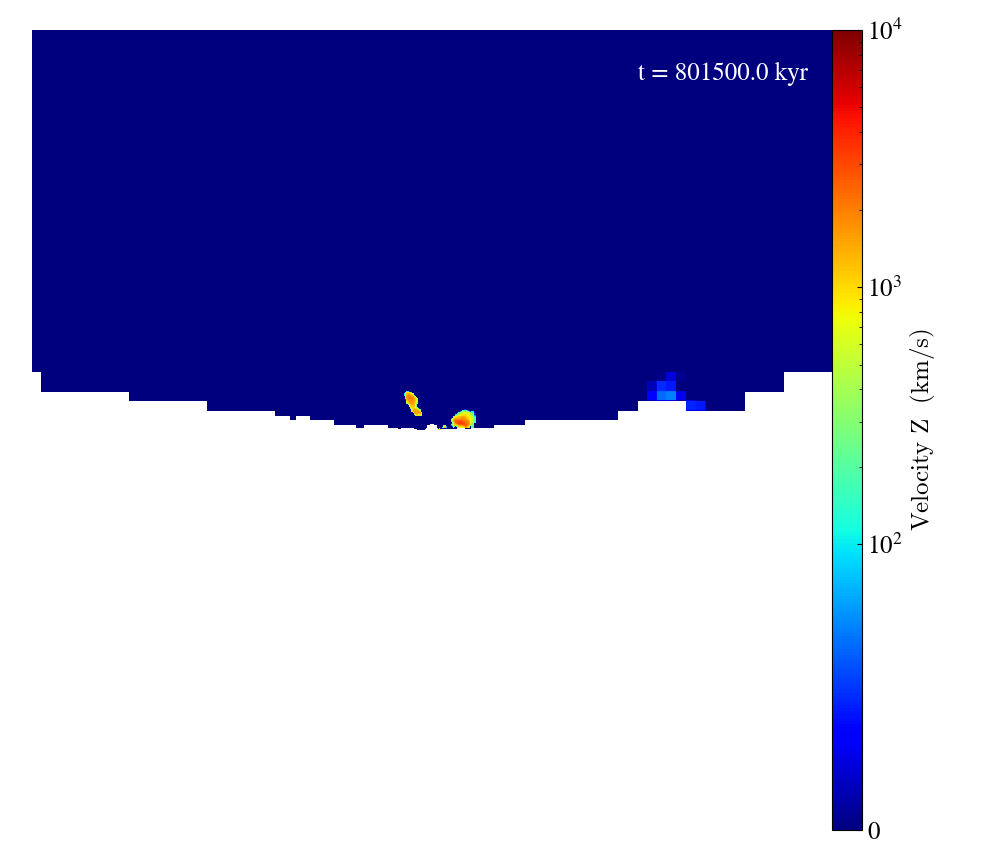

yt : [WARNING  ] 2024-02-23 23:19:09,169 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:19:09,170 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:19:09,171 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:19:09,171 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:19:09,172 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:19:09,224 Parameters: current_time              = 80.16000003445667
yt : [INFO     ] 2024-02-23 23:19:09,225 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:19:09,225 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:19:09,226 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:19:09,226 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:19:13,821 xlim = -0.000156 0.000156
yt : [INFO


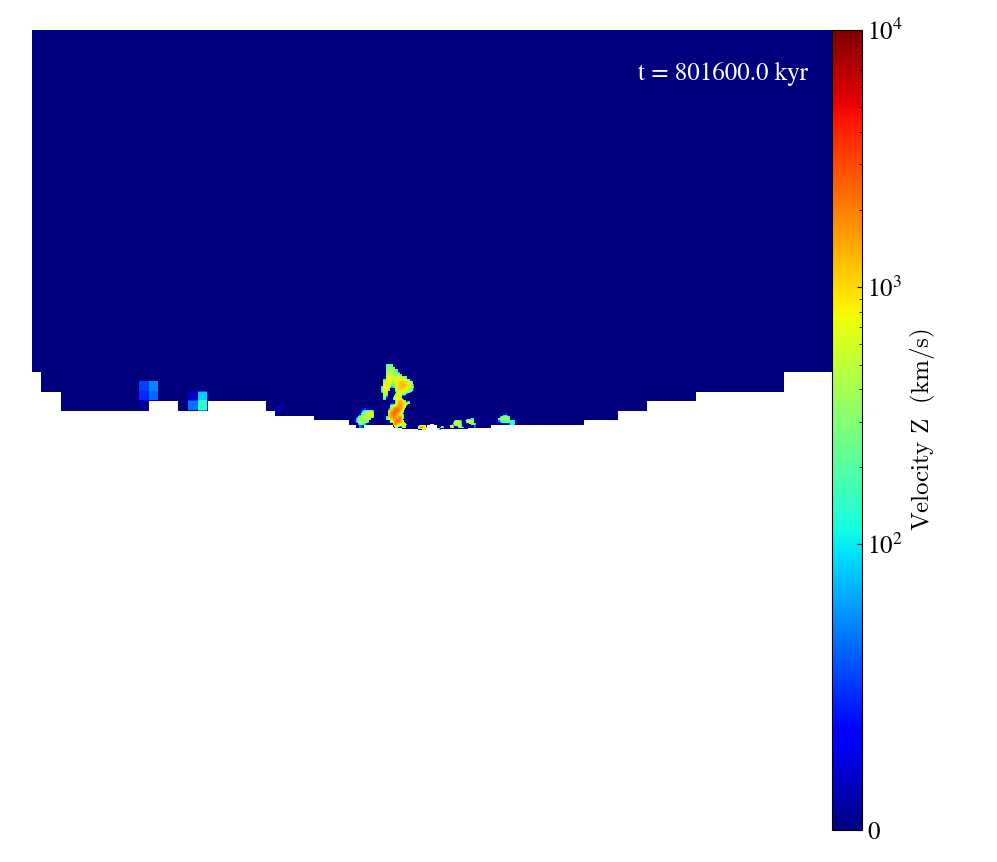

yt : [WARNING  ] 2024-02-23 23:19:15,040 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:19:15,041 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:19:15,042 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:19:15,043 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:19:15,043 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:19:15,093 Parameters: current_time              = 80.17000002349242
yt : [INFO     ] 2024-02-23 23:19:15,094 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:19:15,094 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:19:15,095 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:19:15,095 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:19:19,155 xlim = -0.000156 0.000156
yt : [INFO


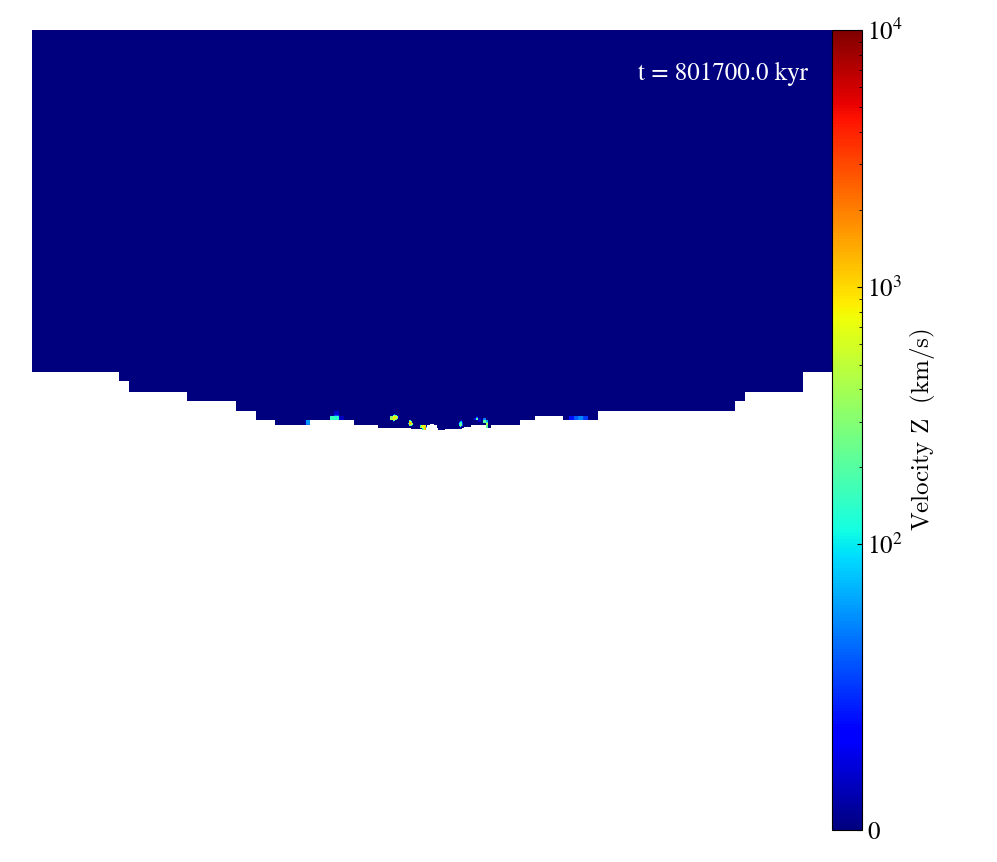

yt : [WARNING  ] 2024-02-23 23:19:20,497 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:19:20,498 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:19:20,499 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:19:20,499 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:19:20,500 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:19:20,550 Parameters: current_time              = 80.18000000756987
yt : [INFO     ] 2024-02-23 23:19:20,551 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:19:20,552 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:19:20,552 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:19:20,553 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:19:25,015 xlim = -0.000156 0.000156
yt : [INFO


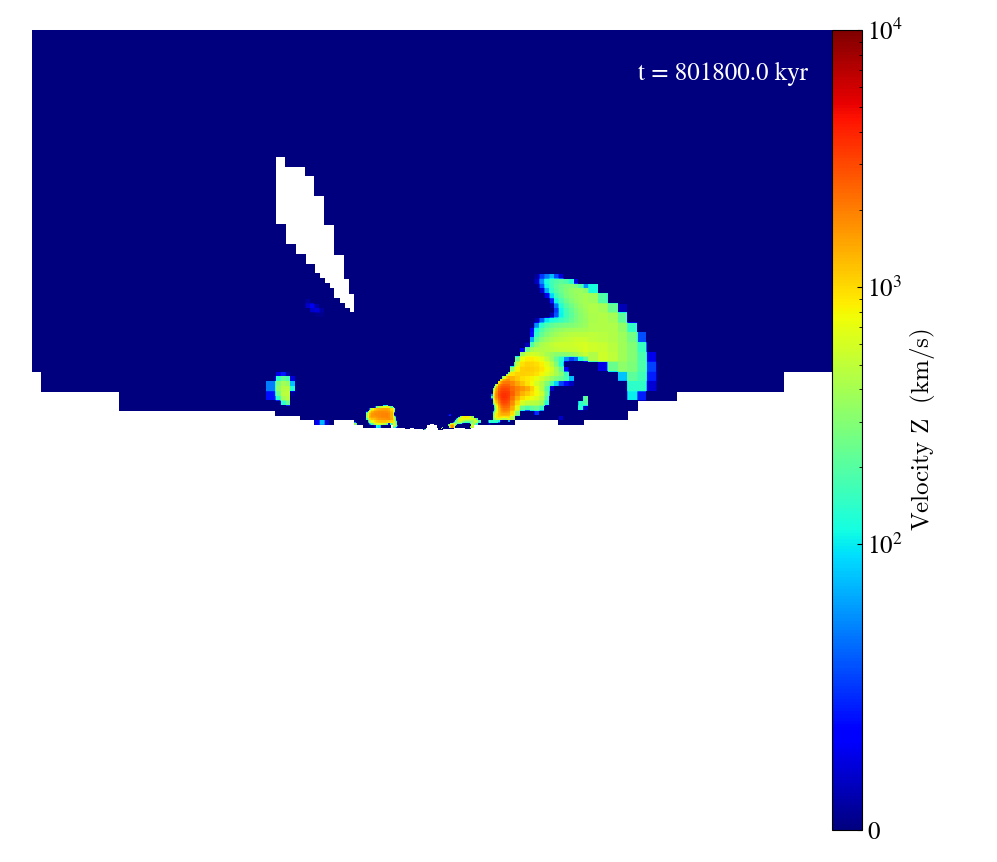

yt : [WARNING  ] 2024-02-23 23:19:26,398 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:19:26,399 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:19:26,400 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:19:26,401 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:19:26,402 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:19:26,451 Parameters: current_time              = 80.19000001511384
yt : [INFO     ] 2024-02-23 23:19:26,452 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:19:26,452 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:19:26,453 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:19:26,454 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:19:29,836 xlim = -0.000156 0.000156
yt : [INFO


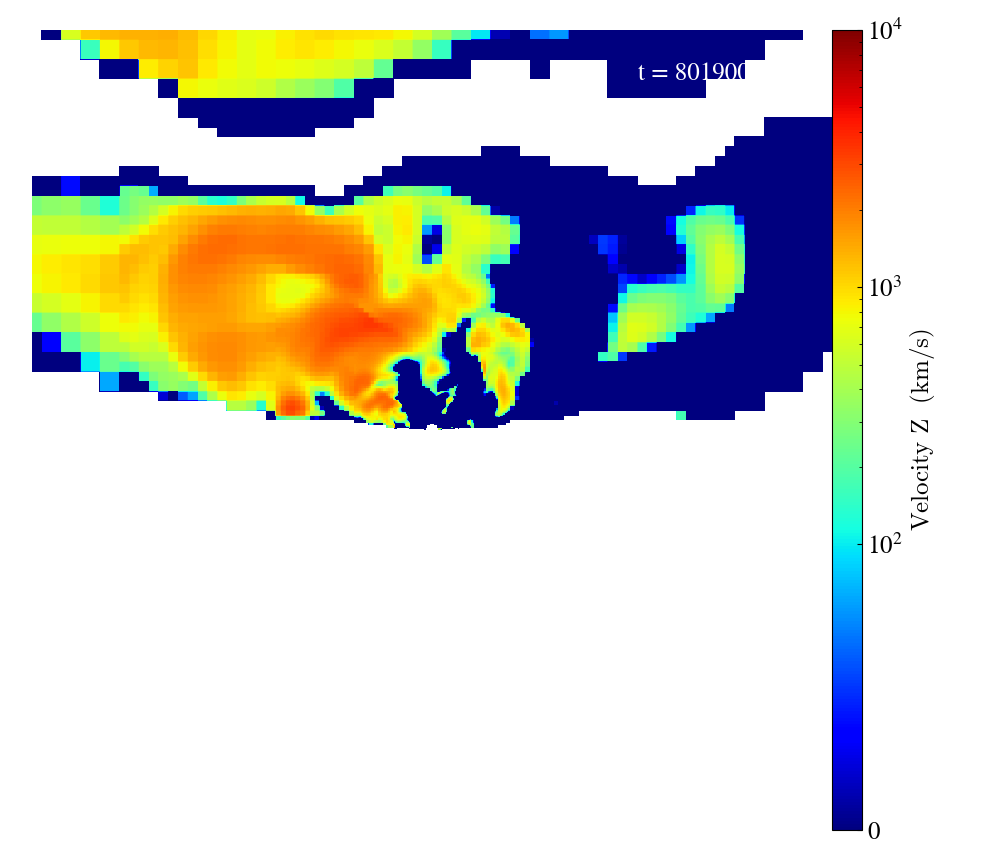

yt : [WARNING  ] 2024-02-23 23:19:31,038 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 23:19:31,039 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 23:19:31,040 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 23:19:31,040 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 23:19:31,041 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 23:19:31,090 Parameters: current_time              = 80.2
yt : [INFO     ] 2024-02-23 23:19:31,091 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 23:19:31,091 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 23:19:31,092 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 23:19:31,092 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 23:19:35,401 xlim = -0.000156 0.000156
yt : [INFO     ] 2024-0


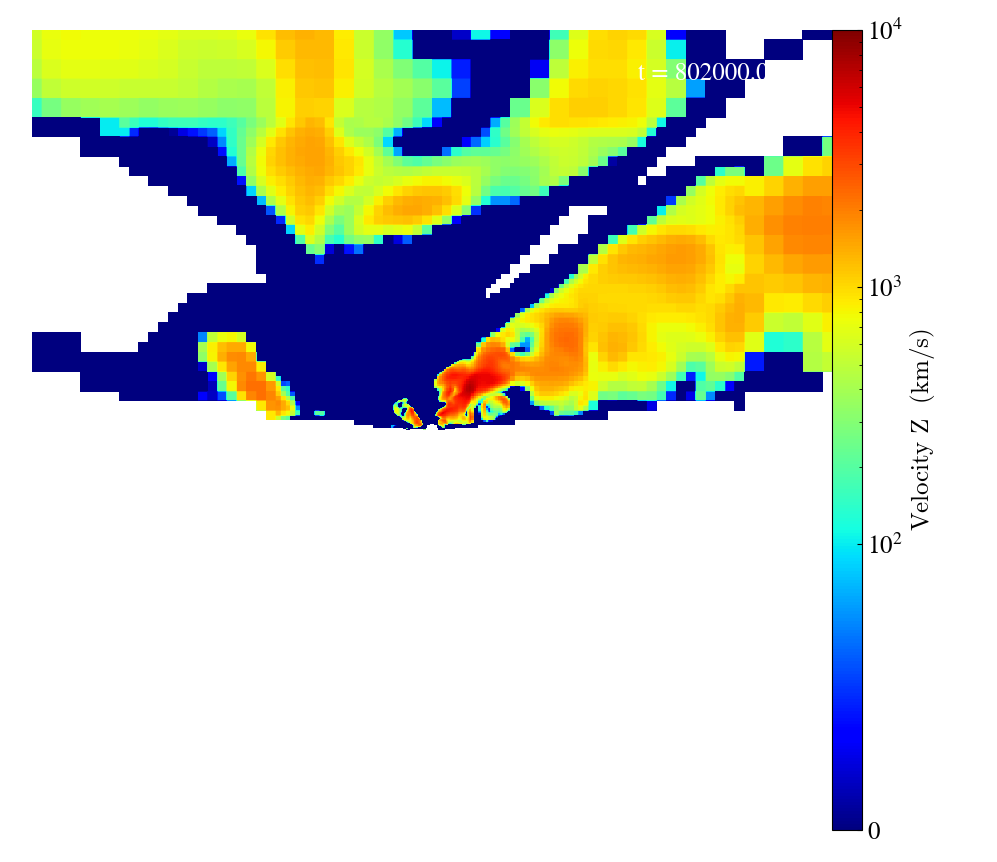

In [12]:
for n in range(260, 361, 10):
    ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=n),units_override=units_override)

    small_region = ds.sphere("c", (0.1, "kpc"))
    hot_gas = small_region.cut_region(["obj['temperature'] > 1.e7","obj['z'] > 0"])#ds.all_data()

    field = ("gas", "velocity_z")
    slc = yt.SlicePlot(
        ds,
        "x",
        field,
        width= 0.02 * yt.units.kpc,
        buff_size=(1000, 1000),
        data_source=hot_gas,
    )
    # prj.annotate_quiver(("gas", "velocity_x"), ("gas", "velocity_y"), normalize=False, factor=16)
    slc.annotate_scale(coeff=5,unit='pc',corner='lower_left')
    slc.annotate_timestamp(time_unit="kyr",corner='upper_right')
    # prj.annotate_quiver(("gas", "velocity_x"),("gas", "velocity_y"))
    slc.set_unit(field, "km/s")
    slc.set_cmap(field, 'jet')
    slc.set_zlim(field, zmin=0., zmax=1.e4)
    slc.set_log(field,linthresh=1.e2)
    slc.hide_axes()
    slc.show()

yt : [INFO     ] 2024-04-03 11:18:28,426 Projection completed
yt : [INFO     ] 2024-04-03 11:18:28,426 xlim = -0.009375 0.009375
yt : [INFO     ] 2024-04-03 11:18:28,427 ylim = -0.009375 0.009375
yt : [INFO     ] 2024-04-03 11:18:28,427 xlim = -0.009375 0.009375
yt : [INFO     ] 2024-04-03 11:18:28,427 ylim = -0.009375 0.009375
yt : [INFO     ] 2024-04-03 11:18:28,428 Making a fixed resolution buffer of (('gas', 'number_density')) 1000 by 1000



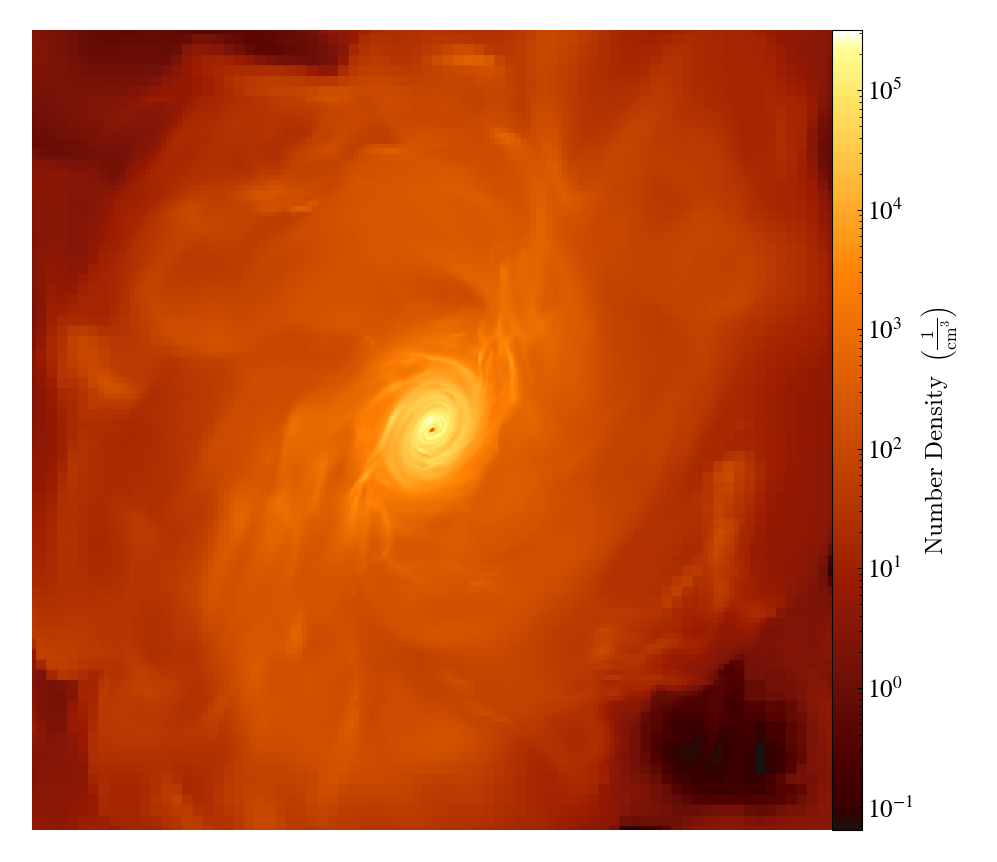

In [13]:
from yt.units import kpc

# ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=180),units_override=units_override)
prj = yt.ProjectionPlot(
    ds,
    "y",
    ("gas", "number_density"),
    width=(1.20 * kpc),
    buff_size=(1000, 1000),
    axes_unit= "kpc",
    weight_field=('gas','density'),
)
# prj.annotate_scale(corner='lower_left')
# prj.annotate_timestamp(time_unit="Myr",corner='upper_right')
# prj.annotate_title("Y projection plot")
# prj.annotate_quiver(("gas", "velocity_x"),("gas", "velocity_y"))
prj.set_unit(("gas", "number_density"), "1/cm**3")
# prj.set_zlim(field=('gas', 'number_density'), zmax=1.e3)
# prj.annotate_streamlines(("gas", "velocity_x"), ("gas", "velocity_y"),color="white",density=2, factor=8)
# prj.annotate_sphere([0,0,0], radius=(5,"pc"))#, text=r"R = 120 pc $\sim R_{\rm B}$")
prj.swap_axes()
prj.hide_axes()
prj.set_cmap(('gas','number_density'), 'afmhot_10us')
prj.set_log(('gas','number_density'),True)
prj.show()

Off-axis projection plot

yt : [INFO     ] 2024-03-31 00:21:24,799 xlim = -0.703125 0.703125
yt : [INFO     ] 2024-03-31 00:21:24,800 ylim = -0.703125 0.703125
yt : [INFO     ] 2024-03-31 00:21:24,800 zlim = -1.000000 1.000000
yt : [INFO     ] 2024-03-31 00:21:24,801 Making a fixed resolution buffer of (('gas', 'vr')) 1200 by 1200



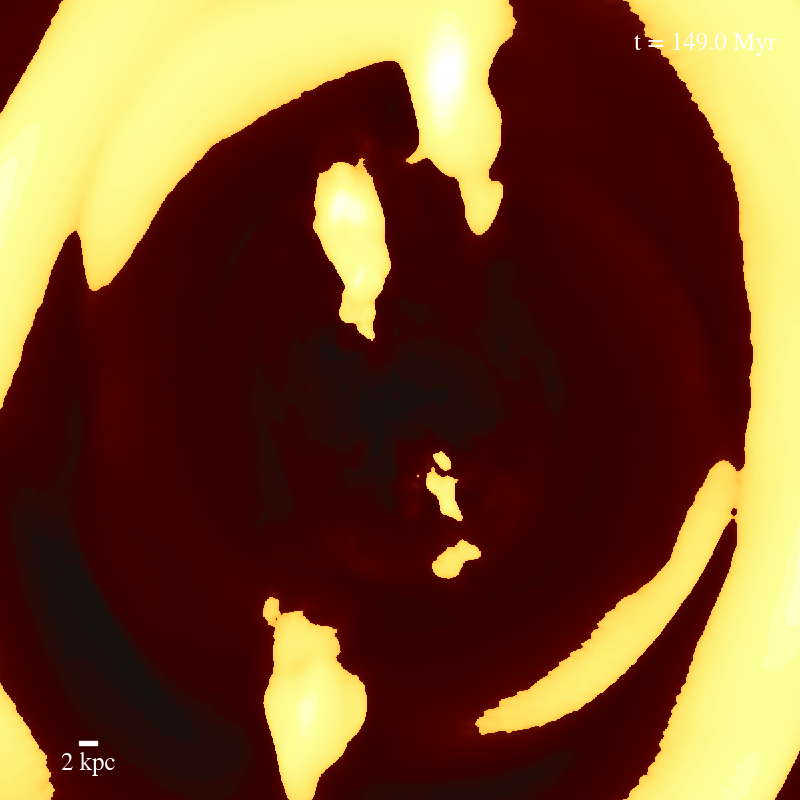

In [100]:
# ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=360),units_override=units_override)
L = [0.5, 0.35, 0.2]  # vector normal to cutting plane
prj = yt.ProjectionPlot(ds, L, ("gas", "vr"), width=((9e1, "kpc"), (9e1, "kpc")), weight_field=('gas','temperature'), buff_size=(1200, 1200), )
prj.annotate_scale(coeff=2,unit='kpc',corner='lower_left')
prj.annotate_timestamp(time_unit="Myr",corner='upper_right')
# prj.annotate_title("Custom projection")
# prj.set_unit(("gas", "number_density"), "1/cm**3")
prj.set_cmap(('gas','vr'), 'afmhot_10us')
prj.hide_axes()
prj.hide_colorbar()
# prj.set_zlim(field=('gas', 'number_density'), zmin=1.e-2, zmax=7.e-1,)
prj.show()

In [60]:
ds.r[('gas','density')].to("Msun/Mpc**3")

YTArray([7.81322977e+13, 7.80347884e+13, 7.79369677e+13, ...,
         7.79369677e+13, 7.80347884e+13, 7.81322977e+13]) Msun/Mpc**3

In [31]:
mu = 0.62
mH = 8.418e-64
h_par = 0.7
H0 = h_par * 100 * 1.e-6
G_big = 4.3009e-21
code_length = 0.2
code_mass = 1.
code_area = code_length**2
code_volume = code_length**3
code_time = 10.
code_velocity = code_length / code_time
code_momentum = code_velocity * code_mass
code_density = code_mass / code_volume
code_acceleration = code_velocity / code_time
code_force = code_mass * code_acceleration
code_pressure = code_force / code_area
code_energy = code_force * code_length

In [57]:
ds.time_unit
ds.time_unit.to('code_time')

1.0 code_time

In [64]:
ds.r['athena_pp','press'].to("Msun/(Mpc*Myr**2)")

unyt_array([1.73472348e-19, 1.73472348e-19, 1.73472348e-19, ...,
            1.73472492e-19, 1.73472492e-19, 1.73472492e-19], 'Msun/(Mpc*Myr**2)')

In [15]:
ds.units.newtons_constant

unyt_quantity(5.62295928e-17, 'code_length**3/(code_mass*code_time**2)')

In [18]:
ds.no_cgs_equiv_length

False

In [45]:
ds.r[('index','x')]

unyt_array([-0.9921875, -0.9921875, -0.9921875, ...,  0.9921875,
             0.9921875,  0.9921875], 'code_length')

In [65]:
ds.current_time.to("Gyr")

unyt_quantity(0.6207638, dtype=float32, units='Gyr')

Read all output files, compute dP/dr, rho, g, then return the difference

In [105]:
import glob
def output_files(directory):
    lsdir = glob.glob(directory+'/*.athdf')
    lsdir.sort()
    return lsdir
lsout = output_files('/Volumes/T7/Research/BH_Accretion/athena_output/from_Anvil/cluster_test1030_2/')

Volume render

yt : [INFO     ] 2023-04-27 11:49:21,223 Setting default field to ('gas', 'density')
yt : [INFO     ] 2023-04-27 11:49:22,635 Rendering scene (Can take a while).
yt : [INFO     ] 2023-04-27 11:49:22,636 Creating volume


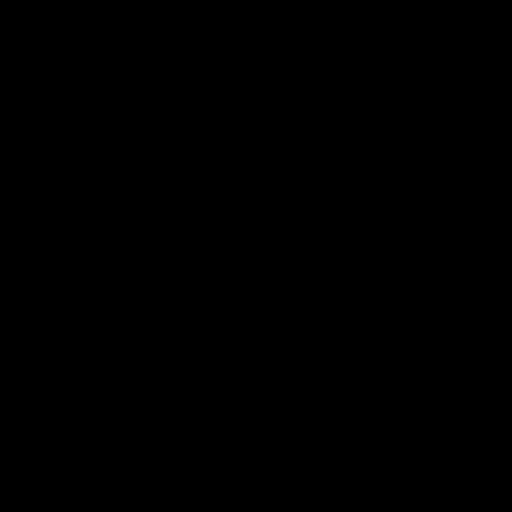

In [262]:
kpcCGS = 3.08567758096e+21
MpcCGS = kpcCGS * 1.e3
solarMassCGS = 1.988e33

sc = yt.create_scene(ds, lens_type="perspective")
#sc.camera.resolution = (1600,1600)

source = sc[0]

# source.tfh.set_bounds((1e-2,2.))
# source.tfh.set_log(True)

source.set_field(("gas", "density"))
source.set_log(True)

bounds = (1.e14/code_density*(solarMassCGS/MpcCGS**3), 1.e19/code_density*(solarMassCGS/MpcCGS**3))

# Since this rendering is done in log space, the transfer function needs
# to be specified in log space.
tf = yt.ColorTransferFunction(np.log10(bounds))

tf.add_layers(15, colormap="jet")

source.tfh.tf = tf
source.tfh.bounds = bounds
# source.tfh.grey_opacity = False

source.tfh.plot("test_plot.png", profile_field=("gas", "density"))

cam = sc.camera
cam.width = (0.8, "kpc")
cam.focus = ds.domain_center
#cam.normal_vector = [-0.3, -0.3, 1]
cam.switch_orientation()

sc.show()

In [30]:
sc.save(f"rendering_{file_n}4.png", sigma_clip=2, render=False)

yt : [INFO     ] 2022-11-20 01:56:09,131 Found previously rendered image to save.
yt : [INFO     ] 2022-11-20 01:56:09,136 Saving rendered image to rendering_000074.png


In [7]:
ds.r['gas','density'].max()

unyt_quantity(2.00228423e+14, 'code_mass/code_length**3')

In [33]:
ds.derived_field_list

[('athena_pp', 'cell_volume'),
 ('athena_pp', 'dx'),
 ('athena_pp', 'dy'),
 ('athena_pp', 'dz'),
 ('athena_pp', 'path_element_x'),
 ('athena_pp', 'path_element_y'),
 ('athena_pp', 'path_element_z'),
 ('athena_pp', 'press'),
 ('athena_pp', 'rho'),
 ('athena_pp', 'vel1'),
 ('athena_pp', 'vel2'),
 ('athena_pp', 'vel3'),
 ('athena_pp', 'volume'),
 ('athena_pp', 'x'),
 ('athena_pp', 'y'),
 ('athena_pp', 'z'),
 ('gas', 'angular_momentum_magnitude'),
 ('gas', 'angular_momentum_x'),
 ('gas', 'angular_momentum_y'),
 ('gas', 'angular_momentum_z'),
 ('gas', 'averaged_density'),
 ('gas', 'baroclinic_vorticity_magnitude'),
 ('gas', 'baroclinic_vorticity_x'),
 ('gas', 'baroclinic_vorticity_y'),
 ('gas', 'baroclinic_vorticity_z'),
 ('gas', 'cell_mass'),
 ('gas', 'cell_volume'),
 ('gas', 'courant_time_step'),
 ('gas', 'cutting_plane_velocity_x'),
 ('gas', 'cutting_plane_velocity_y'),
 ('gas', 'cutting_plane_velocity_z'),
 ('gas', 'density'),
 ('gas', 'density_gradient_magnitude'),
 ('gas', 'density_gr

In [29]:
ds.r['gas','number_density'].max().to("cm**-3")

unyt_quantity(0.05029063, 'cm**(-3)')

In [35]:
xArray = ds.r['athena_pp','x']
positiveXArray = xArray[xArray>0]
positiveXArray.sort()
print(positiveXArray)

[7.62939453e-06 7.62939453e-06 7.62939453e-06 ... 9.92187500e-01
 9.92187500e-01 9.92187500e-01] code_length


In [15]:
1./(128)

0.0078125

In [415]:
ds.r["athena_pp", 'vel1'].to("km/s").max()

unyt_quantity(0., 'km/s')

Save temperature profile

In [2]:
maxR = (30, "kpc")
ds = yt.load(makeFilename(pathName=path, baseExtension=base_ext, n=2),units_override=units_override)
sp0 = ds.sphere("c", maxR)
rp0 = yt.create_profile(
    sp0,
    ("index", "radius"),
    ("gas", "temperature"),
    units={("index", "radius"): "kpc"},
    logs={("index", "radius"): True},
)
temperatureProfile = rp0.field_data
radiusProfile = rp0.x

yt : [WARNING  ] 2023-04-24 00:25:54,064 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2023-04-24 00:25:54,064 Overriding length_unit: 0.032 Mpc.
yt : [INFO     ] 2023-04-24 00:25:54,065 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2023-04-24 00:25:54,065 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2023-04-24 00:25:54,066 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2023-04-24 00:25:54,089 Parameters: current_time              = 1.0000069
yt : [INFO     ] 2023-04-24 00:25:54,090 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2023-04-24 00:25:54,091 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2023-04-24 00:25:54,092 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-04-24 00:25:54,093 Parameters: cosmological_simulation   = 0


In [3]:
temperatureProfile

{('gas',
  'temperature'): unyt_array([  200021.25597148,        0.        ,        0.        ,
               200021.25597148,        0.        ,   200021.25597148,
               200021.25597148,   200021.25597148,   200021.25597148,
               200021.25597148,   200021.25597148,   200021.25597148,
               200021.25597148,   200021.25597148,   200021.25597148,
               200021.25597148,   200021.25597148,   200021.25597148,
               200021.25597148,   200021.25597148,   200021.25597148,
               200021.25597148,   200021.25597148,   200021.25597148,
             30850774.52470823, 31028932.55834237, 29275001.20704416,
             27281326.76438181, 25362817.71227614, 23610116.2379158 ,
             22600113.76094539, 20765767.5368682 , 19459521.3577523 ,
             18412923.74741093, 17506779.59053829, 16730891.9591988 ,
             16084916.39011382, 15557825.40039661, 15154895.20025718,
             14867556.95926139, 14686939.19206299, 14606518.8355

In [96]:
tP = temperatureProfile.tolist()['gas','temperature'].to_ndarray()
rP = radiusProfile.tolist()
print(rP)

AttributeError: 'YTFieldData' object has no attribute 'tolist'

Add cooling time and sound crossing time fields

In [13]:
kpcCGS = 3.08567758096e+21
MpcCGS = kpcCGS * 1.e3
yearCGS = 31557600.0
MyrCGS = yearCGS * 1.e6
solarMassCGS = 1.988e33
boltzmannConstCGS = 1.3806488e-16

boltzmannConstAstronomical = boltzmannConstCGS / (solarMassCGS * MpcCGS**2 * MyrCGS**-2)
codeBoltzmannConst = boltzmannConstAstronomical / (code_energy / code_temperature)

logTemperatureArray = np.array([3.8, 3.84, 3.88, 3.92, 3.96, 4., 4.04, 4.08, 4.12, 4.16, 4.2,
                                          4.24, 4.28, 4.32, 4.36, 4.4, 4.44, 4.48, 4.52, 4.56, 4.6, 4.64,
                                          4.68, 4.72, 4.76, 4.8, 4.84, 4.88, 4.92, 4.96, 5., 5.04, 5.08,
                                          5.12, 5.16, 5.2, 5.24, 5.28, 5.32, 5.36, 5.4, 5.44, 5.48, 5.52,
                                          5.56, 5.6, 5.64, 5.68, 5.72, 5.76, 5.8, 5.84, 5.88, 5.92, 5.96,
                                          6., 6.04, 6.08, 6.12, 6.16, 6.2, 6.24, 6.28, 6.32, 6.36, 6.4,
                                          6.44, 6.48, 6.52, 6.56, 6.6, 6.64, 6.68, 6.72, 6.76, 6.8, 6.84,
                                          6.88, 6.92, 6.96, 7., 7.04, 7.08, 7.12, 7.16, 7.2, 7.24, 7.28,
                                          7.32, 7.36, 7.4, 7.44, 7.48, 7.52, 7.56, 7.6, 7.64, 7.68, 7.72,
                                          7.76, 7.8, 7.84, 7.88, 7.92, 7.96, 8., 8.04, 8.08, 8.12, 8.16])
logEmissivityHydroArray = np.array([-30.6104, -29.4107, -28.4601, -27.5743, -26.3766, -25.289,
                                              -24.2684, -23.3834, -22.5977, -21.9689, -21.5972, -21.4615,
                                              -21.4789, -21.5497, -21.6211, -21.6595, -21.6426, -21.5688,
                                              -21.4771, -21.3755, -21.2693, -21.1644, -21.0658, -20.9778,
                                              -20.8986, -20.8281, -20.77, -20.7223, -20.6888, -20.6739,
                                              -20.6815, -20.7051, -20.7229, -20.7208, -20.7058, -20.6896,
                                              -20.6797, -20.6749, -20.6709, -20.6748, -20.7089, -20.8031,
                                              -20.9647, -21.1482, -21.2932, -21.3767, -21.4129, -21.4291,
                                              -21.4538, -21.5055, -21.574, -21.63, -21.6615, -21.6766,
                                              -21.6886, -21.7073, -21.7304, -21.7491, -21.7607, -21.7701,
                                              -21.7877, -21.8243, -21.8875, -21.9738, -22.0671, -22.1537,
                                              -22.2265, -22.2821, -22.3213, -22.3462, -22.3587, -22.3622,
                                              -22.359, -22.3512, -22.342, -22.3342, -22.3312, -22.3346,
                                              -22.3445, -22.3595, -22.378, -22.4007, -22.4289, -22.4625,
                                              -22.4995, -22.5353, -22.5659, -22.5895, -22.6059, -22.6161,
                                              -22.6208, -22.6213, -22.6184, -22.6126, -22.6045, -22.5945,
                                              -22.5831, -22.5707, -22.5573, -22.5434, -22.5287, -22.514,
                                              -22.4992, -22.4844, -22.4695, -22.4543, -22.4392, -22.4237,
                                              -22.4087, -22.3928])

tempList = np.logspace(3.,9.,200)

def emissivityFromTemperature(temperature):
    #Real emissivityCGS, emissivityAstronomical;
    logTemperature = np.log10(temperature)
    if logTemperature <= 4.2: # Koyama & Inutsuka (2002)
        emissivityCGS = (2.0e-19 * np.exp(-1.184e5 / (temperature + 1.e3)) + 2.8e-28 * np.sqrt(temperature) * np.exp(-92. / temperature))
    elif logTemperature > 8.15: # Schneider & Robertson (2018)
        emissivityCGS = 10.**(0.45 * logTemperature - 26.065)
    else: # Schure+09
        emissivityCGS = 10.**(np.interp(logTemperature, logTemperatureArray, logEmissivityHydroArray))

    emissivityAstronomical = emissivityCGS / (solarMassCGS * pow(MpcCGS, 5) * pow(MyrCGS, -3))

    return emissivityCGS

lambdaListCGS = np.zeros(200)
for i, temp in enumerate(tempList):
    lambdaListCGS[i] = emissivityFromTemperature(temp)

from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
interpLambdaFunction = interp1d(tempList, lambdaListCGS)

from yt import physical_constants as phc
from yt import derived_field

SMBHMass = 6.5e9

@derived_field(name="cooling_time", sampling_type="cell", units="Myr", force_override=True)
def _cooling_time(field, data):
    return ( (5/2) *  phc.kboltz * (data["gas", "temperature"].to("K")) / ((data["gas", "number_density"].to("cm**-3")) * np.interp(data["gas", "temperature"].to("K").value, tempList, lambdaListCGS) * (ds.units.erg / ds.units.s * ds.units.cm**3)))

@derived_field(name="sound_crossing_time", sampling_type="cell", units="Myr", force_override=True)
def _sound_crossing_time(field, data):
    return data["gas", "dx"] / np.sqrt(data.ds.gamma * data["gas", "pressure"] / data["gas", "density"])

@derived_field(name="cooling_ratio", sampling_type="cell", force_override=True)
def _cooling_ratio(field, data):
    return data["gas", "cooling_time"] / data["gas", "sound_crossing_time"]

@derived_field(name="keplerian_speed", sampling_type="cell", units="Mpc/Myr", force_override=True)
def _keplerian_speed(field, data):
    return np.sqrt(phc.G * SMBHMass * phc.msun / data["index", "radius"])

@derived_field(name="keplerian_specific_angular_momentum", sampling_type="cell", units="Mpc**2/Myr", force_override=True)
def _keplerian_specific_angular_momentum(field, data):
    return data["gas", "keplerian_speed"] * data["index", "radius"]

@derived_field(name="normalized_specific_angular_momentum_x", sampling_type="cell", force_override=True)
def _normalized_specific_angular_momentum_x(field, data):
    return data["gas", "specific_angular_momentum_x"] / data["gas", "keplerian_specific_angular_momentum"]

@derived_field(name="normalized_specific_angular_momentum_y", sampling_type="cell", force_override=True)
def _normalized_specific_angular_momentum_y(field, data):
    return data["gas", "specific_angular_momentum_y"] / data["gas", "keplerian_specific_angular_momentum"]

@derived_field(name="normalized_specific_angular_momentum_z", sampling_type="cell", force_override=True)
def _normalized_specific_angular_momentum_z(field, data):
    return data["gas", "specific_angular_momentum_z"] / data["gas", "keplerian_specific_angular_momentum"]

@derived_field(name="keplerian_angular_momentum", sampling_type="cell", force_override=True)
def _keplerian_angular_momentum(field, data):
    return data["gas", "mass"] * data["gas", "keplerian_specific_angular_momentum"]

@derived_field(name="normalized_angular_momentum_x", sampling_type="cell", force_override=True)
def _normalized_angular_momentum_x(field, data):
    return data["gas", "angular_momentum_x"] / data["gas", "keplerian_angular_momentum"]

@derived_field(name="normalized_angular_momentum_y", sampling_type="cell", force_override=True)
def _normalized_angular_momentum_y(field, data):
    return data["gas", "angular_momentum_y"] / data["gas", "keplerian_angular_momentum"]

@derived_field(name="normalized_angular_momentum_z", sampling_type="cell", force_override=True)
def _normalized_angular_momentum_z(field, data):
    return data["gas", "angular_momentum_z"] / data["gas", "keplerian_angular_momentum"]

@derived_field(name="free_fall_time", sampling_type="cell", units="Myr", force_override=True)
def _free_fall_time(field, data):
    return np.pi / 2 * data["index","radius"]**(3/2) / np.sqrt(2 * phc.G * (SMBHMass * phc.msun + data["gas", "mass"]))

@derived_field(name="free_fall_ratio", sampling_type="cell", force_override=True)
def _free_fall_ratio(field, data):
    return data["gas", "cooling_time"] / data["gas", "free_fall_time"]

@derived_field(name="density_squared", sampling_type="cell", units="msun**2*Mpc**-6", force_override=True)
def _density_squared(field, data):
    return data["gas", "density"]**2

@derived_field(name="angle_theta", sampling_type="cell", force_override=True)
def _angle_theta(field, data):
    return np.arccos(data["index", "z"] / data["index", "radius"])

@derived_field(name="angle_phi", sampling_type="cell", force_override=True)
def _angle_phi(field, data):
    return np.arctan2(data["index", "y"], data["index", "x"])

@derived_field(name="vr", sampling_type="cell", units="km/s", force_override=True)
def _vr(field, data):
    return (data["gas", "velocity_x"] * data["index", "x"] + data["gas", "velocity_y"] * data["index", "y"] + data["gas", "velocity_z"] * data["index", "z"]) / data["index", "radius"]

@derived_field(name="vtheta", sampling_type="cell", units="", force_override=True)
def _vtheta(field, data):
    return (data["gas", "vr"] * data["gas", "angle_theta"] - data["gas", "velocity_z"]) / (data["index", "radius"] * np.sin(data["gas", "angle_theta"]))

@derived_field(name="vphi", sampling_type="cell", units="km/s", force_override=True)
def _vphi(field, data):
    return data["gas", "velocity_y"] * np.cos(data["gas", "angle_phi"]) - data["gas", "velocity_x"] * np.sin(data["gas", "angle_phi"])

In [43]:
np.round(np.log10(tempList),3)

array([3.   , 3.03 , 3.06 , 3.09 , 3.121, 3.151, 3.181, 3.211, 3.241,
       3.271, 3.302, 3.332, 3.362, 3.392, 3.422, 3.452, 3.482, 3.513,
       3.543, 3.573, 3.603, 3.633, 3.663, 3.693, 3.724, 3.754, 3.784,
       3.814, 3.844, 3.874, 3.905, 3.935, 3.965, 3.995, 4.025, 4.055,
       4.085, 4.116, 4.146, 4.176, 4.206, 4.236, 4.266, 4.296, 4.327,
       4.357, 4.387, 4.417, 4.447, 4.477, 4.508, 4.538, 4.568, 4.598,
       4.628, 4.658, 4.688, 4.719, 4.749, 4.779, 4.809, 4.839, 4.869,
       4.899, 4.93 , 4.96 , 4.99 , 5.02 , 5.05 , 5.08 , 5.111, 5.141,
       5.171, 5.201, 5.231, 5.261, 5.291, 5.322, 5.352, 5.382, 5.412,
       5.442, 5.472, 5.503, 5.533, 5.563, 5.593, 5.623, 5.653, 5.683,
       5.714, 5.744, 5.774, 5.804, 5.834, 5.864, 5.894, 5.925, 5.955,
       5.985, 6.015, 6.045, 6.075, 6.106, 6.136, 6.166, 6.196, 6.226,
       6.256, 6.286, 6.317, 6.347, 6.377, 6.407, 6.437, 6.467, 6.497,
       6.528, 6.558, 6.588, 6.618, 6.648, 6.678, 6.709, 6.739, 6.769,
       6.799, 6.829,

In [44]:
np.round(np.log10(lambdaListCGS),4)

array([-26.0928, -26.075 , -26.0575, -26.0401, -26.0228, -26.0057,
       -25.9887, -25.9719, -25.9552, -25.9386, -25.922 , -25.9056,
       -25.8893, -25.8731, -25.8569, -25.8408, -25.8248, -25.8088,
       -25.7929, -25.777 , -25.761 , -25.7446, -25.7267, -25.7045,
       -25.6703, -25.6076, -25.489 , -25.2909, -25.0182, -24.7013,
       -24.3696, -24.0409, -23.7232, -23.4198, -23.1318, -22.8592,
       -22.6017, -22.3587, -22.1298, -21.9141, -21.5767, -21.4745,
       -21.473 , -21.5081, -21.5615, -21.6154, -21.647 , -21.6523,
       -21.6292, -21.5736, -21.5057, -21.4322, -21.3547, -21.2746,
       -21.1955, -21.1193, -21.0472, -20.9809, -20.9209, -20.8653,
       -20.815 , -20.7712, -20.735 , -20.706 , -20.6852, -20.674 ,
       -20.6796, -20.6934, -20.7097, -20.7229, -20.7213, -20.713 ,
       -20.7014, -20.6894, -20.6819, -20.6771, -20.6738, -20.6711,
       -20.674 , -20.6935, -20.7373, -20.812 , -20.9338, -21.068 ,
       -21.1941, -21.2991, -21.362 , -21.3976, -21.4183, -21.4

In [701]:
ds.units.erg

erg

In [689]:
code_temperature

1.0

In [54]:
ds.r["gas", "velocity_x"].to("km/s")**2

unyt_array([0., 0., 0., ..., 0., 0., 0.], 'km/s')

In [1632]:
phc.kboltz

unyt_quantity(1.3806488e-16, 'erg/K')

In [186]:
for i, temp in enumerate(ds.r["gas","temperature"]):
    print(temp)

Compute projection of velocity vector on r_hat, as a demonstration

In [ ]:
vx = 0.
vy = 0.
vz = 0.
velocity = np.array([[vx],[vy],[vz]])

r_vector = np.array([[x],[y],[z]])

projection = np.dot(velocity, r_vector)

Base mass of the inner region

In [297]:
sp01 = ds.sphere("c",(30,"pc"))
innerRegion_mass = sp01.quantities.total_quantity(("gas", "mass"))
innerRegion_volume = sp01.quantities.total_quantity(("gas", "volume"))
print(innerRegion_mass.to("Msun"))
print(innerRegion_volume.to("pc**3"))

8.644414975249674 Msun
113110.05800962448 pc**3


Add temperature with subtracted kinetic energy

In [108]:
from yt import derived_field
from yt import physical_constants as pc

# @derived_field(name="temperature_KE", sampling_type="cell", units="K", force_override=True)
# def _temperature_KE(field, data): # temperature = [press - KE/(gamma-1)] / (number_density * k_B), the rest are conversions
#     # return data["gas", "temperature"] - (data.ds.gamma - 1.0) * data.ds.mu * pc.mh * (data["gas","velocity_x"]**2 + data["gas","velocity_y"]**2 + data["gas","velocity_z"]**2) / 2 / phc.kboltz
#     # return ((data["gas", "pressure"] -  data["gas", "kinetic_energy_density"]*(data.ds.gamma - 1.0))) / (data["gas", "density"] / (data.ds.mu * pc.mh.to("Msun")) * (phc.kboltz.to("Msun*Mpc**2/Myr**2/K") / code_energy))
#     return ((data["gas", "pressure"] -  data["gas", "kinetic_energy_density"]*(data.ds.gamma - 1.0))) / (data["gas", "number_density"] * (phc.kboltz))

# @derived_field(name="specific_temperature", sampling_type="cell", units="K", force_override=True)
# def _specific_temperature(field,data):
#     return (data.ds.gamma - 1.0) * data.ds.mu / phc.kboltz * data["gas", "specific_thermal_energy"]


In [66]:
# dd = ds.all_data()
# print(dd.quantities.extrema(("gas","temperature")))

print(ds.field_info["gas", "temperature"].get_source())
# print(ds.field_info["gas", "kinetic_energy_density"].get_source())

        def _temperature(field, data):
            return (
                (data["gas", "pressure"] / data["gas", "density"])
                * data.ds.mu
                * mh
                / kboltz
            )



In [34]:
from yt import physical_constants as pc
pc.mh.to("Msun")

unyt_quantity(8.41743047e-58, 'Msun')

In [45]:
phc.kboltz.to("Msun*Mpc**2/Myr**2/K") / code_energy

unyt_quantity(7.09223126e-67, 'Mpc**2*Msun/(K*Myr**2)')

In [44]:
codeBoltzmannConst *code_energy

7.263964006921917e-72

In [453]:
ds.mu

0.5924489101195808

In [328]:
from yt.units import yr
0.01*(1.78e-1* pc.solar_mass / (1 * yr) * pc.c**2).to("erg/s")

unyt_quantity(1.00800958e+44, 'erg/s')

Make videos

In [13]:

nfiles = 360
base_ext = 'M87-meso.out2.'
folder='product-fiducial/'
location='/mnt/home/tha10/ceph/M87/meso-scale/'+folder
dimensions=['y']
types=['velocity_z']
method = 'slice'
window= [(0.01, "kpc"), (0.05,"kpc")]
start_nfile = 162
velocity_on = False

lookup_units = {'number_density': 'cm**-3', 'pressure': 'Pa', 'density': 'g/cm**3', 'temperature': 'K', 'normalized_angular_momentum_z':'', 'velocity_z':'km/s'}
lookup_range = {'number_density': (1.e-2, 1.e7), 'pressure': (1.e-13, 1.e-11), 'density': (1.e-26, 1.e-23), 'temperature': (2.e5, 1.e9), 'normalized_angular_momentum_z':(-1.2,1.2), 'velocity_z':(-1.e3,1.e3)}
lookup_cmap = {'number_density': 'afmhot_10us', 'pressure': 'viridis', 'density': 'magma', 'temperature': 'RdBu_r', 'normalized_angular_momentum_z':'jet', 'velocity_z':'viridis'}
units_override = {"length_unit": (code_length, "Mpc"),"time_unit": (code_time, "Myr"),"mass_unit": (code_mass, "Msun"),"temperature_unit": (code_temperature, "K")}

def make_plots():
    for dim in dimensions:
        for plot_type in types:
            for zoom in window:
                contents=os.listdir(location)
                if method == 'projection':
                    if (f'proj,{dim},{plot_type},{zoom[0]}') not in contents:
                        os.mkdir(location+f'proj,{dim},{plot_type},{zoom[0]}')
                elif method == 'slice':
                    if (f'slice,{dim},{plot_type},{zoom[0]}') not in contents:
                        os.mkdir(location+f'slice,{dim},{plot_type},{zoom[0]}')
    
    for i in range(start_nfile,nfiles+1):
        ind='%05d' % (i)

        ds0=yt.load(location+f'{base_ext}{ind}.athdf',units_override=units_override)

        for dim in dimensions:
            if (dim == 'x') & (velocity_on):
                restrict_dim = ['y','z']
            elif (dim == 'y') & (velocity_on):
                restrict_dim = ['z','x']
            elif (dim == 'z') & (velocity_on):
                restrict_dim = ['x','y']
            elif velocity_on & (method == 'projection'):
                return "Cannot use custom projection with velocity"
            for plot_type in types:
                for zoom in window:
                    if method == 'projection':
                        #custom projection
                        L = [0.5, 0.35, 0.3]  # vector normal to cutting plane
                        if dim == 'c':
                            p = yt.ProjectionPlot(ds0, L, ("gas", plot_type), width=zoom, buff_size=(1000,1000), weight_field=('gas',plot_type),)
                        else: 
                            p = yt.ProjectionPlot(ds0, dim, ("gas", plot_type), width=zoom, buff_size=(1000, 1000), weight_field=('gas',plot_type),)
                        p.set_unit(("gas", plot_type), lookup_units[plot_type])
                        p.set_zlim(plot_type,zmin=lookup_range[plot_type][0],zmax=lookup_range[plot_type][1]) # 1e0 to 5e6 if meso scale
                        p.set_cmap(plot_type,lookup_cmap[plot_type])
                        p.annotate_scale(corner='lower_left')
                        p.annotate_timestamp(time_unit="Myr",corner='upper_right')
                        p.annotate_title(f"128-5, {dim} {plot_type} projection")
                        if velocity_on:
                            p.annotate_streamlines(("gas", f"velocity_{restrict_dim[0]}"), ("gas", f"velocity_{restrict_dim[1]}"),factor=2,density=3)
                        p.hide_axes()
                        if (dim == 'y'):
                            p.swap_axes()
                        p.save(location+f'proj,{dim},{plot_type},{zoom[0]}/{base_ext}{ind}.png')

                    elif method == 'slice':
                        s = yt.SlicePlot(ds0, dim, ("gas", plot_type), width=zoom, buff_size=(1500, 1500))
                        s.set_unit(("gas", plot_type), lookup_units[plot_type])
                        if plot_type == 'normalized_angular_momentum_z':
                            s.set_log(plot_type, linthresh=0.75)
                        if plot_type == 'velocity_z':
                            s.set_log(plot_type, linthresh=1.e2)
                        s.set_zlim(plot_type,zmin=lookup_range[plot_type][0],zmax=lookup_range[plot_type][1])
                        s.set_cmap(plot_type,lookup_cmap[plot_type])
                        s.annotate_scale(corner='lower_left')
                        s.annotate_timestamp(time_unit="Myr",corner='upper_right')
                        s.annotate_title(f"Z128CDJ5-U.7GP, {dim} {plot_type} slice")
                        s.hide_axes()
                        if (dim == 'y'):
                            s.swap_axes()
                        if velocity_on:
                            s.annotate_streamlines(("gas", f"velocity_{restrict_dim[0]}"), ("gas", f"velocity_{restrict_dim[1]}"),factor=2,density=3)
                        s.save(location+f'slice,{dim},{plot_type},{zoom[0]}/{base_ext}{ind}.png')

make_plots()

yt : [WARNING  ] 2024-02-23 17:30:17,693 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-23 17:30:17,694 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-23 17:30:17,695 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-23 17:30:17,695 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-23 17:30:17,696 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-23 17:30:17,749 Parameters: current_time              = 80.00200001544172
yt : [INFO     ] 2024-02-23 17:30:17,750 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-23 17:30:17,750 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-23 17:30:17,751 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-23 17:30:17,751 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2024-02-23 17:30:19,846 xlim = -0.000078 0.000078
yt : [INFO

Add EHT colormap to matplotlib

In [5]:
import sys
 # adding ehtcolor to the system path
sys.path.insert(0, '/Users/tvh0021/git_repos/ehtplot')
import ehtplot.color

In [6]:
ds.r['gas','temperature'].max()

unyt_quantity(6.21649948e+09, 'code_temperature')

Compute the radial profile of the jet

In [914]:
from scipy import special
jetWidth = 400.
jetSmoothingRadius = 0.35 * jetWidth
special.erf(jetWidth/(jetSmoothingRadius*np.sqrt(2.)))

0.9957252660398275

Text(0, 0.5, 'fraction')

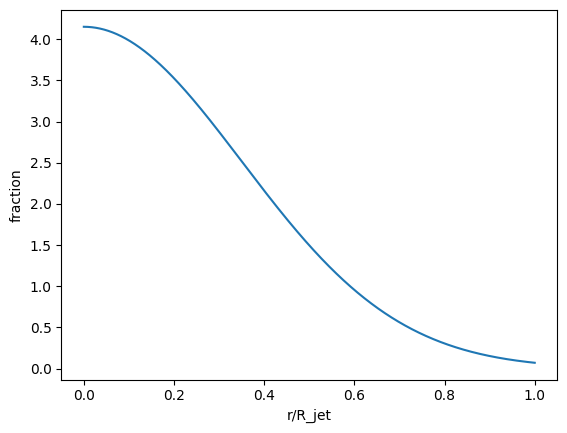

In [929]:
import matplotlib.pyplot as plt
numPoints = 10000000
radialDistance = np.linspace(0.,jetWidth,numPoints)
weightGaussian = 4.152 * np.exp(-0.5 * radialDistance**2 / jetSmoothingRadius**2) # np.sqrt(2 / (jetSmoothingRadius**2 * np.pi)) * 
# cumulativeGaussian = special.erf(radialDistance/(jetSmoothingRadius*np.sqrt(2.)))

plt.plot(radialDistance / jetWidth, weightGaussian)
# plt.plot(radialDistance / jetWidth, cumulativeGaussian)
plt.xlabel("r/R_jet")
plt.ylabel("fraction")


In [930]:
np.sum(weightGaussian) * (radialDistance[1]-radialDistance[0])

725.4122694590841

In [931]:
massInject = 105.
cellHeight = 0.2

volumeBase = np.pi * jetWidth**2 * cellHeight

densityUniform = massInject / volumeBase * np.ones(numPoints)
densityWeighted = densityUniform * weightGaussian

# print (densityUniform)

Text(0, 0.5, 'rho')

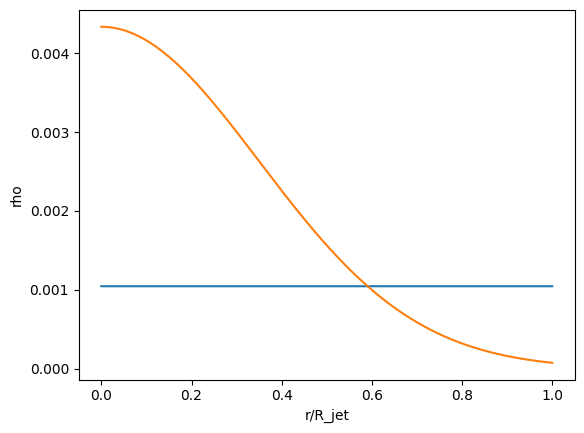

In [932]:
plt.plot(radialDistance / jetWidth, densityUniform)
plt.plot(radialDistance / jetWidth, densityWeighted)
plt.xlabel("r/R_jet")
plt.ylabel("rho")

In [933]:
calculatedUniformMass =  2 * np.pi * cellHeight * (jetWidth/numPoints) * np.sum(radialDistance * densityUniform)

print (calculatedUniformMass)

105.0


In [934]:
calculatedGaussianMass = 2 * np.pi * cellHeight * (jetWidth/numPoints) * np.sum(radialDistance * densityWeighted) 

print(calculatedGaussianMass)

105.0072464332598


Plot accretion rate as a time series

Text(0, 0.5, '$\\dot{M}$ (M$_{\\odot}$ yr$^{-1}$)')

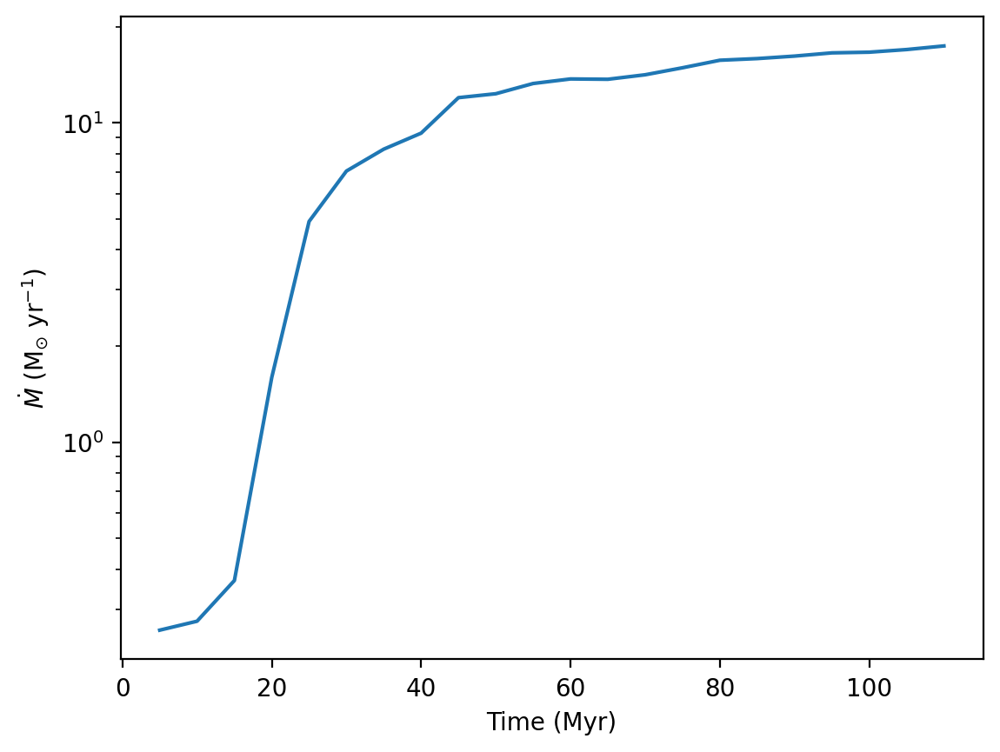

In [36]:
#From printouts
import matplotlib.pyplot as plt
simTime = np.linspace(5, 110, 22)
mDot = np.array([2.5764e-1, 2.7481e-01, 3.6853e-01, 1.5934e+00, 4.9104e+00, 7.0612e+00, 8.2693e+00, 9.2795e+00, 1.1988e+01, 1.2331e+01, 1.3276e+01, 1.3719e+01, 1.3687e+01, 1.4139e+01, 1.4871e+01, 1.5700e+01, 1.5889e+01, 1.6177e+01, 1.6558e+01, 1.6639e+01, 1.6959e+01, 1.7406e+01])
# print(simTime)

plt.figure(dpi=200)
plt.semilogy(simTime, mDot)
plt.xlabel("Time (Myr)")
plt.ylabel(r"$\dot{M}$ (M$_{\odot}$ yr$^{-1}$)")


Porting Jon Red's code to create restart file

In [ ]:
end_points_list = [] # this is a list of end points on the sphere, radius R
end_points_list /= code_length # convert end_points_list to code units
radial_distances_list = [] # this is a list of radial distances, log spaced, ends at R
n = 0
samplingSize = 200

ds = yt.load()

radius = ds.coordinates.pixelize_line(("gas","density"), (0.0, 0.0, 0.0), end_points_list[n], samplingSize)[0].to("pc")
density =  ds.coordinates.pixelize_line(("gas","density"), (0.0, 0.0, 0.0), end_points_list[n], samplingSize)[1].to("g/cm**3")
pressure =  ds.coordinates.pixelize_line(("gas","pressure"), (0.0, 0.0, 0.0), end_points_list[n], samplingSize)[1].to("Pa")



output_densities = np.interp(radial_distances_list[i], radius, density)



In [168]:
ds.coordinates.pixelize_line(("gas","density"), (0.0, 0.0, 0.0), (0.,0., 0.3), 200)

(unyt_array([0.        , 0.00151511, 0.00303023, 0.00454534, 0.00606045,
             0.00757557, 0.00909068, 0.01060579, 0.01212091, 0.01363602,
             0.01515113, 0.01666625, 0.01818136, 0.01969647, 0.02121159,
             0.0227267 , 0.02424181, 0.02575693, 0.02727204, 0.02878715,
             0.03030227, 0.03181738, 0.03333249, 0.0348476 , 0.03636272,
             0.03787783, 0.03939294, 0.04090806, 0.04242317, 0.04393828,
             0.0454534 , 0.04696851, 0.04848362, 0.04999874, 0.05151385,
             0.05302896, 0.05454408, 0.05605919, 0.0575743 , 0.05908942,
             0.06060453, 0.06211964, 0.06363476, 0.06514987, 0.06666498,
             0.0681801 , 0.06969521, 0.07121032, 0.07272544, 0.07424055,
             0.07575566, 0.07727078, 0.07878589, 0.080301  , 0.08181612,
             0.08333123, 0.08484634, 0.08636146, 0.08787657, 0.08939168,
             0.0909068 , 0.09242191, 0.09393702, 0.09545214, 0.09696725,
             0.09848236, 0.09999747, 0.10151259, 0.

In [169]:
ds.r["gas", "density"]

unyt_array([8.67591782e+09, 8.67591782e+09, 8.67591782e+09, ...,
            8.67591782e+09, 8.67591782e+09, 8.67591782e+09], 'code_mass/code_length**3')

In [171]:
ds.coordinates.pixelize(("gas","density"), (0.0, 0.0, 0.0), 1)

TypeError: CartesianCoordinateHandler.pixelize() missing 2 required positional arguments: 'bounds' and 'size'

In [357]:
pwd

'/Users/tvh0021/Library/CloudStorage/OneDrive-UNTSystem/RESEARCH_DOCS/BH_Accretion'

In [376]:
from misc_tools import log_scale_points

vect = [0., 0., 300.]
base = 1+2e-2
num_points = 250

log_scale_points(vect, base, num_points)

[(0.0, 0.0, 2.123627371010217),
 (0.0, 0.0, 2.1660999184304215),
 (0.0, 0.0, 2.2094219167990303),
 (0.0, 0.0, 2.253610355135011),
 (0.0, 0.0, 2.2986825622377114),
 (0.0, 0.0, 2.3446562134824656),
 (0.0, 0.0, 2.3915493377521146),
 (0.0, 0.0, 2.439380324507157),
 (0.0, 0.0, 2.4881679309973),
 (0.0, 0.0, 2.5379312896172466),
 (0.0, 0.0, 2.5886899154095913),
 (0.0, 0.0, 2.640463713717783),
 (0.0, 0.0, 2.6932729879921387),
 (0.0, 0.0, 2.747138447751982),
 (0.0, 0.0, 2.8020812167070215),
 (0.0, 0.0, 2.858122841041162),
 (0.0, 0.0, 2.915285297861985),
 (0.0, 0.0, 2.973591003819225),
 (0.0, 0.0, 3.0330628238956097),
 (0.0, 0.0, 3.0937240803735215),
 (0.0, 0.0, 3.1555985619809923),
 (0.0, 0.0, 3.2187105332206123),
 (0.0, 0.0, 3.2830847438850244),
 (0.0, 0.0, 3.3487464387627246),
 (0.0, 0.0, 3.415721367537979),
 (0.0, 0.0, 3.484035794888739),
 (0.0, 0.0, 3.5537165107865136),
 (0.0, 0.0, 3.6247908410022447),
 (0.0, 0.0, 3.697286657822289),
 (0.0, 0.0, 3.771232390978735),
 (0.0, 0.0, 3.84665703879

Obtain dfloor and pfloor for input file

In [7]:
mu = 0.5924489
hydrogen_mass_cgs = 1.6735575e-24
hydrogen_mass_astronomical = hydrogen_mass_cgs / solarMassCGS

number_density_floor_cgs = 1.e-3
number_density_floor_astronomical = number_density_floor_cgs / (MpcCGS**-3)

density_floor_astronomical = number_density_floor_astronomical * mu * hydrogen_mass_astronomical
density_floor_code = density_floor_astronomical / code_density

temperature_floor_astronomical = 2.e5

pressure_floor_code = number_density_floor_astronomical * temperature_floor_astronomical * boltzmannConstAstronomical / code_pressure

print("dfloor = ", "{:e}".format(density_floor_code))
print("pfloor = ", "{:e}".format(pressure_floor_code))

dfloor =  3.841198e+09
pfloor =  2.731714e+05


Compute the accretion torque based on Hopkins & Quataert 2011

In [39]:
def enclosed_stellar_mass(radius, total_stellar_mass, stellar_radius):
    return total_stellar_mass * (np.log(1. + radius / stellar_radius) - (radius / (stellar_radius + radius))) # Hernquist profile

SMBHMass = 6.5e9 # Msun
stellarMass = 3.e11 # Msun
stellarRadius = 2.e-3 # Mpc

def accretionTorque(radius, gas_mass, total_stellar_mass, stellar_radius, black_hole_mass):
    """
    mass in Msun, radius in Mpc
    """
    disk_mass = gas_mass
    stellar_mass = enclosed_stellar_mass(radius, total_stellar_mass, stellar_radius)

    alpha_T = 5 # normalization factor (HQ+11)

    f_d = disk_mass / (gas_mass + stellar_mass)
    f_gas = gas_mass / disk_mass
    f_0 = 0.31 * f_d**2 * (disk_mass / 1.e9)**(1./3.)

    return alpha_T * f_d**(5./2.) * (black_hole_mass / 1.e8)**(1./6.) * (disk_mass / 1.e9) * (radius / 1.e-4)**(-3./2.) * (1. + f_0/f_gas)**(-1.) # Msun yr**-1

In [127]:
r_naught = 1.5e-4 # Mpc, radius of the inner disk at 800 Myr, f=0.7
radiative_efficiency = 0.1

print(f"Time = {ds.current_time.to('kyr'):.3e}.")

sphere = ds.sphere("c", (r_naught, "Mpc"))
sphere = sphere.cut_region(["obj['gas', 'temperature'] < 1.e6"])
gas_mass = sphere.quantities.total_quantity(("gas", "mass")).to("Msun")
print(f"Gas mass within {r_naught*1.e6} pc = {gas_mass:.3e}.")
print(f"Stellar mass within {r_naught*1.e6} pc = {enclosed_stellar_mass(r_naught, stellarMass, stellarRadius):.3e} Msun.")

m_dot_from_torque = accretionTorque(r_naught, gas_mass.value, stellarMass, stellarRadius, SMBHMass)
print(f"Accretion rate from torque at {r_naught*1.e6} pc = {m_dot_from_torque:.3e} Msun/yr.")

print(f"Black hole accretion rate = {radiative_efficiency * m_dot_from_torque:.3e} Msun/yr.")

Time = 8.016e+05 kyr.
Gas mass within 150.0 pc = 5.335e+08 Msun.
Stellar mass within 150.0 pc = 7.660e+08 Msun.
Accretion rate from torque at 150.0 pc = 3.017e-01 Msun/yr.
Black hole accretion rate = 3.017e-02 Msun/yr.


Accretion rate scaling from sink region to horizon

In [126]:
scaling_slope = 1./2.
r_g = 6.24e-10 # Mpc; for M87
ten_r_g = 10. * r_g

M_dot_cold_sink = 1.5e-2

M_dot_sink = 5.4e-1 # Msun/yr
r_sink = 1.56e-7 # Mpc
print(f"Hot accretion rate at r_sink = {M_dot_sink:.3e} Msun/yr.")

M_dot_BH = M_dot_sink * (ten_r_g / r_sink)**scaling_slope
print(f"Expected black hole accretion rate = {M_dot_BH:.3e} Msun/yr.")

Hot accretion rate at r_sink = 5.400e-01 Msun/yr.
Expected black hole accretion rate = 1.080e-01 Msun/yr.


In [61]:
1.56e-7 / 250

6.24e-10

Time series of angular momentum z

In [3]:
ts = yt.load("/mnt/home/tha10/ceph/M87/meso-scale/product-0.7/*.athdf",units_override=units_override)

In [4]:
Lz_profile = []
time_series = []
saved_radius = False

for ds in ts:
    time_series.append(ds.current_time.to("Myr"))
    sp = ds.sphere("c", (100, "pc"))
    rp0 = yt.create_profile(
        sp,
        ("index", "radius"),
        ("gas", "angular_momentum_z"),
        units={("index", "radius"): "pc"},
        logs={("index", "radius"): False},
        extrema={("index", "radius"): (5., 100.)},
    )
    Lz_profile.append(rp0.field_data)
    if not saved_radius:
        radius_profile = rp0.x
        saved_radius = True

yt : [WARNING  ] 2024-02-25 23:08:06,540 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2024-02-25 23:08:06,541 Overriding length_unit: 0.064 Mpc.
yt : [INFO     ] 2024-02-25 23:08:06,542 Overriding time_unit: 10.0 Myr.
yt : [INFO     ] 2024-02-25 23:08:06,543 Overriding mass_unit: 1.0 Msun.
yt : [INFO     ] 2024-02-25 23:08:06,544 Overriding temperature_unit: 1.0 K.
yt : [INFO     ] 2024-02-25 23:08:06,605 Parameters: current_time              = 0.0
yt : [INFO     ] 2024-02-25 23:08:06,605 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2024-02-25 23:08:06,606 Parameters: domain_left_edge          = [-1. -1. -1.]
yt : [INFO     ] 2024-02-25 23:08:06,607 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2024-02-25 23:08:06,607 Parameters: cosmological_simulation   = 0
yt : [WARNING  ] 2024-02-25 23:08:08,222 Overriding code units: Use this option only if you

In [14]:
radius_profile[3]
import matplotlib.pyplot as plt

Text(0, 0.5, '$L_{z}~(\\mathrm{g~cm^2~s^{-1}})$')

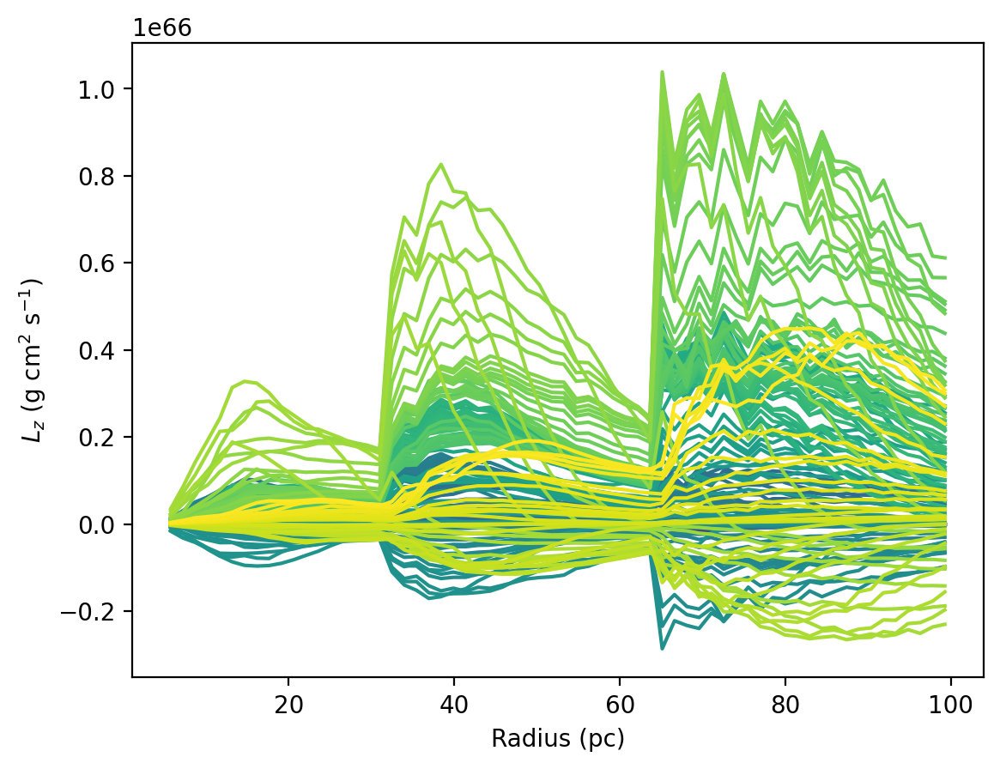

In [15]:
field = "gas", "angular_momentum_z"
plt.figure(dpi=200)
for i, Lz in enumerate(Lz_profile):
    plt.plot(radius_profile, Lz[field].to("g*cm**2/s"), label=f"{time_series[i]} Myr", c=plt.cm.viridis(i/len(Lz_profile)))
plt.xlabel("Radius (pc)")
plt.ylabel(r"$L_{z}~(\mathrm{g~cm^2~s^{-1}})$")

In [16]:
torque_over_time = np.zeros((len(Lz_profile)-1, len(radius_profile)))

for n, radius in enumerate(radius_profile):
    # print(f"Radius = {radius} pc")
    for i in range(1, len(Lz_profile)):
        torque_code = (Lz_profile[i][field] - Lz_profile[i-1][field]) / (time_series[i] - time_series[i-1])
        torque_over_time[i-1,n] = torque_code[n].to("g*cm**2/s**2")

Text(0, 0.5, '$\\tau_{z}~(\\mathrm{g~cm^2~s^{-2}})$')

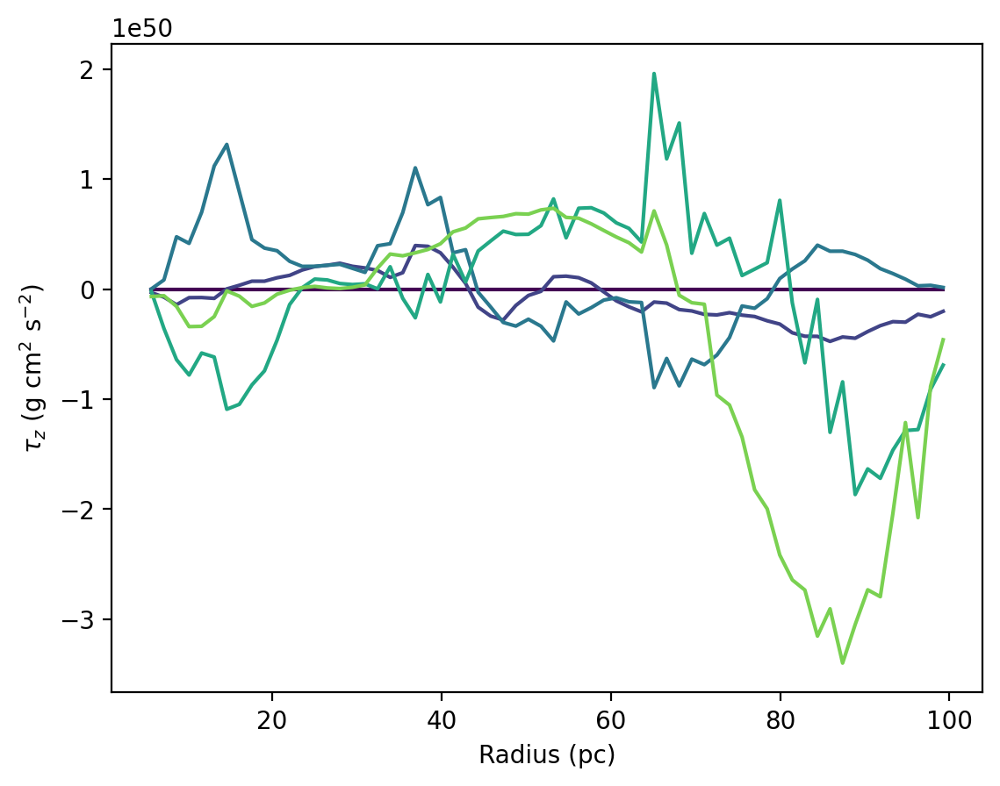

In [17]:
plt.figure(dpi=200)
for i, Tz in enumerate(torque_over_time):
    if i % 40 == 0:
        plt.plot(radius_profile, Tz, label=f"{time_series[i]} Myr", c=plt.cm.viridis(i/len(torque_over_time)))
plt.xlabel("Radius (pc)")
plt.ylabel(r"$\tau_{z}~(\mathrm{g~cm^2~s^{-2}})$")

(500.0, 1000.0)

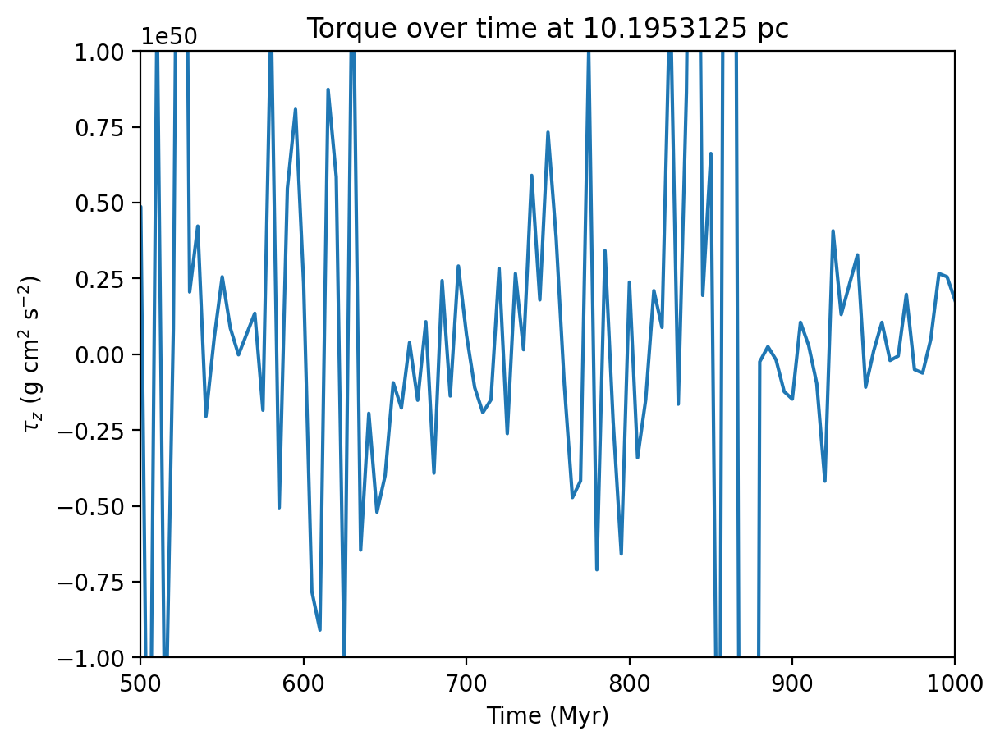

In [22]:
r = 3
plt.figure(dpi=200)
plt.plot(time_series[1:],torque_over_time[:,r])
plt.xlabel("Time (Myr)")
plt.ylabel(r"$\tau_{z}~(\mathrm{g~cm^2~s^{-2}})$")
plt.title(f"Torque over time at {radius_profile[r]}")
plt.ylim(-1.e50,1.e50)
plt.xlim(500,1000)

Calculate the alpha parameter

In [ ]:
distance_to_disk = 100 * phc.pc

def VolumeAverage(a):
    return np.sum(a) / len(a)

def CalculateAlpha(vr : np.ndarray, vphi : np.ndarray, sound_speed : float) -> float:
    stress_term = VolumeAverage(vr*vphi)

    return stress_term / (sound_speed**2)

# next, need to obtain a sphere of radius 100 pc, and calculate the sound speed inside the disk, also need to extract the velocity for all cold gas elements along the edge of the sphere

